# Structure-based Asthma Risk Screening (CTD positives + PubChem SMILES)
    
This notebook trains a structure-based asthma-risk classifier using:
- CTD asthma-associated chemicals as the positive set
- PubChem to resolve CTD identifiers to canonical SMILES
- Property-matched decoy controls sampled from BindingDB (as reliable negatives)
    
It then screens a candidate set ("Isocyanates.csv") with multi-descriptor clustering, asthma-risk scoring, optional PubChem GHS hazard flags (H334/H335), cell-line accessibility models (BEAS-2B / EOL-1 / HASMC), and a lightweight DTI model (BindingDB-pretrained) to generate an affinity fingerprint against user-provided target sequences.
Label convention:
- Asthma-associated
- Control


## Data requirements

Required inputs:
- `CTD_D001249_chemicals_20251209210909.xlsx` (CTD asthma-associated chemicals; positive list)
- `Isocyanates.csv` (candidate set; must include a SMILES column)
- `BindingDB_All.tsv` (BindingDB full TSV; used for decoy controls and DTI pretraining; very large)

Optional inputs:
- `asthma_human.fasta` (FASTA sequences of asthma-related human proteins; used as the default target panel for affinity fingerprinting)
- `target_protein_sequences.fasta` (optional fallback target panel)
- `BEAS-2B.csv`, `EOL-1.csv`, `HASMC.csv` (ChEMBL exports of compounds active on each cell line)

Outputs:
- `models/`, `interim/`, `results/`


## Initialization

Imports, global random seed, and figure styling.


In [1]:
import os
import csv
from dataclasses import dataclass
from pathlib import Path
from typing import Optional, Tuple

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from rdkit import Chem, DataStructs, RDLogger
from rdkit.Chem import Descriptors, AllChem, rdMolDescriptors, Descriptors3D
from rdkit.Chem.rdFingerprintGenerator import GetMorganGenerator

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    classification_report,
    confusion_matrix,
)
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering

import pubchempy as pcp
from tqdm.auto import tqdm

import requests
import time

import torch
from torch.utils.data import DataLoader, TensorDataset
from torch import nn
import seaborn as sns
from sklearn.metrics import roc_curve, precision_recall_curve

In [2]:
# Global plot style (English-only figures)
# Requirement: all 2D plots are boxed (all spines) and no internal grid lines.
sns.set_theme(style='ticks', context='notebook', palette='deep')
plt.rcParams.update({
    'figure.dpi': 120,
    'savefig.dpi': 300,
    'figure.figsize': (6, 4),
    'font.family': 'DejaVu Sans',

    'axes.grid': False,
    'axes.edgecolor': '0.2',
    'axes.linewidth': 1.0,
    'axes.spines.top': True,
    'axes.spines.right': True,
    'axes.spines.left': True,
    'axes.spines.bottom': True,

    'axes.titleweight': 'bold',
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'legend.fontsize': 11,
    'legend.frameon': False,
})
RANDOM_STATE = globals().get('RANDOM_STATE', 42)
np.random.seed(RANDOM_STATE)
RDLogger.DisableLog('rdApp.*')


def clean_ax(ax):
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(True)
    return ax


def legend_outside(ax, title=None, loc='upper left', bbox_to_anchor=(1.02, 1.0)):
    leg = ax.get_legend()
    if leg is None:
        return None
    ax.legend(loc=loc, bbox_to_anchor=bbox_to_anchor, frameon=False, title=title)
    return ax.get_legend()


def annotate_bars_center(ax, fmt='{:.0f}', fontsize=11, fontweight='bold'):
    for container in ax.containers:
        for patch in container:
            try:
                height = float(patch.get_height())
            except Exception:
                continue
            if np.isnan(height):
                continue
            x = patch.get_x() + patch.get_width() / 2
            y = patch.get_y() + height / 2
            fc = patch.get_facecolor()
            r, g, b = float(fc[0]), float(fc[1]), float(fc[2])
            lum = 0.2126 * r + 0.7152 * g + 0.0722 * b
            color = 'white' if lum < 0.5 else 'black'
            ax.text(
                x,
                y,
                fmt.format(height),
                ha='center',
                va='center',
                fontsize=fontsize,
                fontweight=fontweight,
                color=color,
            )
    return ax


## Configuration

Centralized paths and column names.


In [3]:
@dataclass
class Config:
    # Paths
    data_dir: Path = Path(os.environ.get('AM_DATA_DIR', 'data'))
    interim_dir: Path = Path('interim')
    models_dir: Path = Path('models')
    results_dir: Path = Path('results')

    # Input files
    ctd_asthma_file: str = 'CTD_D001249_chemicals_20251209210909.xlsx'
    bindingdb_file: str = 'BindingDB_All.tsv'

    # Column names (edit if needed)
    ctd_chem_name_col: str = 'Chemical Name'
    ctd_cas_col: str = 'CAS RN'

    # Training label column
    asthma_label_col: str = 'asthma_label'

    # Fingerprint configuration
    fp_radius: int = 2
    fp_n_bits: int = 2048

cfg = Config()
for d in [cfg.data_dir, cfg.interim_dir, cfg.models_dir, cfg.results_dir]:
    d.mkdir(exist_ok=True)


FIG_DIR = cfg.results_dir / 'figures'
FIG_DIR.mkdir(exist_ok=True)

SAVE_FIGURES = True


# Global label palettes (consistent across figures)
RISK_LABEL_ORDER = ['Control', 'Asthma-associated']
RISK_LABEL_PALETTE = {
    'Control': sns.color_palette('deep', 2)[0],
    'Asthma-associated': sns.color_palette('deep', 2)[1],
}


def save_fig(name: str, fig=None, exts=('png', 'pdf')):
    if not SAVE_FIGURES:
        return None
    fig = fig or plt.gcf()
    paths = []
    for ext in exts:
        out = FIG_DIR / f'{name}.{ext}'
        fig.savefig(out, bbox_inches='tight')
        paths.append(out)
    return paths



def save_rdkit_image(img, path: Path):
    if not SAVE_FIGURES:
        return None
    try:
        img.save(path)
        return path
    except Exception:
        import io
        from PIL import Image as PILImage

        data = getattr(img, 'data', None)
        if data is None and hasattr(img, '_repr_png_'):
            try:
                data = img._repr_png_()
            except Exception:
                data = None
        if data is not None:
            PILImage.open(io.BytesIO(data)).save(path)
            return path
    return None



def make_unique_labels(labels):
    seen = {}
    out = []
    for x in labels:
        x = 'Unknown' if x is None else str(x)
        if x not in seen:
            seen[x] = 1
            out.append(x)
        else:
            seen[x] += 1
            out.append(f'{x} ({seen[x]})')
    return out



def wrap_legend(text, width=22, max_lines=2):
    import textwrap

    s = 'Unknown' if text is None else str(text)
    s = ' '.join(s.split())
    if not s:
        s = 'Unknown'
    lines = textwrap.wrap(s, width=width) or ['Unknown']
    if len(lines) > max_lines:
        lines = lines[:max_lines]
        lines[-1] = (lines[-1][: max(1, width - 1)] + '…') if len(lines[-1]) >= width else (lines[-1] + '…')
    return '\n'.join(lines)


def categorical_palette(values, palette: str = 'mako'):
    import pandas as pd
    import seaborn as sns

    s = pd.Series(values).dropna()
    uniq = s.unique().tolist()
    try:
        uniq_sorted = sorted(uniq, key=lambda x: float(x))
    except Exception:
        uniq_sorted = sorted(uniq)

    colors = sns.color_palette(palette, n_colors=max(1, len(uniq_sorted)))
    pal = {}
    for u, c in zip(uniq_sorted, colors):
        pal[u] = c
        pal[str(u)] = c
    return uniq_sorted, pal



def resolve_input_path(filename: str, env_key: str | None = None) -> Path:
    candidates: list[Path] = []

    if env_key:
        v = os.environ.get(env_key)
        if v:
            candidates.append(Path(v).expanduser())

    candidates.append(cfg.data_dir / filename)
    candidates.append(Path(filename))

    for cand in candidates:
        if cand.exists():
            return cand

    looked = os.linesep.join([f'- {c}' for c in candidates])
    hint = f'Set {env_key} to an existing file path.' if env_key else 'Set AM_DATA_DIR or place the file under data/.'

    raise FileNotFoundError(
        f'Missing required file: {filename}\nSearched:\n{looked}\n{hint}'
    )


## Candidate set: Isocyanates — descriptors, coordination features, clustering

Compute RDKit physicochemical + 3D shape descriptors and SMARTS-based coordination features, then perform PCA and unsupervised clustering.


In [4]:

isoc_path = resolve_input_path('Isocyanates.csv', env_key='AM_ISOCYANATES_CSV')

isoc_raw = pd.read_csv(isoc_path)
isoc_raw.columns = [c.strip() for c in isoc_raw.columns]
isoc_raw = isoc_raw.rename(columns={'cid': 'CID', 'smiles': 'SMILES'})
isoc_raw = isoc_raw.dropna(subset=['SMILES']).reset_index(drop=True)

# Prefer an existing name column if present; otherwise resolve names from PubChem (CID -> Title)
# with offline fallback (BindingDB CID -> ligand name).
from collections import Counter, defaultdict

NAME_COL_CANDIDATES = [
    'compound_name', 'Compound Name', 'Name', 'Chemical Name', 'chemical_name',
    'title', 'Title', 'preferred_name', 'Preferred Name'
]

def _coalesce_name_column(df: pd.DataFrame) -> pd.Series:
    s = pd.Series(pd.NA, index=df.index, dtype='object')
    for col in NAME_COL_CANDIDATES:
        if col in df.columns:
            vals = df[col]
            if not isinstance(vals, pd.Series):
                continue
            vals = vals.astype(str).str.strip()
            vals = vals.where(vals.ne('') & ~vals.str.lower().eq('nan'), other=pd.NA)
            s = s.fillna(vals)
    return s

def _pubchem_ok(timeout: float = 6.0) -> bool:
    try:
        url = 'https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/name/benzene/property/IsomericSMILES/JSON'
        r = requests.get(url, timeout=timeout)
        return int(getattr(r, 'status_code', 0) or 0) == 200
    except Exception:
        return False

def _titles_session():
    s = requests.Session()
    adapter = requests.adapters.HTTPAdapter(pool_connections=8, pool_maxsize=8, max_retries=0)
    s.mount('https://', adapter)
    s.headers.update({'User-Agent': os.environ.get('AM_HTTP_UA', 'AM-MOF/1.0 (CID title lookup)')})
    return s

def _pubchem_titles_from_cids(cids, batch_size=50, sleep=0.12, timeout=20, verbose=False, max_retries=2):
    cids = [int(x) for x in pd.Series(cids).dropna().astype(int).unique().tolist()]
    out = {}
    if not cids:
        return out
    if not _pubchem_ok(timeout=6.0):
        if verbose:
            print('PubChem is not available (server busy); skip CID title lookup.')
        return out
    sess = _titles_session()

    url_tmpl = 'https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/cid/{cids}/property/Title/JSON'
    for i in tqdm(range(0, len(cids), batch_size), desc='PubChem Title lookup', leave=False):
        batch = cids[i:i + batch_size]
        url = url_tmpl.format(cids=','.join(map(str, batch)))
        backoff = 0.5
        for _ in range(int(max_retries)):
            try:
                resp = sess.get(url, timeout=timeout)
                code = int(getattr(resp, 'status_code', 0) or 0)
                if code == 200:
                    props = resp.json().get('PropertyTable', {}).get('Properties', [])
                    for p in props:
                        cid = p.get('CID')
                        title = p.get('Title')
                        if cid is not None and title:
                            out[int(cid)] = str(title)
                    break
                if code in (400, 404):
                    break
                if code in (429, 500, 502, 503, 504):
                    time.sleep(backoff)
                    backoff = min(5.0, backoff * 1.7)
                    continue
                if verbose:
                    print(f'PubChem Title HTTP {code} (batch offset={i})')
                break
            except Exception as e:
                if verbose:
                    print(f'PubChem Title request failed: {e}')
                time.sleep(backoff)
                backoff = min(5.0, backoff * 1.7)
                continue
        time.sleep(sleep)
    return out

TITLE_VERBOSE = bool(int(os.environ.get('AM_PUBCHEM_VERBOSE', '0')))
title_cache_path = cfg.interim_dir / 'pubchem_cid_titles.csv'
title_cache = {}
if title_cache_path.exists():
    try:
        tmp = pd.read_csv(title_cache_path)
        if {'CID', 'compound_name'}.issubset(tmp.columns):
            title_cache = dict(zip(tmp['CID'].astype(int).tolist(), tmp['compound_name'].astype(str).tolist()))
    except Exception:
        title_cache = {}

if 'compound_name' not in isoc_raw.columns:
    isoc_raw['compound_name'] = np.nan

# Fill from any existing name-like columns
name_series = _coalesce_name_column(isoc_raw)
isoc_raw['compound_name'] = isoc_raw['compound_name'].astype('object').fillna(name_series)

if 'CID' in isoc_raw.columns:
    cids_all = pd.Series(isoc_raw['CID']).dropna()
    try:
        cids_all = cids_all.astype(int)
    except Exception:
        cids_all = cids_all.astype(float).astype(int)

    missing = [int(cid) for cid in cids_all.unique().tolist() if int(cid) not in title_cache]
    max_titles = int(os.environ.get('AM_PUBCHEM_TITLES_MAX', '0'))
    if max_titles > 0:
        missing = missing[:max_titles]

    if missing:
        new_map = _pubchem_titles_from_cids(
            missing,
            batch_size=50,
            sleep=float(os.environ.get('AM_PUBCHEM_SLEEP', '0.12')),
            timeout=20,
            verbose=TITLE_VERBOSE,
        )
        title_cache.update(new_map)
        pd.DataFrame({'CID': list(title_cache.keys()), 'compound_name': list(title_cache.values())}).sort_values('CID').to_csv(title_cache_path, index=False)

    # Apply PubChem title cache (if available)
    cid_int = pd.to_numeric(isoc_raw['CID'], errors='coerce').astype('Int64')
    isoc_raw['compound_name'] = isoc_raw['compound_name'].fillna(cid_int.map(lambda x: title_cache.get(int(x), np.nan) if pd.notna(x) else np.nan))

    # Offline fallback: BindingDB CID -> ligand name
    BDB_CID_FALLBACK = bool(int(os.environ.get('AM_BINDINGDB_CID_FALLBACK', '1')))
    if BDB_CID_FALLBACK:
        bdb_cache_path = cfg.interim_dir / 'bindingdb_cid_name_map.csv'
        cid_name_map = {}
        if bdb_cache_path.exists():
            try:
                tmp = pd.read_csv(bdb_cache_path)
                if {'CID', 'compound_name'}.issubset(tmp.columns):
                    cid_name_map = dict(zip(tmp['CID'].astype(int).tolist(), tmp['compound_name'].astype(str).tolist()))
            except Exception:
                cid_name_map = {}

        need = cid_int[isoc_raw['compound_name'].isna() & cid_int.notna()].astype(int).unique().tolist()
        need = [int(x) for x in need if int(x) not in cid_name_map]

        if need:
            try:
                bdb_path = resolve_input_path(cfg.bindingdb_file, env_key='AM_BINDINGDB_TSV')
            except Exception:
                bdb_path = None

            if bdb_path is not None and Path(bdb_path).exists():
                target = set(int(x) for x in need)
                counts = defaultdict(Counter)
                found = set()
                max_rows_env = os.environ.get('AM_BINDINGDB_CID_MAX_ROWS', '0').strip().lower()
                max_rows = None if max_rows_env in {'0', '', 'none'} else int(max_rows_env)
                with open(bdb_path, 'r', encoding='utf-8', errors='ignore', newline='') as f:
                    reader = csv.reader(f, delimiter='\t')
                    header = next(reader)
                    if 'PubChem CID' in header and 'BindingDB Ligand Name' in header:
                        i_cid = header.index('PubChem CID')
                        i_name = header.index('BindingDB Ligand Name')
                        it = reader
                        if max_rows is not None:
                            it = (row for _, row in zip(range(max_rows), reader))
                        for row in tqdm(it, desc='Scan BindingDB for CID→name', unit='rows', leave=False):
                            if i_cid >= len(row) or i_name >= len(row):
                                continue
                            c = (row[i_cid] or '').strip()
                            if not c.isdigit():
                                continue
                            cid = int(c)
                            if cid not in target:
                                continue
                            nm = (row[i_name] or '').strip()
                            if not nm or nm == '-':
                                continue
                            counts[cid][nm] += 1
                            found.add(cid)
                            if len(found) == len(target):
                                break
                for cid, ctr in counts.items():
                    nm, _ = ctr.most_common(1)[0]
                    cid_name_map[int(cid)] = str(nm)
                if cid_name_map:
                    try:
                        pd.DataFrame({'CID': list(cid_name_map.keys()), 'compound_name': list(cid_name_map.values())}).sort_values('CID').to_csv(bdb_cache_path, index=False)
                    except Exception:
                        pass

        if cid_name_map:
            isoc_raw['compound_name'] = isoc_raw['compound_name'].fillna(cid_int.map(lambda x: cid_name_map.get(int(x), np.nan) if pd.notna(x) else np.nan))

# Final fallback: CID-based label (better than 'Unknown')
cid_label = pd.to_numeric(isoc_raw.get('CID', pd.Series(index=isoc_raw.index, dtype=float)), errors='coerce')
cid_label = cid_label.apply(lambda x: f'CID:{int(x)}' if pd.notna(x) else pd.NA)
isoc_raw['compound_name'] = isoc_raw['compound_name'].astype('object').fillna(cid_label).fillna('Unknown')

print(f'Isocyanates rows: {len(isoc_raw)}')
print('Example columns:', isoc_raw.columns[:10].tolist())
print('Name coverage:', float((isoc_raw['compound_name'] != 'Unknown').mean()))


PubChem Title lookup:   0%|          | 0/7 [00:00<?, ?it/s]

Scan BindingDB for CID→name: 0rows [00:00, ?rows/s]

Isocyanates rows: 308
Example columns: ['CID', 'SMILES', 'MW', 'Vol', 'Dense', 'nHA', 'nHD', 'TPSA', 'nRot', 'nRing']
Name coverage: 1.0


In [5]:
coord_smarts = {
    "pyridine_N": "[nH0X2r5,r6]",
    "imidazole_N": "[nH0X2r5]1cnc[nH1]1",
    "carboxylate_O": "[CX3](=O)[O-]",
    "carboxylic_acid": "C(=O)[O;H1]",
    "thiol_S": "[SX2H]",
    "thiolate_S": "[S-;X1]",
    "amine_primary": "[NX3;H2][CX4]",
    "amine_secondary": "[NX3;H1][CX4]",
    "amine_tertiary": "[NX3;H0][CX4]",
    "nitrile_N": "C#N",
    "isocyanate": "N=C=O",
    "halogen": "[F,Cl,Br,I]",
}
coord_patterns = {k: Chem.MolFromSmarts(v) for k, v in coord_smarts.items()}


def count_coordination_features(mol: Chem.Mol) -> dict:
    feats = {}
    for name, patt in coord_patterns.items():
        if patt is None:
            feats[f"coord_{name}"] = np.nan
        else:
            feats[f"coord_{name}"] = len(mol.GetSubstructMatches(patt))
    return feats


def compute_isocyanate_descriptors(smiles: str) -> Optional[dict]:
    smi = str(smiles).strip()
    if not smi:
        return None
    mol2d = Chem.MolFromSmiles(smi)
    if mol2d is None:
        return None

    mol3d = Chem.AddHs(mol2d)
    has_conf = False
    try:
        AllChem.EmbedMolecule(mol3d, randomSeed=RANDOM_STATE)
        AllChem.UFFOptimizeMolecule(mol3d, maxIters=200)
        has_conf = mol3d.GetNumConformers() > 0
    except Exception:
        mol3d = mol2d

    desc = {
        "MolWt": Descriptors.MolWt(mol2d),
        "MolLogP": Descriptors.MolLogP(mol2d),
        "TPSA": Descriptors.TPSA(mol2d),
        "HBD": Descriptors.NumHDonors(mol2d),
        "HBA": Descriptors.NumHAcceptors(mol2d),
        "RotatableBonds": Descriptors.NumRotatableBonds(mol2d),
        "AromaticRings": Chem.rdMolDescriptors.CalcNumAromaticRings(mol2d),
        "MolMR_volume_proxy": Descriptors.MolMR(mol2d),
        "LabuteASA": rdMolDescriptors.CalcLabuteASA(mol2d),
    }

    geom_keys = [
        "PBF",
        "PMI1",
        "PMI2",
        "PMI3",
        "InertialShapeFactor",
        "Asphericity",
        "Eccentricity",
        "NPR1",
        "NPR2",
        "RadiusOfGyration",
    ]
    if has_conf:
        desc.update(
            {
                "PBF": rdMolDescriptors.CalcPBF(mol3d),
                "PMI1": Descriptors3D.PMI1(mol3d),
                "PMI2": Descriptors3D.PMI2(mol3d),
                "PMI3": Descriptors3D.PMI3(mol3d),
                "InertialShapeFactor": Descriptors3D.InertialShapeFactor(mol3d),
                "Asphericity": Descriptors3D.Asphericity(mol3d),
                "Eccentricity": Descriptors3D.Eccentricity(mol3d),
                "NPR1": Descriptors3D.NPR1(mol3d),
                "NPR2": Descriptors3D.NPR2(mol3d),
                "RadiusOfGyration": Descriptors3D.RadiusOfGyration(mol3d),
            }
        )
    else:
        desc.update({k: np.nan for k in geom_keys})

    desc.update(count_coordination_features(mol2d))
    return desc


In [6]:
descriptor_rows = []
for _, row in tqdm(isoc_raw.iterrows(), total=len(isoc_raw), desc="Computing descriptors", leave=False):
    smi = row["SMILES"]
    desc = compute_isocyanate_descriptors(smi)
    if desc is None:
        continue
    desc["CID"] = row.get("CID", None)
    desc["compound_name"] = row.get("compound_name", None)
    desc["SMILES"] = smi
    descriptor_rows.append(desc)

isoc_desc_df = pd.DataFrame(descriptor_rows)
print(f"Molecules with computed descriptors: {len(isoc_desc_df)}")
isoc_desc_df.head()


Computing descriptors:   0%|          | 0/308 [00:00<?, ?it/s]

Molecules with computed descriptors: 308


,MolWt,MolLogP,TPSA,HBD,HBA,RotatableBonds,AromaticRings,MolMR_volume_proxy,LabuteASA,PBF,...,coord_thiolate_S,coord_amine_primary,coord_amine_secondary,coord_amine_tertiary,coord_nitrile_N,coord_isocyanate,coord_halogen,CID,compound_name,SMILES
0,125.080,-0.4635,63.57,0,3,1,0,18.1493,39.017904,0.476779,...,0,0,0,0,0,1,1,12636793,Fluorosulfonyl isocyanate,O=C=NS(=O)(=O)F
1,159.896,1.9079,46.50,0,2,1,0,27.4340,49.333047,0.550979,...,0,0,0,0,0,1,2,70090,Phosphorisocyanatidic dichloride,O=C=NP(=O)(Cl)Cl
2,143.167,0.3543,46.50,0,4,1,0,33.9915,56.534665,0.736200,...,0,0,0,0,0,1,0,85802751,3-Isocyanatothiolan-2-one,O=C=NC1CCSC1=O
3,91.497,0.5185,29.43,0,2,1,0,18.8415,34.464304,0.425752,...,0,0,0,0,0,1,1,12591919,Chloro(isocyanato)methane,O=C=NCCl
4,141.535,-0.1942,63.57,0,3,1,0,22.8943,44.363941,0.493597,...,0,0,0,0,0,1,1,70918,Chlorosulfonyl isocyanate,O=C=NS(=O)(=O)Cl


### PCA + clustering

Descriptors are standardized, reduced by PCA (3 components), and clustered (KMeans; optional hierarchical clustering).


In [7]:
RANDOM_STATE = globals().get('RANDOM_STATE', 42)
descriptor_cols = [
    "MolWt",
    "MolLogP",
    "TPSA",
    "HBD",
    "HBA",
    "RotatableBonds",
    "AromaticRings",
    "MolMR_volume_proxy",
    "LabuteASA",
    "PBF",
    "PMI1",
    "PMI2",
    "PMI3",
    "InertialShapeFactor",
    "Asphericity",
    "Eccentricity",
    "NPR1",
    "NPR2",
    "RadiusOfGyration",
]
coord_cols = [c for c in isoc_desc_df.columns if c.startswith("coord_")]
feature_cols = [c for c in descriptor_cols + coord_cols if c in isoc_desc_df.columns]

feat_mat = isoc_desc_df[feature_cols].copy()
# Impute missing values: column median, then 0 fallback
feat_mat = feat_mat.fillna(feat_mat.median())
feat_mat = feat_mat.fillna(0)
# (e.g., some 3D descriptors may fail)
feat_mat = feat_mat.fillna(feat_mat.median())

scaler = StandardScaler()
X_scaled = scaler.fit_transform(feat_mat)

pca = PCA(n_components=min(3, X_scaled.shape[1]), random_state=RANDOM_STATE)
X_pca = pca.fit_transform(X_scaled)

n_clusters = min(5, len(isoc_desc_df))
km = KMeans(n_clusters=n_clusters, random_state=RANDOM_STATE, n_init=10)
cluster_labels = km.fit_predict(X_scaled)

isoc_clustered = isoc_desc_df.copy()
isoc_clustered[["PC1", "PC2", "PC3"]] = X_pca[:, :3]
isoc_clustered["cluster_km"] = cluster_labels

print("PCA explained variance ratio:", pca.explained_variance_ratio_)


PCA explained variance ratio: [0.38669096 0.14701689 0.10690206]


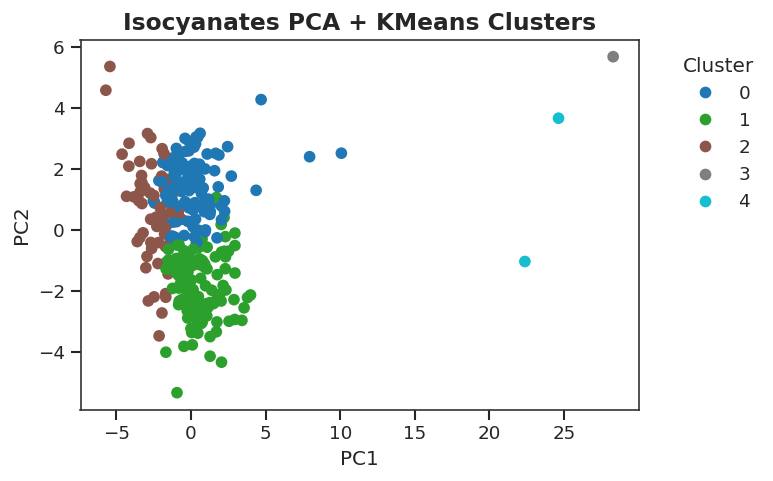

Saved isocyanates descriptors + clusters: results/isocyanates_descriptors_clusters.csv


In [8]:
# 2D PCA scatter (PC1 vs PC2)
if 'CLUSTER_PALETTE' not in globals():
    CLUSTER_ORDER, CLUSTER_PALETTE = categorical_palette(
        isoc_clustered['cluster_km'],
        palette=os.environ.get('AM_CLUSTER_PALETTE', 'mako'),
    )

fig, ax = plt.subplots(figsize=(6.4, 4.2))
fig.subplots_adjust(right=0.78)
sns.scatterplot(
    data=isoc_clustered,
    x='PC1',
    y='PC2',
    hue='cluster_km',
    palette=CLUSTER_PALETTE,
    alpha=0.85,
    s=34,
    edgecolor='none',
    ax=ax,
)
ax.set_title('Isocyanates PCA + KMeans clusters')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
legend_outside(ax, title='Cluster', loc='center left', bbox_to_anchor=(1.02, 0.5))
clean_ax(ax)
save_fig('isoc_pca_scatter_2d', fig)
plt.show()

# Persist clustered table
isoc_save_path = cfg.results_dir / 'isocyanates_descriptors_clusters.csv'
isoc_clustered.to_csv(isoc_save_path, index=False)
print(f"Saved isocyanates descriptors + clusters: {isoc_save_path}")


### Descriptor statistics and cluster profiling

Distribution plots, per-cluster summaries, and representative molecules.


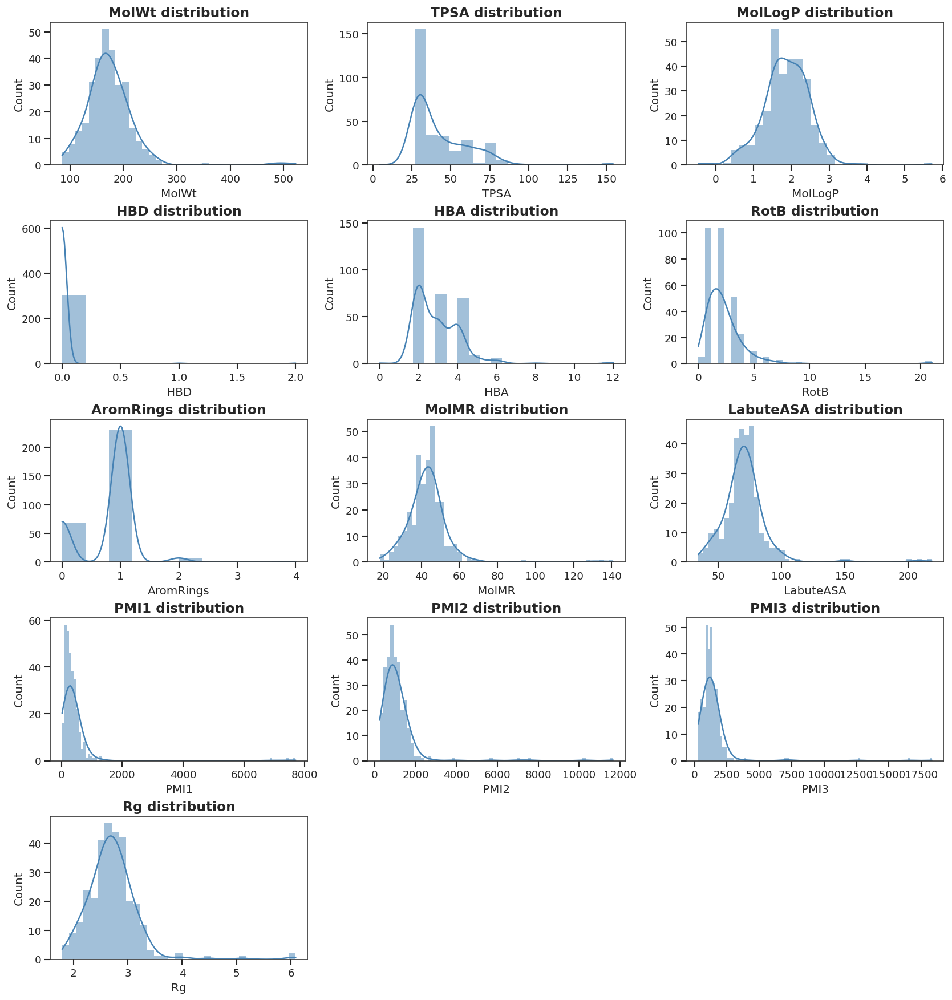

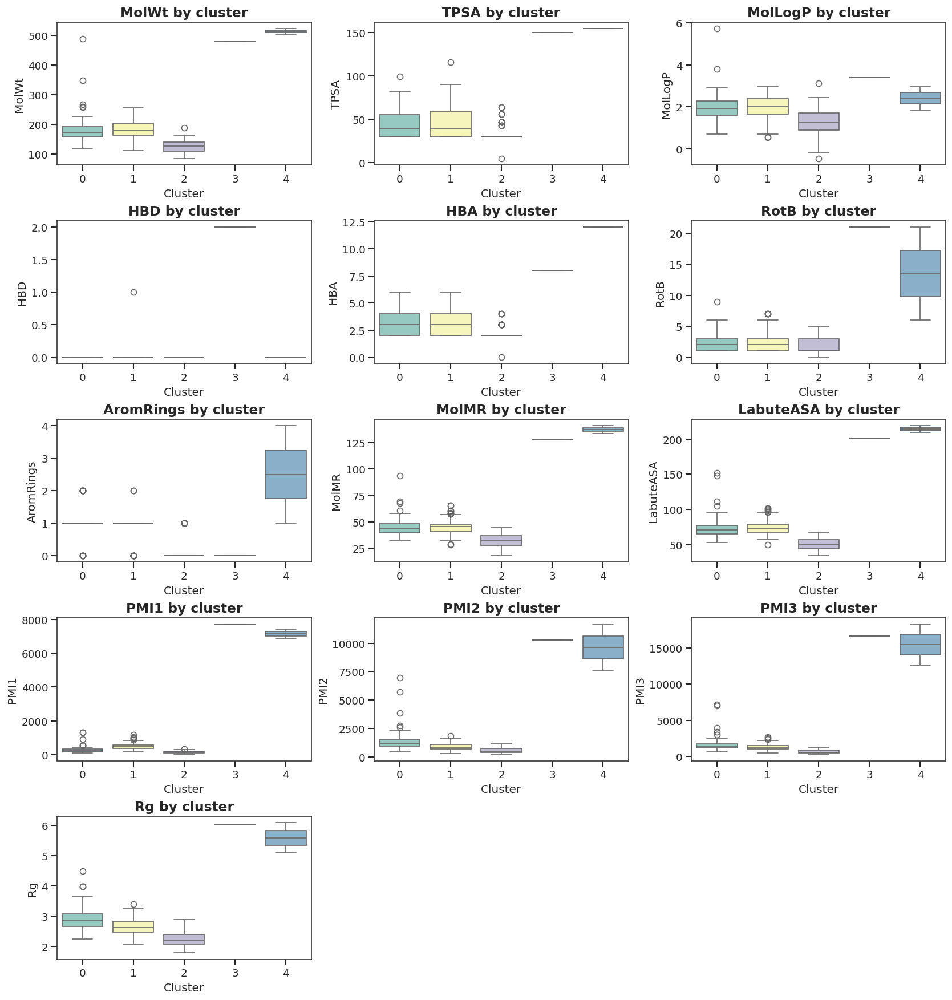

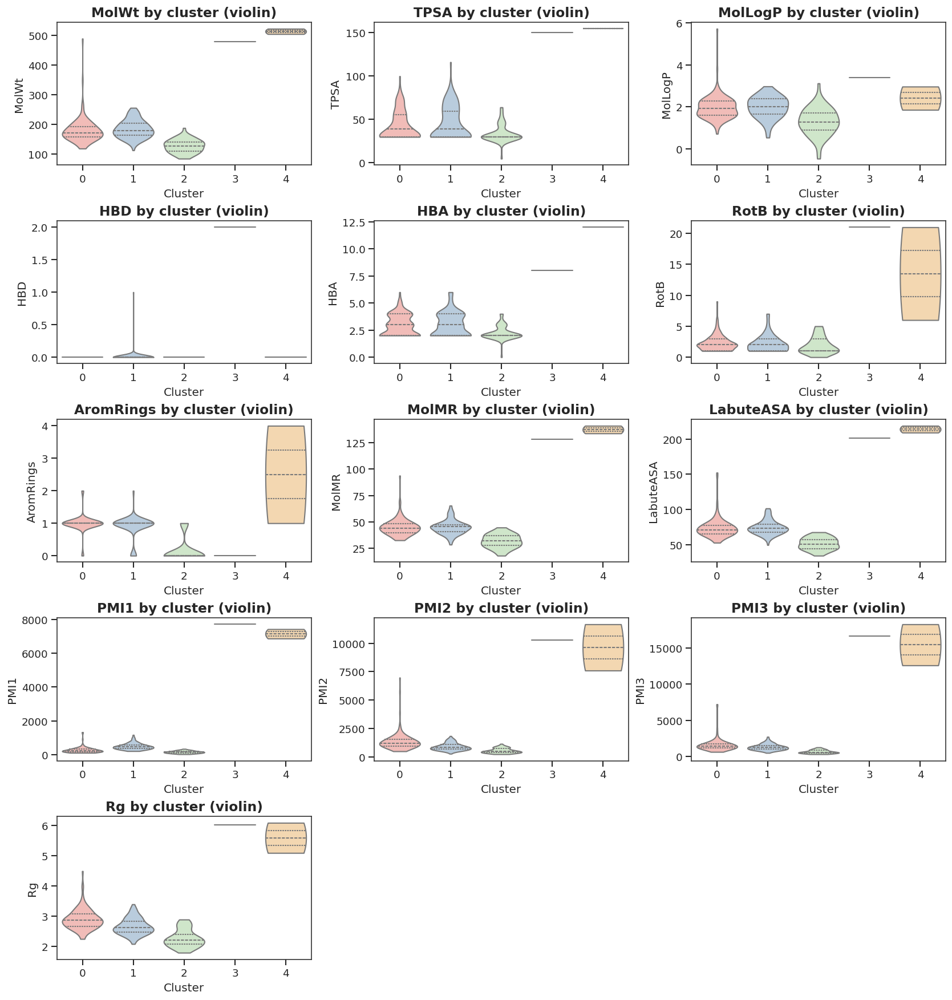

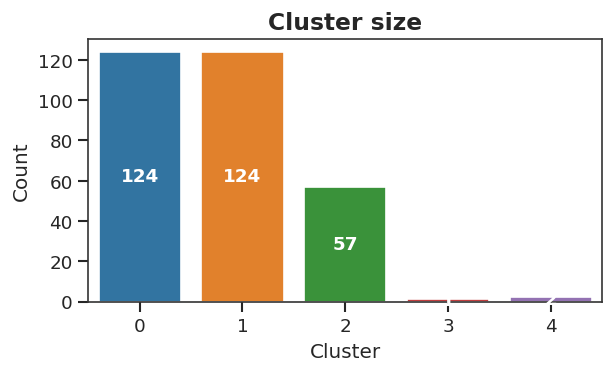

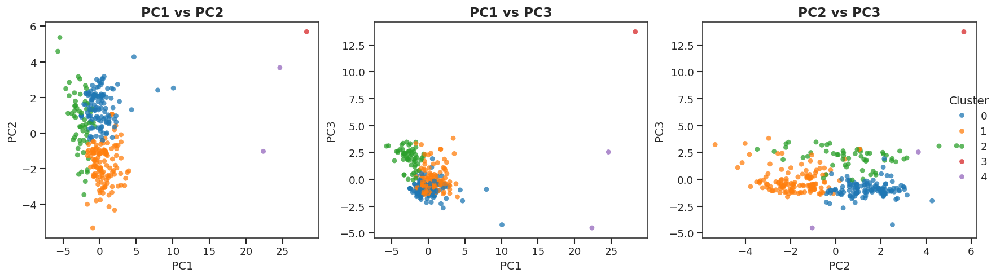

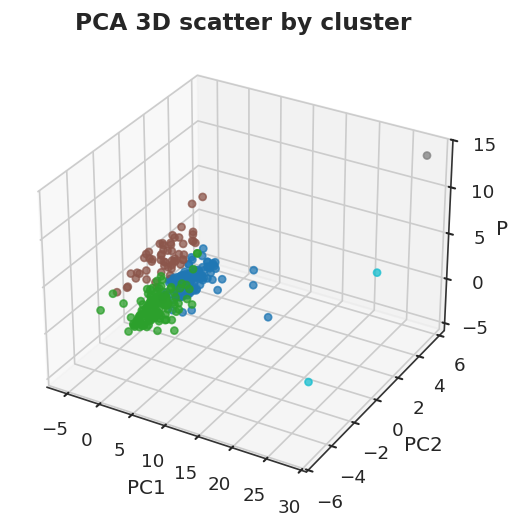

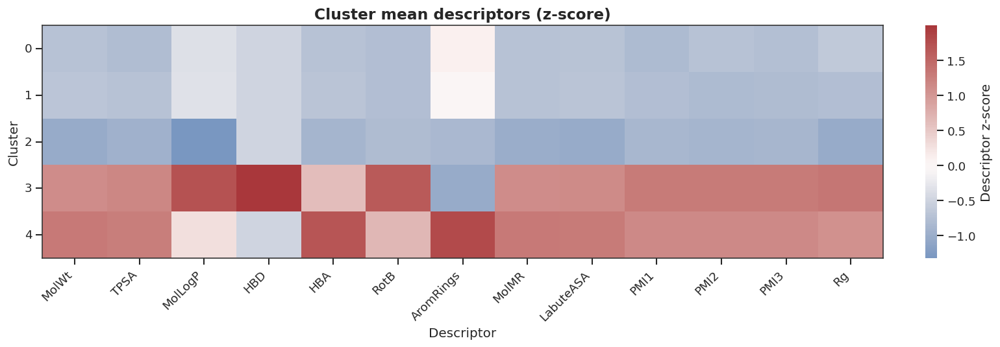

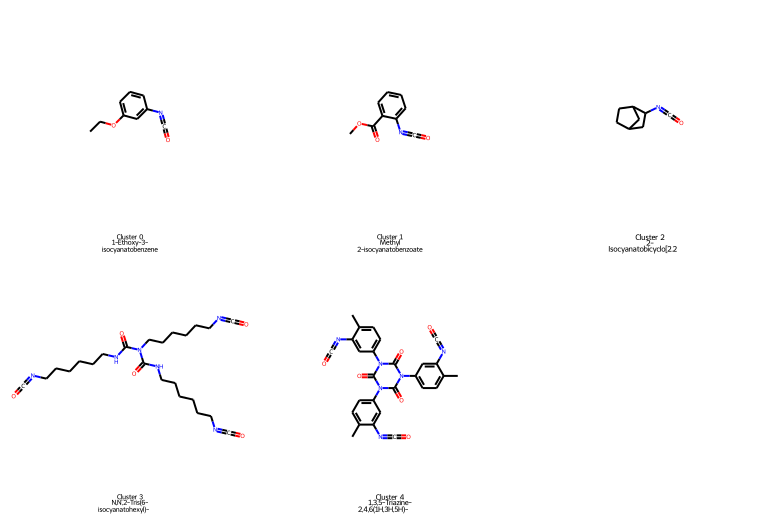

Saved: results/isocyanates_clustered_with_plots.csv


In [9]:
from rdkit import Chem
from IPython.display import display
from rdkit.Chem import Draw

assert 'isoc_clustered' in globals(), 'isoc_clustered is undefined'

df = isoc_clustered.copy()

CLUSTER_ORDER, CLUSTER_PALETTE = categorical_palette(
    df['cluster_km'],
    palette=os.environ.get('AM_CLUSTER_PALETTE', 'mako'),
)

key_cols = [
    'MolWt',
    'TPSA',
    'MolLogP',
    'HBD',
    'HBA',
    'RotatableBonds',
    'AromaticRings',
    'MolMR_volume_proxy',
    'LabuteASA',
    'PMI1',
    'PMI2',
    'PMI3',
    'RadiusOfGyration',
]
key_cols = [c for c in key_cols if c in df.columns]

pretty = {
    'MolMR_volume_proxy': 'MolMR',
    'RadiusOfGyration': 'Rg',
    'RotatableBonds': 'RotB',
    'AromaticRings': 'AromRings',
}

# Drop near-constant descriptors to avoid empty panels
key_cols = [c for c in key_cols if df[c].nunique(dropna=True) > 1]

n = len(key_cols)
if n == 0:
    raise ValueError('No valid descriptors available for visualization')

ncols = 3
nrows = (n + ncols - 1) // ncols

# 1) Overall distributions
fig, axes = plt.subplots(nrows, ncols, figsize=(4.6*ncols, 2.9*nrows), constrained_layout=True)
axes = np.ravel(axes)
for i, col in enumerate(key_cols):
    label = pretty.get(col, col)
    sns.histplot(df[col].dropna(), kde=True, ax=axes[i], color='steelblue', edgecolor='none')
    axes[i].set_title(f'{label} distribution')
    axes[i].set_xlabel(label)
    axes[i].set_ylabel('Count')
for j in range(i+1, len(axes)):
    axes[j].axis('off')
save_fig('isoc_descriptors_distributions', fig)
plt.show()

# 2) Boxplots by cluster
fig, axes = plt.subplots(nrows, ncols, figsize=(4.6*ncols, 2.9*nrows), constrained_layout=True)
axes = np.ravel(axes)
for i, col in enumerate(key_cols):
    label = pretty.get(col, col)
    ax = axes[i]
    sns.boxplot(
        data=df,
        x='cluster_km',
        y=col,
        hue='cluster_km',
        dodge=False,
        palette=CLUSTER_PALETTE,
        ax=ax,
    )
    if ax.get_legend() is not None:
        ax.get_legend().remove()
    ax.set_title(f'{label} by cluster')
    ax.set_xlabel('Cluster')
    ax.set_ylabel(label)
for j in range(i+1, len(axes)):
    axes[j].axis('off')
save_fig('isoc_descriptors_box_by_cluster', fig)
plt.show()

# 3) Violin plots by cluster
fig, axes = plt.subplots(nrows, ncols, figsize=(4.6*ncols, 2.9*nrows), constrained_layout=True)
axes = np.ravel(axes)
for i, col in enumerate(key_cols):
    label = pretty.get(col, col)
    ax = axes[i]
    sns.violinplot(
        data=df,
        x='cluster_km',
        y=col,
        hue='cluster_km',
        dodge=False,
        inner='quartile',
        cut=0,
        density_norm='width',
        palette=CLUSTER_PALETTE,
        ax=ax,
    )
    if ax.get_legend() is not None:
        ax.get_legend().remove()
    ax.set_title(f'{label} by cluster (violin)')
    ax.set_xlabel('Cluster')
    ax.set_ylabel(label)
for j in range(i+1, len(axes)):
    axes[j].axis('off')
save_fig('isoc_descriptors_violin_by_cluster', fig)
plt.show()

# 4) Cluster size
fig, ax = plt.subplots(figsize=(5, 3), constrained_layout=True)
sns.countplot(data=df, x='cluster_km', hue='cluster_km', palette=CLUSTER_PALETTE, ax=ax, legend=False)
ax.set_title('Cluster size')
ax.set_xlabel('Cluster')
ax.set_ylabel('Count')
for container in ax.containers:
    ax.bar_label(container, label_type='center', fontsize=11, fontweight='bold', color='white')
save_fig('isoc_cluster_size', fig)
plt.show()

# 5) PCA scatter matrix
pcs = [c for c in ['PC1', 'PC2', 'PC3'] if c in df.columns]
if len(pcs) >= 2:
    pairs = [(pcs[0], pcs[1])]
    if len(pcs) >= 3:
        pairs += [(pcs[0], pcs[2]), (pcs[1], pcs[2])]

    fig, axes = plt.subplots(1, len(pairs), figsize=(4.8*len(pairs), 4), constrained_layout=True)
    if len(pairs) == 1:
        axes = [axes]

    legend_handles = None
    legend_labels = None
    for k, (ax, (xcol, ycol)) in enumerate(zip(axes, pairs)):
        g = sns.scatterplot(
            data=df,
            x=xcol,
            y=ycol,
            hue='cluster_km',
            palette=CLUSTER_PALETTE,
            alpha=0.75,
            s=28,
            edgecolor='none',
            ax=ax,
            legend=(k == 0),
        )
        ax.set_title(f'{xcol} vs {ycol}')
        ax.set_xlabel(xcol)
        ax.set_ylabel(ycol)
        if k == 0 and g.get_legend() is not None:
            legend_handles, legend_labels = g.get_legend_handles_labels()
            g.get_legend().remove()

    if legend_handles and legend_labels:
        fig.legend(
            legend_handles,
            legend_labels,
            title='Cluster',
            loc='center right',
            bbox_to_anchor=(1.02, 0.5),
            frameon=False,
        )

    save_fig('isoc_pca_scatter_matrix', fig)
    plt.show()

# 5b) PCA 3D scatter
if len(pcs) == 3:
    fig = plt.figure(figsize=(6, 5))
    ax = fig.add_subplot(111, projection='3d')
    colors = [CLUSTER_PALETTE.get(k, (0.2, 0.2, 0.2)) for k in df['cluster_km'].tolist()]
    ax.scatter(
        df['PC1'],
        df['PC2'],
        df['PC3'],
        c=colors,
        s=18,
        alpha=0.75,
    )
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    ax.set_title('PCA 3D scatter by cluster')
    ax.grid(True)
    save_fig('isoc_pca_3d', fig)
    plt.show()

# 6) Cluster mean heatmap (z-scored across clusters)
mean_tbl = df.groupby('cluster_km')[key_cols].mean()
mean_tbl_z = (mean_tbl - mean_tbl.mean()) / mean_tbl.std(ddof=0)
mean_tbl_z = mean_tbl_z.rename(columns=pretty)

fig_w = max(7, 0.75 * mean_tbl_z.shape[1] + 3)
fig_h = max(3.0, 0.55 * mean_tbl_z.shape[0] + 1.6)
fig, ax = plt.subplots(figsize=(fig_w, fig_h), constrained_layout=True)
sns.heatmap(
    mean_tbl_z,
    cmap='vlag',
    center=0,
    cbar_kws={'label': 'Descriptor z-score'},
    ax=ax,
)
ax.set_title('Cluster mean descriptors (z-score)')
ax.set_xlabel('Descriptor')
ax.set_ylabel('Cluster')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
for spine in ax.spines.values():
    spine.set_visible(True)

save_fig('isoc_cluster_mean_heatmap', fig)
plt.show()

# 7) Representative molecules per cluster (nearest to PCA centroid)
rep_smiles = []
rep_labels = []
if all(pc in df.columns for pc in ['PC1', 'PC2', 'PC3']):
    for c in sorted(df['cluster_km'].dropna().unique()):
        sub = df[df['cluster_km'] == c]
        if sub.empty:
            continue
        pcs_sub = sub[['PC1', 'PC2', 'PC3']].values
        centroid = pcs_sub.mean(axis=0)
        d2 = ((pcs_sub - centroid) ** 2).sum(axis=1)
        rep_row = sub.iloc[int(d2.argmin())]
        rep_smiles.append(rep_row['SMILES'])
        name = rep_row.get('compound_name', None)
        if not isinstance(name, str) or not name.strip():
            name = rep_row.get('pubchem_name', None)
        if not isinstance(name, str) or not name.strip():
            name = 'Unknown'
        rep_labels.append(f"Cluster {int(c)}\n{wrap_legend(name, width=22, max_lines=2)}")

if rep_smiles:
    mols = [Chem.MolFromSmiles(s) for s in rep_smiles]
    img = Draw.MolsToGridImage(
        mols,
        legends=rep_labels,
        molsPerRow=3,
        subImgSize=(260, 260),
        useSVG=False,
    )
    display(img)
    save_rdkit_image(img, FIG_DIR / 'isoc_cluster_representatives.png')
# Persist table
out_csv = cfg.results_dir / 'isocyanates_clustered_with_plots.csv'
df.to_csv(out_csv, index=False)
print(f'Saved: {out_csv}')


### Advanced cluster visualizations
These plots provide higher-level, publication-style views of the isocyanates chemical space.


## Load CTD positives

Load CTD asthma-associated chemicals (positive list).


In [10]:
def normalize_name(series: pd.Series) -> pd.Series:
    return series.astype(str).str.strip().str.lower()


def normalize_cas(series: pd.Series) -> pd.Series:
    cleaned = series.astype(str).str.replace('-', '', regex=False).str.strip()
    cleaned = cleaned.replace({'nan': np.nan, '': np.nan})
    return cleaned


def load_ctd_asthma_chemicals(cfg: Config) -> pd.DataFrame:
    path = resolve_input_path(cfg.ctd_asthma_file, env_key='AM_CTD_FILE')
    if path.suffix.lower() in {'.xlsx', '.xls'}:
        df = pd.read_excel(path)
    else:
        df = pd.read_csv(path, sep=',', low_memory=False)

    keep = [cfg.ctd_chem_name_col]
    if cfg.ctd_cas_col in df.columns:
        keep.append(cfg.ctd_cas_col)

    optional_cols = ['Inference Score', 'Reference Count', 'Direct Evidence']
    for c in optional_cols:
        if c in df.columns:
            keep.append(c)

    df = df[keep].copy()

    df['name_norm'] = normalize_name(df[cfg.ctd_chem_name_col])
    if cfg.ctd_cas_col in df.columns:
        df['cas_norm'] = normalize_cas(df[cfg.ctd_cas_col])
    else:
        df['cas_norm'] = np.nan

    if 'Inference Score' in df.columns:
        df['Inference Score'] = pd.to_numeric(df['Inference Score'], errors='coerce')
    if 'Reference Count' in df.columns:
        df['Reference Count'] = pd.to_numeric(df['Reference Count'], errors='coerce')

    group_cols = ['name_norm', 'cas_norm']
    agg = {cfg.ctd_chem_name_col: 'first'}
    if cfg.ctd_cas_col in df.columns:
        agg[cfg.ctd_cas_col] = 'first'
    if 'Inference Score' in df.columns:
        agg['Inference Score'] = 'max'
    if 'Reference Count' in df.columns:
        agg['Reference Count'] = 'max'
    if 'Direct Evidence' in df.columns:
        def _first_nonempty(s):
            for v in s:
                if v is None or (isinstance(v, float) and np.isnan(v)):
                    continue
                vv = str(v).strip()
                if vv and vv.lower() != 'nan':
                    return vv
            return np.nan
        agg['Direct Evidence'] = _first_nonempty

    df = df.groupby(group_cols, dropna=False).agg(agg).reset_index()
    return df


ctd_asthma_df = load_ctd_asthma_chemicals(cfg)
print(f'CTD asthma chemicals: {len(ctd_asthma_df)} rows')
from IPython.display import display
display(ctd_asthma_df.head())


/home/xuchengjie/miniconda3/envs/AM_MOF/lib/python3.10/site-packages/openpyxl/styles/stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


CTD asthma chemicals: 7415 rows


,name_norm,cas_norm,Chemical Name,CAS RN,Inference Score,Reference Count,Direct Evidence
0,((1-ethylpyrrolidin-2-yl) methyl)-4-hydroxy-7-...,NaN,((1-ethylpyrrolidin-2-yl) methyl)-4-hydroxy-7-...,None,6.86,1,NaN
1,"((3z)-n-(3-chlorophenyl)-3-((3,5-dimethyl-4-((...",NaN,"((3Z)-N-(3-chlorophenyl)-3-((3,5-dimethyl-4-((...",None,4.53,1,NaN
2,"((5z)5-(1,3-benzodioxol-5-yl)methylene-2-pheny...",NaN,"((5Z)5-(1,3-benzodioxol-5-yl)methylene-2-pheny...",None,4.27,6,NaN
3,((py-3')tpp-ru(phen)2cl)cl,NaN,((Py-3')TPP-Ru(phen)2Cl)Cl,None,3.84,1,NaN
4,(+)-jq1 compound,NaN,(+)-JQ1 compound,None,19.75,49,NaN


## Structure mapping: CTD → PubChem (canonical SMILES)

Resolve CTD identifiers to canonical SMILES via PubChem (CAS first, then name), with a local cache under `interim/`.


In [11]:
from urllib.parse import quote
from concurrent.futures import ThreadPoolExecutor, as_completed
from collections import Counter, defaultdict
from pathlib import Path
import csv
import re
import threading
from tqdm.auto import tqdm

PUBCHEM_QUERY_CACHE_PATH = cfg.interim_dir / 'pubchem_query_cache.csv'
PUBCHEM_QUERY_CACHE: dict[str, tuple[str | None, int | None]] = {}
PUBCHEM_QUERY_SOURCE: dict[str, str] = {}

SMILES_RESOLVER = os.environ.get('AM_SMILES_RESOLVER', 'auto').strip().lower()
SMILES_RESOLVER = SMILES_RESOLVER if SMILES_RESOLVER in {'auto', 'pubchem', 'cactus'} else 'auto'

def _pubchem_healthcheck(timeout: float = 8.0) -> bool:
    try:
        url = 'https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/name/benzene/property/IsomericSMILES/JSON'
        r = requests.get(url, timeout=timeout)
        return r.status_code == 200
    except Exception:
        return False

if SMILES_RESOLVER == 'auto':
    SMILES_BACKEND = 'pubchem' if _pubchem_healthcheck() else 'cactus'
else:
    SMILES_BACKEND = SMILES_RESOLVER

print(f'SMILES resolver backend: {SMILES_BACKEND}')

PUBCHEM_VERBOSE = bool(int(os.environ.get('AM_PUBCHEM_VERBOSE', '0')))
PUBCHEM_REFRESH_MISSING = bool(int(os.environ.get('AM_PUBCHEM_REFRESH_MISSING', '1')))
PUBCHEM_FLUSH_EVERY = int(os.environ.get('AM_PUBCHEM_FLUSH_EVERY', '200'))

PUBCHEM_STATS = Counter()
PUBCHEM_STATS_LOCK = threading.Lock()
PUBCHEM_SESSION_LOCAL = threading.local()


def _session():
    s = getattr(PUBCHEM_SESSION_LOCAL, 'session', None)
    if s is None:
        s = requests.Session()
        pool = int(os.environ.get('AM_HTTP_POOL', '8'))
        adapter = requests.adapters.HTTPAdapter(pool_connections=pool, pool_maxsize=pool, max_retries=0)
        s.mount('https://', adapter)
        s.mount('http://', adapter)
        s.headers.update({'User-Agent': os.environ.get('AM_HTTP_UA', 'AM-MOF/1.0 (CTD-SMILES resolver)')})
        PUBCHEM_SESSION_LOCAL.session = s
    return s

CACTUS_INFLIGHT = int(os.environ.get('AM_CACTUS_INFLIGHT', '24'))
CACTUS_SEM = threading.BoundedSemaphore(max(1, CACTUS_INFLIGHT))

if PUBCHEM_QUERY_CACHE_PATH.exists():
    try:
        _cache_df = pd.read_csv(PUBCHEM_QUERY_CACHE_PATH)
        for r in _cache_df.itertuples(index=False, name=None):
            q = r[0] if len(r) > 0 else None
            smi = r[1] if len(r) > 1 else None
            cid = r[2] if len(r) > 2 else None
            src_tag = r[3] if len(r) > 3 else None
            q = '' if q is None else str(q)
            smi = smi if isinstance(smi, str) and smi.strip() else None
            cid = int(cid) if pd.notna(cid) and str(cid).isdigit() else None
            if q:
                PUBCHEM_QUERY_CACHE[q] = (smi, cid)
                if isinstance(src_tag, str) and src_tag.strip():
                    PUBCHEM_QUERY_SOURCE[q] = src_tag.strip()
                else:
                    PUBCHEM_QUERY_SOURCE[q] = SMILES_BACKEND
        if PUBCHEM_VERBOSE:
            ok = sum(1 for _, v in PUBCHEM_QUERY_CACHE.items() if v[0] is not None)
            print(f'Loaded resolver cache: {len(PUBCHEM_QUERY_CACHE)} queries (ok={ok})')
    except Exception:
        PUBCHEM_QUERY_CACHE = {}


def _bump(key: str, n: int = 1):
    with PUBCHEM_STATS_LOCK:
        PUBCHEM_STATS[str(key)] += int(n)


def _parse_smiles_from_props(props0: dict) -> str | None:
    # PubChem PUG REST is inconsistent across properties:
    # - Requesting IsomericSMILES returns key 'SMILES'
    # - Requesting CanonicalSMILES often returns key 'ConnectivitySMILES'
    for k in ['SMILES', 'IsomericSMILES', 'CanonicalSMILES', 'ConnectivitySMILES']:
        v = props0.get(k)
        if isinstance(v, str) and v.strip():
            return v.strip()
    return None


def _cactus_smiles(query: str, timeout: float = 20.0, max_retries: int = 3) -> str | None:
    q = '' if query is None else str(query).strip()
    if not q or q.lower() == 'nan':
        return None
    url = f'https://cactus.nci.nih.gov/chemical/structure/{quote(q)}/smiles'
    backoff = 0.6
    for _ in range(int(max_retries)):
        try:
            with CACTUS_SEM:
                resp = _session().get(url, timeout=timeout)
            code = int(getattr(resp, 'status_code', 0) or 0)
            _bump(f'http_{code}')

            if code == 200:
                txt = resp.text.strip()
                # CIR sometimes returns HTML error pages with 500/200 wrappers
                if not txt or txt.startswith('<') or 'Page not found' in txt:
                    _bump('smiles_missing')
                    return None
                _bump('smiles_ok')
                return txt

            if code in (400, 404):
                _bump('smiles_missing')
                return None

            # CIR uses HTTP 500 for "Page not found (404)" in some cases.
            if code == 500:
                txt = (resp.text or '').strip()
                if 'Page not found' in txt or 'not found' in txt.lower():
                    _bump('smiles_missing')
                    return None

            if code in (429, 500, 502, 503, 504):
                if code == 429:
                    ra = resp.headers.get('Retry-After', None)
                    try:
                        wait_s = float(ra) if ra is not None else backoff
                    except Exception:
                        wait_s = backoff
                    time.sleep(min(10.0, max(0.5, wait_s)))
                else:
                    time.sleep(backoff)
                backoff = min(10.0, backoff * 1.7)
                continue

            time.sleep(backoff)
            backoff = min(10.0, backoff * 1.7)
        except Exception:
            _bump('exceptions')
            time.sleep(backoff)
            backoff = min(10.0, backoff * 1.7)

    _bump('exhausted')
    return None


def _name_variants_for_pubchem(name: str) -> list[str]:
    """Heuristic variants to rescue tricky names (e.g., '(+)-JQ1 compound' -> 'JQ1')."""
    raw = '' if name is None else str(name).strip()
    if not raw:
        return []
    variants = [raw]
    lower = raw.lower()
    # Drop trailing descriptors
    for token in [' compound', ' hydrochloride', ' hydrate']:
        if token in lower:
            cut = raw[: lower.index(token)]
            if cut.strip():
                variants.append(cut.strip())
    # Strip stereochemical prefixes
    prefixes = ['(+)-', '(-)-', '(r)-', '(s)-', '(r)', '(s)', 'cis-', 'trans-']
    for pref in prefixes:
        if lower.startswith(pref):
            tail = raw[len(pref) :].strip()
            if tail:
                variants.append(tail)
    # Remove commas/extra parts
    if ',' in raw:
        head = raw.split(',')[0].strip()
        if head:
            variants.append(head)
    # Remove spaces
    variants.append(raw.replace(' ', ''))
    # Deduplicate while preserving order
    seen = set()
    out = []
    for v in variants:
        if not v:
            continue
        if v in seen:
            continue
        seen.add(v)
        out.append(v)
    return out




BINDINGDB_FALLBACK = bool(int(os.environ.get('AM_BINDINGDB_FALLBACK', '1')))
BINDINGDB_TSV_PATH = Path(os.environ.get('AM_BINDINGDB_TSV', 'BindingDB_All.tsv'))
BINDINGDB_CACHE_PATH = cfg.interim_dir / 'bindingdb_name_smiles_map.csv'
BINDINGDB_NAME_MAP = {}

_BDB_STOPWORDS = {
    'compound', 'cmpd', 'example', 'name', 'salt', 'hydrate', 'hydrochloride',
    'hcl', 'acetate', 'sulfate', 'phosphate', 'solution', 'mixture', 'form',
}


def _name_key_for_lookup(text: str) -> str:
    s = '' if text is None else str(text)
    toks = re.findall(r'[a-z0-9]+', s.lower())
    toks2 = [t for t in toks if t not in _BDB_STOPWORDS]
    if toks2:
        toks = toks2
    return ' '.join(toks).strip()


def _iter_bindingdb_name_candidates(field: str):
    if field is None:
        return
    s = str(field)
    if not s or s.lower() == 'nan':
        return
    # split by comma, and strip off patent/source suffix after '::'
    for part in s.split(','):
        part = part.strip()
        if not part:
            continue
        if '::' in part:
            part = part.split('::', 1)[0].strip()
        if not part:
            continue
        yield part


def _load_bindingdb_name_map():
    if not BINDINGDB_CACHE_PATH.exists():
        return {}
    try:
        df = pd.read_csv(BINDINGDB_CACHE_PATH)
        out = {}
        for r in df.itertuples(index=False):
            key = getattr(r, 'key')
            smi = getattr(r, 'smiles')
            cid = getattr(r, 'cid')
            key = '' if key is None else str(key).strip()
            smi = smi if isinstance(smi, str) and smi.strip() else None
            cid = int(cid) if pd.notna(cid) and str(cid).isdigit() else None
            if key and smi:
                out[key] = (smi, cid)
        return out
    except Exception:
        return {}


def _build_bindingdb_name_map(target_keys: set[str]):
    if not BINDINGDB_TSV_PATH.exists():
        return {}

    target_keys = {k for k in target_keys if isinstance(k, str) and k.strip()}
    if not target_keys:
        return {}

    max_rows_env = os.environ.get('AM_BINDINGDB_MAX_ROWS', '0').strip().lower()
    max_rows = None if max_rows_env in {'0', '', 'none'} else int(max_rows_env)

    pair_counts = defaultdict(Counter)

    with open(BINDINGDB_TSV_PATH, 'r', encoding='utf-8', errors='ignore', newline='') as f:
        reader = csv.reader(f, delimiter='	')
        header = next(reader)
        try:
            i_smiles = header.index('Ligand SMILES')
            i_name = header.index('BindingDB Ligand Name')
        except ValueError:
            return {}
        i_cid = header.index('PubChem CID') if 'PubChem CID' in header else None

        it = reader
        if max_rows is not None:
            it = (row for _, row in zip(range(max_rows), reader))

        for row in tqdm(it, desc='Scan BindingDB for name→SMILES', unit='rows', leave=False):
            if len(row) <= max(i_smiles, i_name):
                continue
            smi = row[i_smiles].strip() if row[i_smiles] else ''
            if not smi:
                continue
            cid = None
            if i_cid is not None and i_cid < len(row):
                c = row[i_cid].strip() if row[i_cid] else ''
                if c.isdigit():
                    cid = int(c)

            name_field = row[i_name]
            for cand in _iter_bindingdb_name_candidates(name_field):
                key = _name_key_for_lookup(cand)
                if key and key in target_keys:
                    pair_counts[key][(smi, cid)] += 1

    out = {}
    rows = []
    for key, ctr in pair_counts.items():
        (smi, cid), cnt = ctr.most_common(1)[0]
        out[key] = (smi, cid)
        rows.append({'key': key, 'smiles': smi, 'cid': cid, 'count': cnt})

    try:
        pd.DataFrame(rows).to_csv(BINDINGDB_CACHE_PATH, index=False)
    except Exception:
        pass

    return out


def _ensure_bindingdb_name_map(target_keys: set[str]):
    global BINDINGDB_NAME_MAP
    if not BINDINGDB_FALLBACK:
        return {}
    if BINDINGDB_NAME_MAP:
        return BINDINGDB_NAME_MAP
    loaded = _load_bindingdb_name_map()
    if loaded:
        BINDINGDB_NAME_MAP = loaded
        return BINDINGDB_NAME_MAP
    BINDINGDB_NAME_MAP = _build_bindingdb_name_map(target_keys)
    return BINDINGDB_NAME_MAP

def _pug_property(query: str, kind: str, timeout: float = 20.0, max_retries: int = 3):
    q = '' if query is None else str(query).strip()
    if not q or q.lower() == 'nan':
        return None, None

    if SMILES_BACKEND == 'cactus':
        smi = _cactus_smiles(q, timeout=timeout, max_retries=max_retries)
        return smi, None


    # IMPORTANT:
    # - Do NOT include CID in the property list; PubChem returns CID automatically.
    # - For speed, default to IsomericSMILES (returns key 'SMILES').
    prop = os.environ.get('AM_PUBCHEM_PROP', 'IsomericSMILES').strip()
    if not prop:
        prop = 'IsomericSMILES'

    if str(kind).lower() in {'cas', 'rn'}:
        url = f'https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/xref/RN/{quote(q)}/property/{prop}/JSON'
    else:
        url = f'https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/name/{quote(q)}/property/{prop}/JSON'

    backoff = 0.8
    for attempt in range(int(max_retries)):
        try:
            resp = _session().get(url, timeout=timeout)

            if resp.status_code == 200:
                _bump('http_200')
                js = resp.json()
                props = js.get('PropertyTable', {}).get('Properties', [])
                if not props:
                    _bump('json_empty')
                    return None, None
                smi = _parse_smiles_from_props(props[0])
                cid = props[0].get('CID')
                cid = int(cid) if cid is not None and str(cid).isdigit() else None
                if smi is None:
                    _bump('smiles_missing')
                else:
                    _bump('smiles_ok')
                return smi, cid

            if resp.status_code in (400, 404):
                _bump(f'http_{resp.status_code}')
                return None, None

            if resp.status_code == 429:
                _bump('http_429')
                ra = resp.headers.get('Retry-After', None)
                try:
                    wait_s = float(ra) if ra is not None else backoff
                except Exception:
                    wait_s = backoff
                time.sleep(min(10.0, max(0.5, wait_s)))
                backoff = min(10.0, backoff * 1.7)
                continue

            _bump(f'http_{resp.status_code}')
            time.sleep(backoff)
            backoff = min(10.0, backoff * 1.7)
        except Exception:
            _bump('exceptions')
            time.sleep(backoff)
            backoff = min(10.0, backoff * 1.7)

    _bump('exhausted')
    return None, None


def _bulk_resolve_queries(queries: list[str], tag: str, kind: str):
    if SMILES_BACKEND == 'cactus':
        workers = int(os.environ.get('AM_CACTUS_WORKERS', os.environ.get('AM_PUBCHEM_WORKERS', '32')))
        timeout = float(os.environ.get('AM_CACTUS_TIMEOUT', os.environ.get('AM_PUBCHEM_TIMEOUT', '20')))
        max_retries = int(os.environ.get('AM_CACTUS_RETRIES', os.environ.get('AM_PUBCHEM_RETRIES', '3')))
    else:
        workers = int(os.environ.get('AM_PUBCHEM_WORKERS', '32'))
        timeout = float(os.environ.get('AM_PUBCHEM_TIMEOUT', '20'))
        max_retries = int(os.environ.get('AM_PUBCHEM_RETRIES', '3'))

    queries = [q for q in queries if q and (str(q).lower() != 'nan')]
    queries = list(dict.fromkeys([str(q).strip() for q in queries]))

    # Exclude cached hits (optionally re-try cached-missing)
    if PUBCHEM_REFRESH_MISSING:
        todo = [q for q in queries if (q not in PUBCHEM_QUERY_CACHE) or (PUBCHEM_QUERY_CACHE.get(q, (None, None))[0] is None)]
    else:
        todo = [q for q in queries if q not in PUBCHEM_QUERY_CACHE]

    cache_hits = int(len(queries) - len(todo))
    if not todo:
        if PUBCHEM_VERBOSE:
            print(f'SMILES resolve ({tag}): all cached (n={len(queries)})')
        return

    max_queries_env = os.environ.get('AM_PUBCHEM_MAX_QUERIES', '0').strip().lower()
    max_queries = None if max_queries_env in {'0', '', 'none'} else int(max_queries_env)
    if max_queries is not None:
        todo = todo[:max_queries]

    with PUBCHEM_STATS_LOCK:
        before = dict(PUBCHEM_STATS)
    t0 = time.time()

    with ThreadPoolExecutor(max_workers=max(1, workers)) as ex:
        futs = {
            ex.submit(_pug_property, q, kind=kind, timeout=timeout, max_retries=max_retries): q
            for q in todo
        }
        pbar = tqdm(as_completed(futs), total=len(futs), desc=f'SMILES resolve ({tag})', leave=False)
        for i, fut in enumerate(pbar, 1):
            q = futs[fut]
            try:
                smi, cid = fut.result()
            except Exception:
                smi, cid = None, None
                _bump('exceptions')
            PUBCHEM_QUERY_CACHE[q] = (smi, cid)
            PUBCHEM_QUERY_SOURCE[q] = SMILES_BACKEND

            if PUBCHEM_FLUSH_EVERY and (i % int(PUBCHEM_FLUSH_EVERY) == 0):
                try:
                    cache_df = pd.DataFrame([
                        {'query': k, 'smiles': v[0], 'cid': v[1], 'source': PUBCHEM_QUERY_SOURCE.get(k, SMILES_BACKEND)}
                        for k, v in PUBCHEM_QUERY_CACHE.items()
                    ])
                    cache_df.to_csv(PUBCHEM_QUERY_CACHE_PATH, index=False)
                except Exception:
                    pass

            if i % 25 == 0:
                with PUBCHEM_STATS_LOCK:
                    pbar.set_postfix(
                        {
                            '200': int(PUBCHEM_STATS.get('http_200', 0)),
                            'smiles_ok': int(PUBCHEM_STATS.get('smiles_ok', 0)),
                            '429': int(PUBCHEM_STATS.get('http_429', 0)),
                            '503': int(PUBCHEM_STATS.get('http_503', 0)),
                            '500': int(PUBCHEM_STATS.get('http_500', 0)),
                            '404': int(PUBCHEM_STATS.get('http_404', 0)),
                            'exc': int(PUBCHEM_STATS.get('exceptions', 0)),
                        },
                        refresh=False,
                    )
        pbar.close()

    # Final flush (survives interruption between stages)
    try:
        cache_df = pd.DataFrame([
            {'query': k, 'smiles': v[0], 'cid': v[1], 'source': PUBCHEM_QUERY_SOURCE.get(k, SMILES_BACKEND)}
            for k, v in PUBCHEM_QUERY_CACHE.items()
        ])
        cache_df.to_csv(PUBCHEM_QUERY_CACHE_PATH, index=False)
    except Exception:
        pass

    with PUBCHEM_STATS_LOCK:
        after = dict(PUBCHEM_STATS)

    def d(key):
        return int(after.get(key, 0) - before.get(key, 0))

    elapsed_s = time.time() - t0
    print(
        f"SMILES resolve ({tag}) summary: requests={len(todo)} cache_hits={cache_hits} "
        f"ok={d('http_200')} smiles_ok={d('smiles_ok')} smiles_missing={d('smiles_missing')} "
        f"429={d('http_429')} 503={d('http_503')} 404={d('http_404')} 400={d('http_400')} "
        f"exceptions={d('exceptions')} exhausted={d('exhausted')} elapsed_min={elapsed_s/60:.1f} refresh_missing={int(PUBCHEM_REFRESH_MISSING)}"
    )


def resolve_ctd_to_pubchem_smiles(ctd_df: pd.DataFrame, cfg: Config) -> pd.DataFrame:
    name_col = cfg.ctd_chem_name_col
    cas_col = cfg.ctd_cas_col if cfg.ctd_cas_col in ctd_df.columns else None

    extra_cols = [c for c in ['Inference Score', 'Reference Count', 'Direct Evidence'] if c in ctd_df.columns]

    cols = [name_col, 'name_norm', 'cas_norm']
    if cas_col:
        cols.append(cas_col)
    cols += extra_cols
    cols = [c for c in cols if c in ctd_df.columns]

    df_in = ctd_df[cols].copy()

    cas_queries = []
    if cas_col:
        cas_queries = (
            df_in[cas_col]
            .dropna()
            .astype(str)
            .str.strip()
            .loc[lambda s: s.ne('') & s.str.lower().ne('nan')]
            .unique()
            .tolist()
        )

    _bulk_resolve_queries(cas_queries, tag='CAS', kind='cas')

    # Name queries are only needed when CAS is missing or CAS→SMILES fails.
    if cas_col:
        resolved_cas = {c for c in cas_queries if PUBCHEM_QUERY_CACHE.get(str(c).strip(), (None, None))[0]}
        cas_series = df_in[cas_col].astype(str).str.strip()
        name_df = df_in[df_in[cas_col].isna() | ~cas_series.isin(resolved_cas)]
    else:
        name_df = df_in

    name_queries = (
        name_df[name_col]
        .dropna()
        .astype(str)
        .str.strip()
        .loc[lambda s: s.ne('') & s.str.lower().ne('nan')]
        .unique()
        .tolist()
    )

    # Optional local BindingDB name→SMILES fallback (offline)
    # This boosts coverage when PubChem is unavailable and avoids extra network requests.
    bdb_map = _ensure_bindingdb_name_map({_name_key_for_lookup(n) for n in name_queries})
    if bdb_map:
        for n in name_queries:
            key = _name_key_for_lookup(n)
            pair = bdb_map.get(key)
            if pair and pair[0]:
                if (n not in PUBCHEM_QUERY_CACHE) or (PUBCHEM_QUERY_CACHE.get(n, (None, None))[0] is None):
                    PUBCHEM_QUERY_CACHE[n] = (pair[0], pair[1])
                    PUBCHEM_QUERY_SOURCE[n] = 'bindingdb'

    _bulk_resolve_queries(name_queries, tag='Name', kind='name')

    # Vectorized assembly (no network; fast)
    df_out = df_in.copy()

    if cas_col:
        cas_keys = df_out[cas_col].astype(str).str.strip()
        cas_keys = cas_keys.where(~cas_keys.str.lower().eq('nan') & cas_keys.ne(''), other=np.nan)

        cas_to_smiles = {str(c).strip(): PUBCHEM_QUERY_CACHE.get(str(c).strip(), (None, None))[0] for c in cas_queries}
        cas_to_cid = {str(c).strip(): PUBCHEM_QUERY_CACHE.get(str(c).strip(), (None, None))[1] for c in cas_queries}

        df_out['pubchem_smiles'] = cas_keys.map(cas_to_smiles)
        df_out['pubchem_cid'] = cas_keys.map(cas_to_cid)
        df_out['pubchem_method'] = pd.Series(pd.NA, index=df_out.index, dtype='object')
        df_out.loc[df_out['pubchem_smiles'].notna(), 'pubchem_method'] = 'CAS'
    else:
        df_out['pubchem_smiles'] = np.nan
        df_out['pubchem_cid'] = np.nan
        df_out['pubchem_method'] = pd.Series(pd.NA, index=df_out.index, dtype='object')

    name_keys = df_out[name_col].astype(str).str.strip()
    name_keys = name_keys.where(~name_keys.str.lower().eq('nan') & name_keys.ne(''), other=np.nan)

    name_to_smiles = {str(n).strip(): PUBCHEM_QUERY_CACHE.get(str(n).strip(), (None, None))[0] for n in name_queries}
    name_to_cid = {str(n).strip(): PUBCHEM_QUERY_CACHE.get(str(n).strip(), (None, None))[1] for n in name_queries}
    name_to_method = {
        str(n).strip(): ('BindingDB' if PUBCHEM_QUERY_SOURCE.get(str(n).strip()) == 'bindingdb' else 'Name')
        for n in name_queries
    }

    need_name = df_out['pubchem_smiles'].isna()
    df_out.loc[need_name, 'pubchem_smiles'] = name_keys[need_name].map(name_to_smiles)
    df_out.loc[need_name, 'pubchem_cid'] = name_keys[need_name].map(name_to_cid)
    df_out.loc[need_name, 'pubchem_method'] = name_keys[need_name].map(name_to_method)

    # Cache-only heuristic variants for still-missing names (no extra network)
    still = df_out['pubchem_smiles'].isna() & name_keys.notna()
    if int(still.sum()) > 0:
        variant_map = {}
        for nm in pd.unique(name_keys[still]):
            for alt in _name_variants_for_pubchem(nm):
                smi, cid = PUBCHEM_QUERY_CACHE.get(alt, (None, None))
                if smi:
                    variant_map[nm] = (smi, cid)
                    break
        if variant_map:
            df_out.loc[still, 'pubchem_smiles'] = name_keys[still].map(lambda x: variant_map.get(x, (None, None))[0])
            df_out.loc[still, 'pubchem_cid'] = name_keys[still].map(lambda x: variant_map.get(x, (None, None))[1])
            df_out.loc[still, 'pubchem_method'] = 'Name-fallback'

    keep = [name_col, 'name_norm', 'cas_norm']
    if cas_col:
        keep.append(cas_col)
    keep += extra_cols + ['pubchem_smiles', 'pubchem_cid', 'pubchem_method']
    keep = [c for c in keep if c in df_out.columns]
    df_out = df_out[keep]

    try:
        cache_df = pd.DataFrame([
            {'query': k, 'smiles': v[0], 'cid': v[1], 'source': PUBCHEM_QUERY_SOURCE.get(k, SMILES_BACKEND)}
            for k, v in PUBCHEM_QUERY_CACHE.items()
        ])
        cache_df.to_csv(PUBCHEM_QUERY_CACHE_PATH, index=False)
    except Exception:
        pass

    return df_out


ctd_pubchem_df = resolve_ctd_to_pubchem_smiles(ctd_asthma_df, cfg)
ctd_pubchem_df.head()


SMILES resolver backend: cactus


SMILES resolve (CAS):   0%|          | 0/40 [00:00<?, ?it/s]

SMILES resolve (CAS) summary: requests=40 cache_hits=3761 ok=0 smiles_ok=0 smiles_missing=33 429=0 503=0 404=0 400=0 exceptions=16 exhausted=7 elapsed_min=0.5 refresh_missing=1


SMILES resolve (Name):   0%|          | 0/2253 [00:00<?, ?it/s]

SMILES resolve (Name) summary: requests=2253 cache_hits=1401 ok=16 smiles_ok=16 smiles_missing=63 429=0 503=0 404=0 400=0 exceptions=6551 exhausted=2174 elapsed_min=8.5 refresh_missing=1


,Chemical Name,name_norm,cas_norm,CAS RN,Inference Score,Reference Count,Direct Evidence,pubchem_smiles,pubchem_cid,pubchem_method
0,((1-ethylpyrrolidin-2-yl) methyl)-4-hydroxy-7-...,((1-ethylpyrrolidin-2-yl) methyl)-4-hydroxy-7-...,NaN,None,6.86,1,NaN,CCN1CCCC1Cc2nc3cc(OC)ccc3c(O)c2C(N)=O,None,Name
1,"((3Z)-N-(3-chlorophenyl)-3-((3,5-dimethyl-4-((...","((3z)-n-(3-chlorophenyl)-3-((3,5-dimethyl-4-((...",NaN,None,4.53,1,NaN,CN1CCN(CC1)C(=O)c2c(C)[nH]c(/C=C/3C(=O)Nc4ccc(...,None,Name
2,"((5Z)5-(1,3-benzodioxol-5-yl)methylene-2-pheny...","((5z)5-(1,3-benzodioxol-5-yl)methylene-2-pheny...",NaN,None,4.27,6,NaN,O=C/1NC(=NC1=C/c2ccc3OCOc3c2)Nc4ccccc4,None,Name
3,((Py-3')TPP-Ru(phen)2Cl)Cl,((py-3')tpp-ru(phen)2cl)cl,NaN,None,3.84,1,NaN,None,None,Name-fallback
4,(+)-JQ1 compound,(+)-jq1 compound,NaN,None,19.75,49,NaN,Cc1nnc2[C@H](CC(=O)OC(C)(C)C)N=C(c3c(C)c(C)sc3...,None,BindingDB


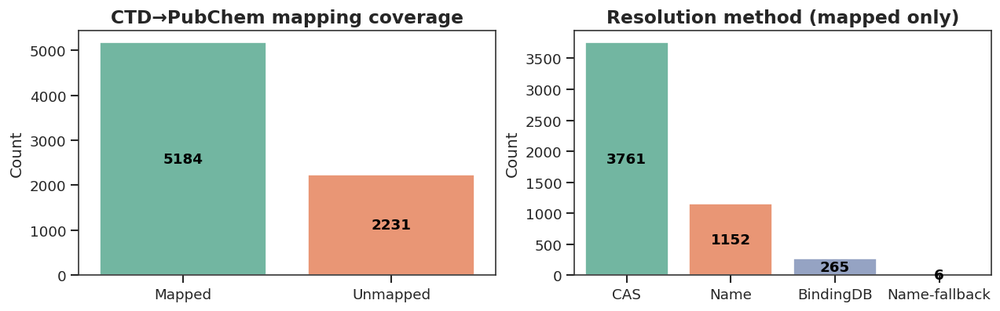

In [12]:
# Mapping coverage summary (CTD → PubChem)
assert 'ctd_pubchem_df' in globals(), 'Run CTD→PubChem mapping first'

mapped = ctd_pubchem_df['pubchem_smiles'].notna() & (ctd_pubchem_df['pubchem_smiles'].astype(str).str.strip() != '')
counts = pd.Series({'Mapped': int(mapped.sum()), 'Unmapped': int((~mapped).sum())})

methods = ctd_pubchem_df.loc[mapped, 'pubchem_method'].fillna('Unknown').value_counts()

if int(counts.get('Mapped', 0)) == 0:
    print('No PubChem SMILES mapped. If you previously ran with an invalid PubChem endpoint, delete interim/pubchem_query_cache.csv or set AM_PUBCHEM_REFRESH_MISSING=1 and rerun CTD→PubChem.')

fig, axes = plt.subplots(1, 2, figsize=(10.5, 3.2), constrained_layout=True)

tmp = counts.reset_index(); tmp.columns = ['status', 'count']
sns.barplot(data=tmp, x='status', y='count', hue='status', palette='Set2', legend=False, ax=axes[0])
axes[0].set_title('CTD→PubChem mapping coverage')
axes[0].set_xlabel('')
axes[0].set_ylabel('Count')
annotate_bars_center(axes[0])
clean_ax(axes[0])

mt = methods.reset_index(); mt.columns = ['method', 'count']
sns.barplot(data=mt, x='method', y='count', hue='method', palette='Set2', legend=False, ax=axes[1])
axes[1].set_title('Resolution method (mapped only)')
axes[1].set_xlabel('')
axes[1].set_ylabel('Count')
annotate_bars_center(axes[1])
clean_ax(axes[1])

save_fig('ctd_pubchem_mapping_coverage', fig)
plt.show()


### Positive set QC (RDKit)

Validate SMILES, canonicalize, and deduplicate the CTD-derived positive set.


/tmp/ipykernel_412593/3069583528.py:60: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


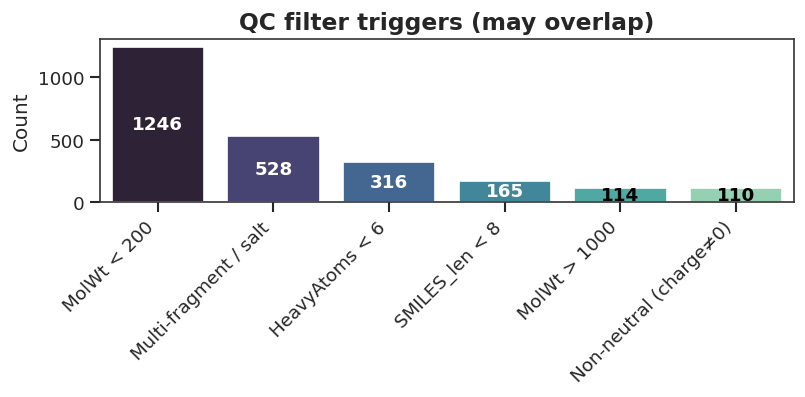

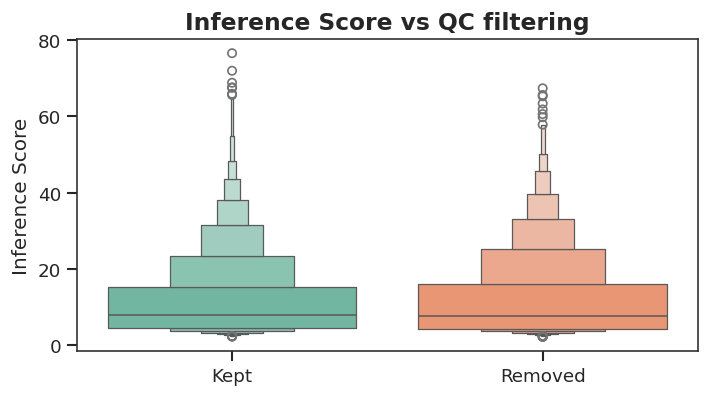

Filtered overly-simple molecules: removed=1816 / 5068 (keep=3252)
CTD positives with valid SMILES: 3252


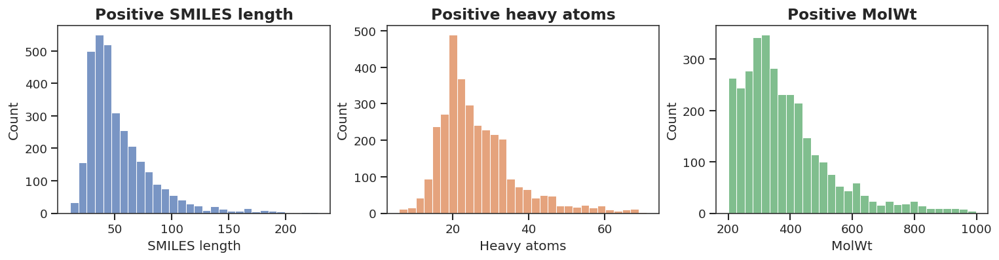

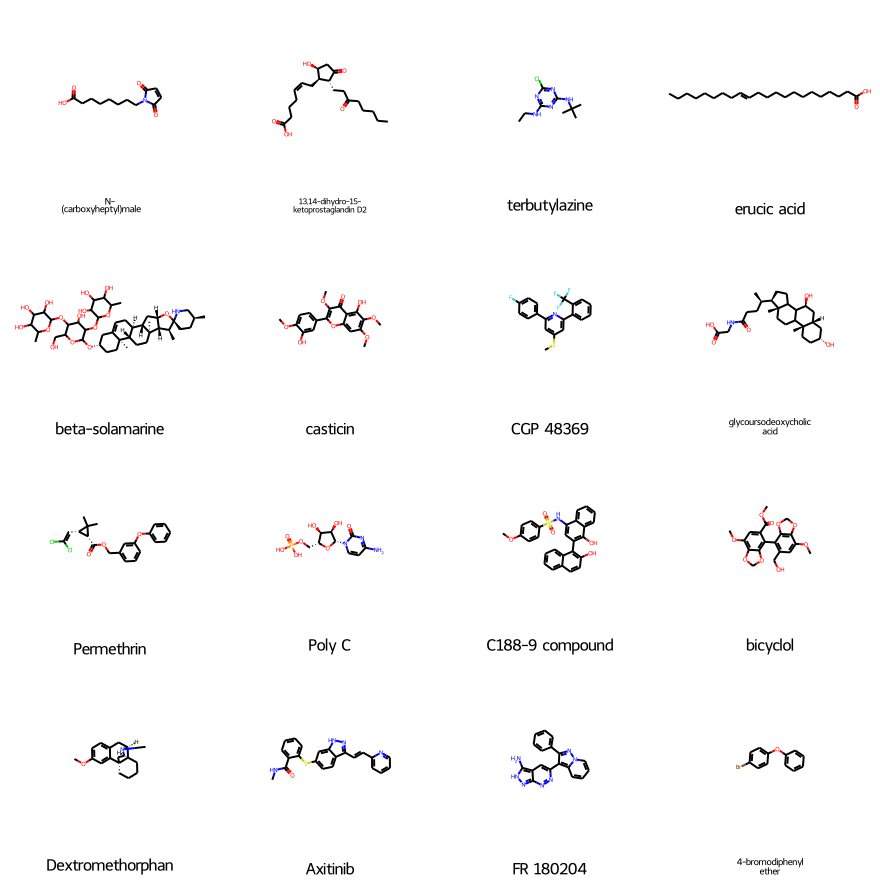

,Chemical Name,CAS RN,SMILES,label,label_name
0,((1-ethylpyrrolidin-2-yl) methyl)-4-hydroxy-7-...,None,CCN1CCCC1Cc1nc2cc(OC)ccc2c(O)c1C(N)=O,1,Asthma-associated
1,"((3Z)-N-(3-chlorophenyl)-3-((3,5-dimethyl-4-((...",None,Cc1[nH]c(/C=C2\C(=O)Nc3ccc(S(=O)(=O)N(C)c4cccc...,1,Asthma-associated
2,"((5Z)5-(1,3-benzodioxol-5-yl)methylene-2-pheny...",None,O=C1NC(Nc2ccccc2)=N/C1=C\c1ccc2c(c1)OCO2,1,Asthma-associated
3,(+)-JQ1 compound,None,Cc1sc2c(c1C)C(c1ccc(Cl)cc1)=N[C@@H](CC(=O)OC(C...,1,Asthma-associated
4,"(1,2-bis(1,2-benzisoselenazolone-3(2H)-ketone)...",None,O=c1c2ccccc2[se]n1CCn1[se]c2ccccc2c1=O,1,Asthma-associated


In [13]:
def canonicalize_smiles(smi: str) -> str | None:
    s = '' if smi is None else str(smi).strip()
    if not s or s.lower() == 'nan':
        return None
    mol = Chem.MolFromSmiles(s)
    if mol is None:
        return None
    try:
        return Chem.MolToSmiles(mol, isomericSmiles=True)
    except Exception:
        return None


pos_raw = ctd_pubchem_df.copy()
pos_raw['smiles_canon'] = [canonicalize_smiles(s) for s in pos_raw['pubchem_smiles'].astype(str).tolist()]
pos = pos_raw.dropna(subset=['smiles_canon']).copy()

# Deduplicate by canonical SMILES
pos = pos.drop_duplicates(subset=['smiles_canon']).reset_index(drop=True)

# Filter overly-simple / too small / too large molecules (post-PubChem)
# Defaults are conservative; override via env vars if needed.
MIN_HEAVY_ATOMS = int(os.environ.get('AM_CTD_MIN_HEAVY_ATOMS', '6'))
MIN_MOLWT = float(os.environ.get('AM_CTD_MIN_MOLWT', '200'))
MAX_MOLWT = float(os.environ.get('AM_CTD_MAX_MOLWT', '1000'))
MIN_SMILES_LEN = int(os.environ.get('AM_CTD_MIN_SMILES_LEN', '8'))

mols = [Chem.MolFromSmiles(s) for s in pos['smiles_canon'].astype(str).tolist()]
pos['HeavyAtoms'] = [m.GetNumHeavyAtoms() if m is not None else np.nan for m in mols]
pos['MolWt'] = [Descriptors.MolWt(m) if m is not None else np.nan for m in mols]
pos['Rings'] = [rdMolDescriptors.CalcNumRings(m) if m is not None else np.nan for m in mols]
pos['SMILES_len'] = pos['smiles_canon'].astype(str).str.len()
pos['Fragments'] = [len(Chem.GetMolFrags(m)) if m is not None else np.nan for m in mols]
pos['FormalCharge'] = [Chem.GetFormalCharge(m) if m is not None else np.nan for m in mols]

mask_simple = (
    (pos['HeavyAtoms'] < MIN_HEAVY_ATOMS)
    | (pos['MolWt'] < MIN_MOLWT)
    | (pos['MolWt'] > MAX_MOLWT)
    | (pos['SMILES_len'] < MIN_SMILES_LEN)
    | (pos['Fragments'] > 1)
    | (pos['FormalCharge'] != 0)
)

# Filter diagnostics (reasons + evidence)
reason_counts = pd.Series({
    f'HeavyAtoms < {MIN_HEAVY_ATOMS}': int((pos['HeavyAtoms'] < MIN_HEAVY_ATOMS).sum()),
    f'MolWt < {MIN_MOLWT:g}': int((pos['MolWt'] < MIN_MOLWT).sum()),
    f'MolWt > {MAX_MOLWT:g}': int((pos['MolWt'] > MAX_MOLWT).sum()),
    f'SMILES_len < {MIN_SMILES_LEN}': int((pos['SMILES_len'] < MIN_SMILES_LEN).sum()),
    'Multi-fragment / salt': int((pos['Fragments'] > 1).sum()),
    'Non-neutral (charge≠0)': int((pos['FormalCharge'] != 0).sum()),
}).sort_values(ascending=False)
fig_w = max(6.0, 0.6 * len(reason_counts) + 3.0)
fig, ax = plt.subplots(figsize=(fig_w, 3.2), constrained_layout=True)
sns.barplot(x=reason_counts.index, y=reason_counts.values, hue=reason_counts.index, palette='mako', legend=False, ax=ax)
ax.set_title('QC filter triggers (may overlap)')
ax.set_xlabel('')
ax.set_ylabel('Count')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
annotate_bars_center(ax)
clean_ax(ax)
save_fig('ctd_positive_qc_filter_reasons', fig)
plt.show()

pos['_filter_status'] = np.where(mask_simple, 'Removed', 'Kept')
if 'Inference Score' in pos.columns:
    pos['Inference Score'] = pd.to_numeric(pos['Inference Score'], errors='coerce')
    fig, ax = plt.subplots(figsize=(5.8, 3.2), constrained_layout=True)
    sns.boxenplot(data=pos, x='_filter_status', y='Inference Score', hue='_filter_status', dodge=False, palette='Set2', legend=False, ax=ax)
    ax.set_title('Inference Score vs QC filtering')
    ax.set_xlabel('')
    ax.set_ylabel('Inference Score')
    clean_ax(ax)
    save_fig('ctd_positive_inference_by_qc_filter', fig)
    plt.show()

n_before = len(pos)
n_simple = int(mask_simple.sum())
pos = pos.loc[~mask_simple].reset_index(drop=True)
print(f'Filtered overly-simple molecules: removed={n_simple} / {n_before} (keep={len(pos)})')
pos['label_name'] = 'Asthma-associated'

print(f'CTD positives with valid SMILES: {len(pos)}')

if len(pos) == 0:
    raise RuntimeError('No valid SMILES resolved from PubChem (0 positives). Rerun CTD→PubChem. If a stale cache exists, delete interim/pubchem_query_cache.csv or keep AM_PUBCHEM_REFRESH_MISSING=1.')

# QC distributions
fig, axes = plt.subplots(1, 3, figsize=(12.6, 3.2), constrained_layout=True)
sns.histplot(pos['SMILES_len'], bins=30, color='C0', ax=axes[0])
axes[0].set_title('Positive SMILES length')
axes[0].set_xlabel('SMILES length')
axes[0].set_ylabel('Count')
clean_ax(axes[0])

sns.histplot(pos['HeavyAtoms'], bins=30, color='C1', ax=axes[1])
axes[1].set_title('Positive heavy atoms')
axes[1].set_xlabel('Heavy atoms')
axes[1].set_ylabel('Count')
clean_ax(axes[1])

sns.histplot(pos['MolWt'], bins=30, color='C2', ax=axes[2])
axes[2].set_title('Positive MolWt')
axes[2].set_xlabel('MolWt')
axes[2].set_ylabel('Count')
clean_ax(axes[2])

save_fig('ctd_positive_qc_distributions', fig)
plt.show()

# Structure panel (sample)
from rdkit.Chem import Draw

n_show = int(min(16, len(pos)))
if n_show > 0:
    sample = pos.sample(n=n_show, random_state=RANDOM_STATE)
    mols = [Chem.MolFromSmiles(s) for s in sample['smiles_canon']]
    legends = make_unique_labels(sample[cfg.ctd_chem_name_col].fillna('Unknown').astype(str).tolist())
    legends = [wrap_legend(x, width=20, max_lines=2) for x in legends]

    img = Draw.MolsToGridImage(mols, legends=legends, molsPerRow=4, subImgSize=(220, 220), useSVG=False)
    display(img)
    save_rdkit_image(img, FIG_DIR / 'ctd_positive_structures_sample.png')

# Keep a minimal positive table
pos_df = pos[[cfg.ctd_chem_name_col, cfg.ctd_cas_col] if cfg.ctd_cas_col in pos.columns else [cfg.ctd_chem_name_col]].copy()
pos_df['SMILES'] = pos['smiles_canon']
pos_df['label'] = 1
pos_df['label_name'] = 'Asthma-associated'
pos_df.head()

## Training dataset: positives + decoy controls (BindingDB)

Controls are generated as physicochem-matched decoys sampled from BindingDB.


In [14]:
# Positive set for training
assert 'pos_df' in globals(), 'Run CTD→PubChem + QC cells first'

pos_smiles = pos_df['SMILES'].astype(str).values
pos_names = pos_df[cfg.ctd_chem_name_col].astype(str).values

print(f'Positives (unique, valid SMILES): {len(pos_smiles)}')


Positives (unique, valid SMILES): 3252


## Feature engineering: Morgan fingerprints + basic physicochemical descriptors

Morgan/ECFP bit vectors + a small set of RDKit physicochemical descriptors.


In [15]:
morgan_gen = GetMorganGenerator(radius=cfg.fp_radius, fpSize=cfg.fp_n_bits)


def smiles_to_features(smiles: str, cfg: Config):
    smi = str(smiles).strip()
    if not smi:
        return None, None
    mol = Chem.MolFromSmiles(smi)
    if mol is None:
        return None, None
    # Skip salts/multi-fragment or charged species
    if len(Chem.GetMolFrags(mol)) > 1:
        return None, None
    if Chem.GetFormalCharge(mol) != 0:
        return None, None

    fp_vec = morgan_gen.GetFingerprint(mol)
    fp_arr = np.zeros((cfg.fp_n_bits,), dtype=int)
    DataStructs.ConvertToNumpyArray(fp_vec, fp_arr)

    phys = np.array(
        [
            Descriptors.MolWt(mol),
            Descriptors.MolLogP(mol),
            Descriptors.TPSA(mol),
            Descriptors.NumHDonors(mol),
            Descriptors.NumHAcceptors(mol),
            Descriptors.NumRotatableBonds(mol),
            Chem.rdMolDescriptors.CalcNumAromaticRings(mol),
        ],
        dtype=float,
    )
    return fp_arr, phys


# Featurize CTD positives (RDKit-valid)
assert 'pos_smiles' in globals() and 'pos_names' in globals(), 'Run CTD→PubChem QC first'

pos_fp_list = []
pos_phys_list = []
pos_smiles_used = []
pos_names_used = []

for smi, name in zip(pos_smiles, pos_names):
    fp, ph = smiles_to_features(smi, cfg)
    if fp is None:
        continue
    pos_fp_list.append(fp)
    pos_phys_list.append(ph)
    pos_smiles_used.append(str(smi))
    pos_names_used.append(str(name))

if not pos_fp_list:
    raise RuntimeError('No valid positive molecules after RDKit featurization.')

pos_X_fp = np.vstack(pos_fp_list)
pos_X_phys = np.vstack(pos_phys_list)
pos_smiles_used = np.array(pos_smiles_used, dtype=object)
pos_names_used = np.array(pos_names_used, dtype=object)

print(f'Positive featurized: {len(pos_smiles_used)}')


Positive featurized: 3252


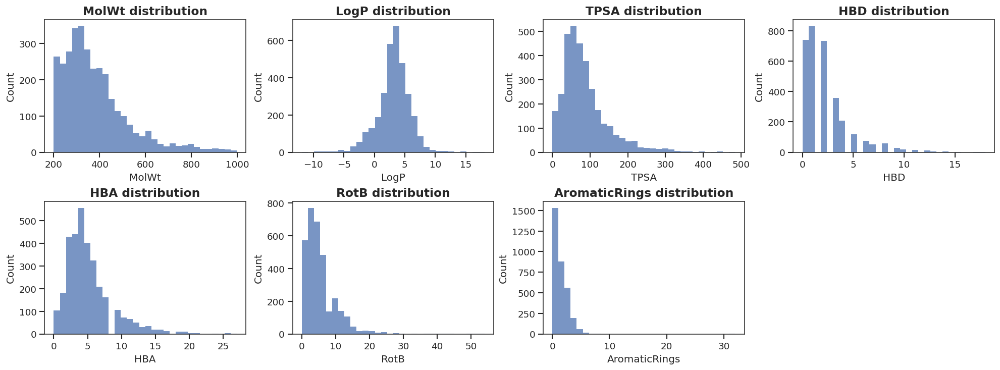

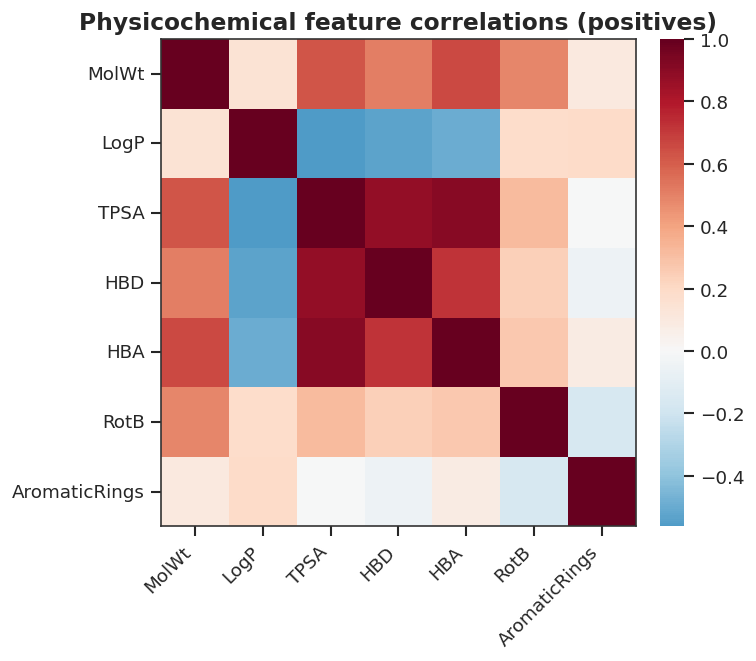

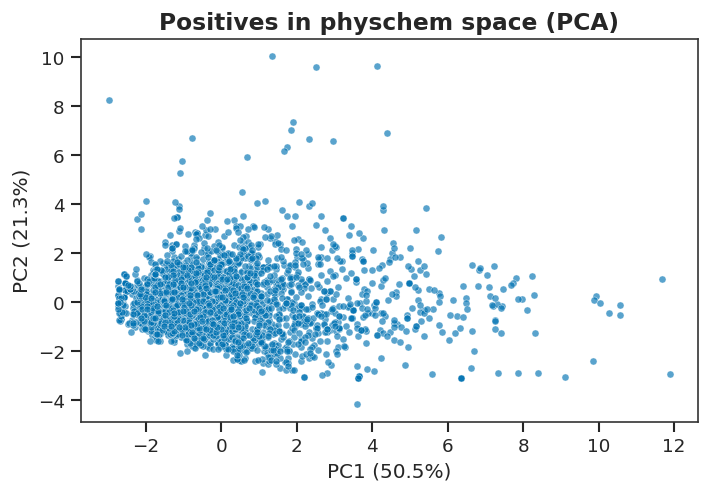

In [16]:
# Positive physicochemical summary (CTD positives)
phys_names = ['MolWt', 'LogP', 'TPSA', 'HBD', 'HBA', 'RotB', 'AromaticRings']

if 'pos_X_phys' not in globals():
    print('Run positive featurization first.')
else:
    df_pos = pd.DataFrame(pos_X_phys, columns=phys_names)

    # Histogram grid
    ncols = 4
    nrows = (len(phys_names) + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.1 * ncols, 3.0 * nrows), constrained_layout=True)
    axes = np.ravel(axes)
    for i, col in enumerate(phys_names):
        ax = axes[i]
        sns.histplot(df_pos[col], bins=30, color='#4C72B0', edgecolor='none', ax=ax)
        ax.set_title(f'{col} distribution')
        ax.set_xlabel(col)
        ax.set_ylabel('Count')
        clean_ax(ax)
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    save_fig('ctd_positive_physchem_hist_grid', fig)
    plt.show()

    # Correlation heatmap
    corr = df_pos.corr(numeric_only=True)
    fig, ax = plt.subplots(figsize=(6.2, 5.4), constrained_layout=True)
    sns.heatmap(corr, cmap='RdBu_r', center=0.0, annot=False, ax=ax)
    ax.set_title('Physicochemical feature correlations (positives)')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
    for spine in ax.spines.values():
        spine.set_visible(True)
    save_fig('ctd_positive_physchem_correlations', fig)
    plt.show()

    # PCA (physchem)
    from sklearn.decomposition import PCA
    from sklearn.preprocessing import StandardScaler

    Xz = StandardScaler().fit_transform(df_pos.values.astype(float))
    pca = PCA(n_components=2, random_state=RANDOM_STATE)
    emb = pca.fit_transform(Xz)
    emb_df = pd.DataFrame({'PC1': emb[:, 0], 'PC2': emb[:, 1]})

    fig, ax = plt.subplots(figsize=(5.8, 4.0), constrained_layout=True)
    sns.scatterplot(data=emb_df, x='PC1', y='PC2', s=18, alpha=0.65, color='#0072B2', ax=ax)
    ax.set_title('Positives in physchem space (PCA)')
    ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
    ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
    clean_ax(ax)
    save_fig('ctd_positive_physchem_pca', fig)
    plt.show()


## Decoy controls (BindingDB)

Build property-matched decoy controls from BindingDB and construct a balanced supervised dataset.


Loaded BindingDB pool: 58377
Decoys selected: 3252 (per positive=1)
Saved decoy pairs: interim/asthma_decoy_pairs_bindingdb.csv (n=3252)


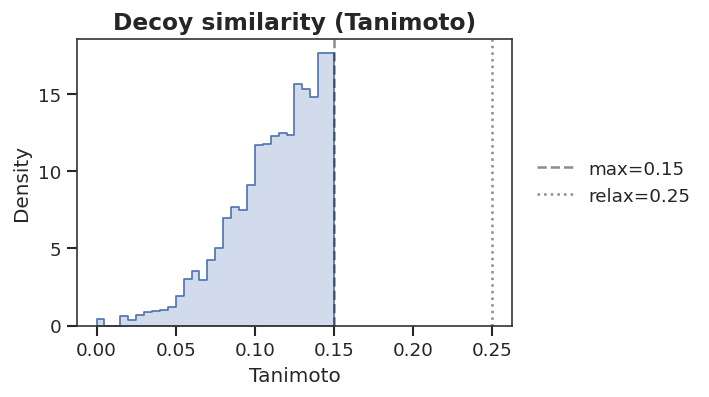

/tmp/ipykernel_412593/2358168510.py:42: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc=loc, bbox_to_anchor=bbox_to_anchor, frameon=False, title=title)


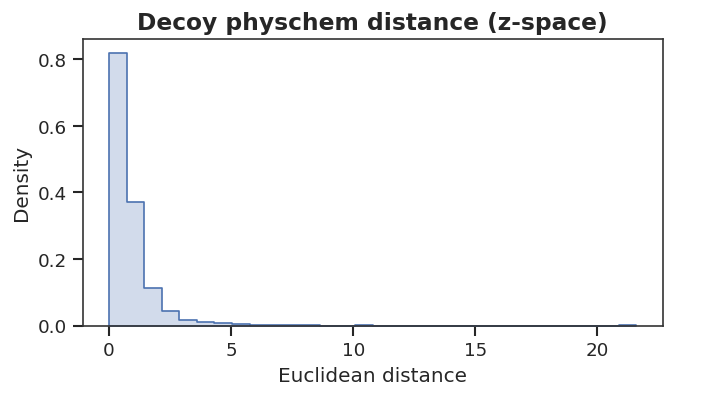

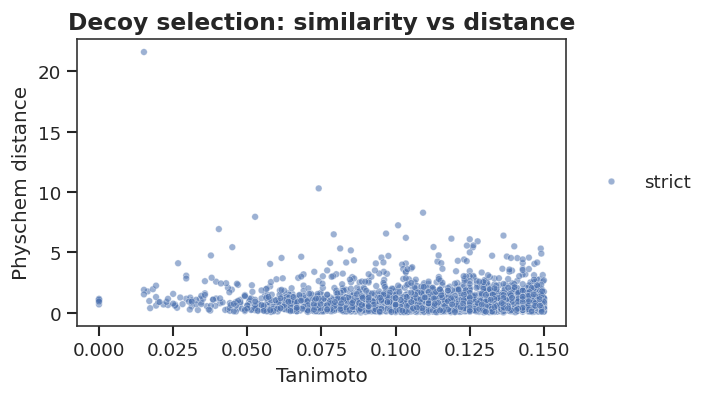

Saved training dataset: interim/asthma_training_dataset_ctd_bindingdb_decoys.csv


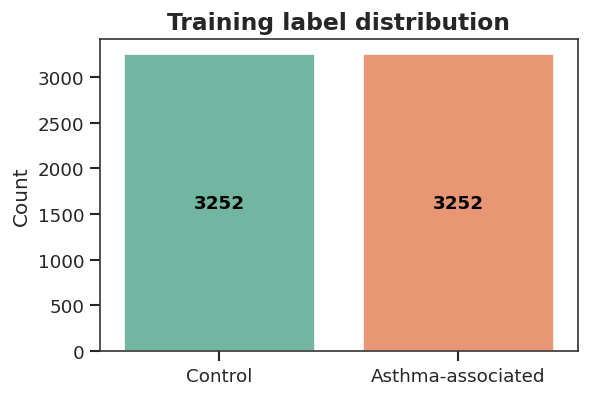

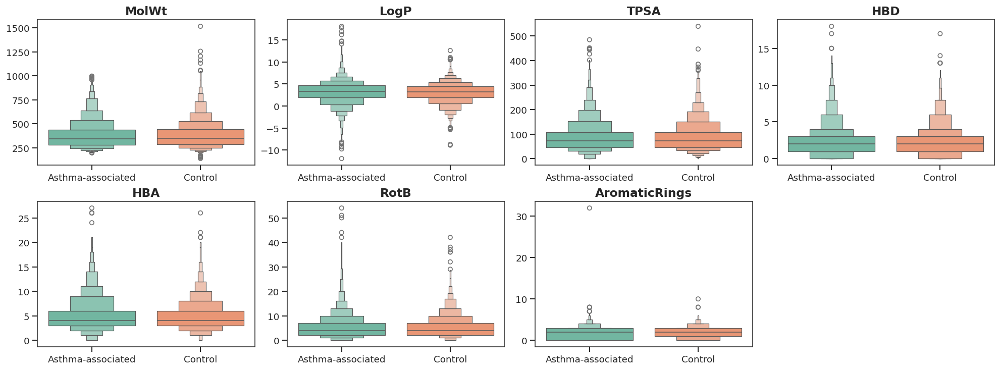

In [17]:
from sklearn.neighbors import NearestNeighbors

bindingdb_path = resolve_input_path(cfg.bindingdb_file, env_key='AM_BINDINGDB_TSV')

build_decoys = bool(int(os.environ.get('AM_ASTHMA_BUILD_DECOYS', '1')))
if not build_decoys:
    raise RuntimeError('AM_ASTHMA_BUILD_DECOYS=0: decoy controls disabled, training aborted (no reliable negatives).')

decoys_per_positive = int(os.environ.get('AM_ASTHMA_DECOYS_PER_POS', '1'))
neighbor_pool = int(os.environ.get('AM_ASTHMA_DECOY_NEIGHBORS', '200'))
allow_negative_reuse = bool(int(os.environ.get('AM_ASTHMA_DECOY_REUSE', '0')))
max_tanimoto = float(os.environ.get('AM_ASTHMA_DECOY_MAX_TANIMOTO', '0.15'))
relax_max_tanimoto = float(os.environ.get('AM_ASTHMA_DECOY_RELAX_MAX_TANIMOTO', '0.25'))
random_tries = int(os.environ.get('AM_ASTHMA_DECOY_RANDOM_TRIES', '800'))

pool_unique_target = int(os.environ.get('AM_ASTHMA_DECOY_POOL_UNIQUE', '60000'))
chunk_size = int(os.environ.get('AM_ASTHMA_DECOY_CHUNK', '200000'))

pool_cache = cfg.interim_dir / f'bindingdb_decoy_pool_{pool_unique_target}.npz'


def tanimoto_from_bit_arrays(a, b, a_sum, b_sum):
    inter = np.logical_and(a, b).sum()
    union = int(a_sum) + int(b_sum) - int(inter)
    return float(inter) / float(union) if union > 0 else 0.0


# 1) Build or load a BindingDB pool (unique canonical SMILES + features)
if pool_cache.exists():
    z = np.load(pool_cache, allow_pickle=True)
    pool_smiles = z['pool_smiles'].astype(object)
    pool_fp = z['pool_fp']
    pool_phys = z['pool_phys']
    print(f'Loaded BindingDB pool: {len(pool_smiles)}')
else:
    if not bindingdb_path.exists():
        raise FileNotFoundError(f'Missing BindingDB TSV: {bindingdb_path}')

    seen = set()
    sampled = []

    for chunk in pd.read_csv(bindingdb_path, sep='	', usecols=['Ligand SMILES'], chunksize=chunk_size):
        vals = chunk['Ligand SMILES'].dropna().astype(str).str.strip()
        vals = vals[vals.ne('') & vals.str.lower().ne('nan')]
        for s in vals.unique().tolist():
            if s in seen:
                continue
            seen.add(s)
            sampled.append(s)
            if len(sampled) >= pool_unique_target:
                break
        if len(sampled) >= pool_unique_target:
            break

    pool_fp_list, pool_phys_list, pool_smiles_list = [], [], []
    for s in tqdm(sampled, total=len(sampled), desc='Featurize BindingDB pool', leave=False):
        cs = canonicalize_smiles(s)
        if cs is None:
            continue
        fp, ph = smiles_to_features(cs, cfg)
        if fp is None:
            continue
        pool_smiles_list.append(cs)
        pool_fp_list.append(fp)
        pool_phys_list.append(ph)

    if not pool_fp_list:
        raise RuntimeError('Failed to build a decoy pool from BindingDB (no valid features).')

    pool_smiles = np.array(pool_smiles_list, dtype=object)
    pool_fp = np.vstack(pool_fp_list)
    pool_phys = np.vstack(pool_phys_list)

    # Deduplicate by canonical SMILES
    _, uniq_idx = np.unique(pool_smiles, return_index=True)
    uniq_idx = np.sort(uniq_idx)
    pool_smiles = pool_smiles[uniq_idx]
    pool_fp = pool_fp[uniq_idx]
    pool_phys = pool_phys[uniq_idx]

    # Remove overlaps with positives
    pos_set = set(map(str, pos_smiles_used.tolist()))
    mask = np.array([s not in pos_set for s in pool_smiles], dtype=bool)
    pool_smiles = pool_smiles[mask]
    pool_fp = pool_fp[mask]
    pool_phys = pool_phys[mask]

    np.savez_compressed(pool_cache, pool_smiles=pool_smiles, pool_fp=pool_fp, pool_phys=pool_phys)
    print(f'Saved BindingDB pool cache: {pool_cache} (n={len(pool_smiles)})')


# 2) Select property-matched decoys for each positive
if len(pool_smiles) < 1000:
    print('Warning: small decoy pool; consider increasing AM_ASTHMA_DECOY_POOL_UNIQUE.')

# Standardize physchem for neighbor search
sc = StandardScaler().fit(np.vstack([pos_X_phys, pool_phys]))
pos_z = sc.transform(pos_X_phys)
pool_z = sc.transform(pool_phys)

k = int(min(max(5, neighbor_pool), len(pool_z)))
nbrs = NearestNeighbors(n_neighbors=k, algorithm='auto').fit(pool_z)
neighbor_idx = nbrs.kneighbors(pos_z, return_distance=False)

pos_bool = pos_X_fp.astype(bool)
pool_bool = pool_fp.astype(bool)
pos_pop = pos_bool.sum(axis=1)
pool_pop = pool_bool.sum(axis=1)

selected_records = []
used = set()
rng = np.random.default_rng(int(RANDOM_STATE) + 12345)

for i in range(len(pos_bool)):
    picked = 0

    # Strict pass: enforce max_tanimoto
    for j in neighbor_idx[i]:
        jj = int(j)
        if (not allow_negative_reuse) and (jj in used):
            continue
        sim = tanimoto_from_bit_arrays(pos_bool[i], pool_bool[jj], pos_pop[i], pool_pop[jj])
        if float(sim) > float(max_tanimoto):
            continue
        dist = float(np.linalg.norm(pos_z[i] - pool_z[jj]))
        selected_records.append({'pos_index': int(i), 'pool_index': int(jj), 'tanimoto': float(sim), 'phys_dist': dist, 'select_mode': 'strict'})
        used.add(jj)
        picked += 1
        if picked >= int(decoys_per_positive):
            break

    # Relaxed neighbor pass: still enforce relax_max_tanimoto
    if picked < int(decoys_per_positive):
        for j in neighbor_idx[i]:
            jj = int(j)
            if (not allow_negative_reuse) and (jj in used):
                continue
            sim = tanimoto_from_bit_arrays(pos_bool[i], pool_bool[jj], pos_pop[i], pool_pop[jj])
            if float(sim) > float(relax_max_tanimoto):
                continue
            dist = float(np.linalg.norm(pos_z[i] - pool_z[jj]))
            selected_records.append({'pos_index': int(i), 'pool_index': int(jj), 'tanimoto': float(sim), 'phys_dist': dist, 'select_mode': 'relaxed_nn'})
            used.add(jj)
            picked += 1
            if picked >= int(decoys_per_positive):
                break

    # Random pass: sample from full pool (still enforce relax_max_tanimoto)
    if picked < int(decoys_per_positive) and int(random_tries) > 0:
        cand = rng.choice(len(pool_bool), size=int(min(int(random_tries), len(pool_bool))), replace=False)
        for jj in cand:
            jj = int(jj)
            if (not allow_negative_reuse) and (jj in used):
                continue
            sim = tanimoto_from_bit_arrays(pos_bool[i], pool_bool[jj], pos_pop[i], pool_pop[jj])
            if float(sim) > float(relax_max_tanimoto):
                continue
            dist = float(np.linalg.norm(pos_z[i] - pool_z[jj]))
            selected_records.append({'pos_index': int(i), 'pool_index': int(jj), 'tanimoto': float(sim), 'phys_dist': dist, 'select_mode': 'relaxed_random'})
            used.add(jj)
            picked += 1
            if picked >= int(decoys_per_positive):
                break

pairs_df = pd.DataFrame(selected_records)
selected = pairs_df['pool_index'].to_numpy(dtype=int) if (not pairs_df.empty) else np.array([], dtype=int)

neg_smiles = pool_smiles[selected]
neg_fp = pool_fp[selected]
neg_phys = pool_phys[selected]
neg_names = np.array([f'BindingDB decoy' for _ in range(len(selected))], dtype=object)

print(f'Decoys selected: {len(selected)} (per positive={decoys_per_positive})')

pairs_path = cfg.interim_dir / 'asthma_decoy_pairs_bindingdb.csv'
pairs_df_out = pairs_df.copy()
if not pairs_df_out.empty:
    pairs_df_out['pos_name'] = [str(pos_names_used[int(i)]) for i in pairs_df_out['pos_index'].astype(int)]
    pairs_df_out['pos_smiles'] = [str(pos_smiles_used[int(i)]) for i in pairs_df_out['pos_index'].astype(int)]
    pairs_df_out['decoy_smiles'] = [str(pool_smiles[int(j)]) for j in pairs_df_out['pool_index'].astype(int)]
    pairs_df_out['pos_mw'] = [float(pos_X_phys[int(i), 0]) for i in pairs_df_out['pos_index'].astype(int)]
    pairs_df_out['decoy_mw'] = [float(pool_phys[int(j), 0]) for j in pairs_df_out['pool_index'].astype(int)]
pairs_df_out.to_csv(pairs_path, index=False)
print(f'Saved decoy pairs: {pairs_path} (n={len(pairs_df_out)})')

# Decoy diagnostics (similarity vs. property matching)
if not pairs_df_out.empty:
    fig, ax = plt.subplots(figsize=(5.8, 3.2), constrained_layout=True)
    sns.histplot(
        data=pairs_df_out,
        x='tanimoto',
        hue='select_mode',
        bins=30,
        stat='density',
        common_norm=False,
        element='step',
        ax=ax,
    )
    ax.axvline(float(max_tanimoto), color='k', linestyle='--', alpha=0.5, label=f'max={float(max_tanimoto):.2f}')
    ax.axvline(float(relax_max_tanimoto), color='k', linestyle=':', alpha=0.5, label=f'relax={float(relax_max_tanimoto):.2f}')
    ax.set_title('Decoy similarity (Tanimoto)')
    ax.set_xlabel('Tanimoto')
    ax.set_ylabel('Density')
    legend_outside(ax, loc='center left', bbox_to_anchor=(1.02, 0.5))
    clean_ax(ax)
    save_fig('asthma_decoy_tanimoto_hist', fig)
    plt.show()

    fig, ax = plt.subplots(figsize=(5.8, 3.2), constrained_layout=True)
    sns.histplot(
        data=pairs_df_out,
        x='phys_dist',
        hue='select_mode',
        bins=30,
        stat='density',
        common_norm=False,
        element='step',
        ax=ax,
    )
    ax.set_title('Decoy physchem distance (z-space)')
    ax.set_xlabel('Euclidean distance')
    ax.set_ylabel('Density')
    legend_outside(ax, loc='center left', bbox_to_anchor=(1.02, 0.5))
    clean_ax(ax)
    save_fig('asthma_decoy_physdist_hist', fig)
    plt.show()

    fig, ax = plt.subplots(figsize=(5.8, 3.2), constrained_layout=True)
    sample_n = int(min(len(pairs_df_out), 5000))
    plot_df = pairs_df_out.sample(sample_n, random_state=RANDOM_STATE) if sample_n > 0 else pairs_df_out
    sns.scatterplot(
        data=plot_df,
        x='tanimoto',
        y='phys_dist',
        hue='select_mode',
        alpha=0.55,
        s=16,
        ax=ax,
    )
    ax.set_title('Decoy selection: similarity vs distance')
    ax.set_xlabel('Tanimoto')
    ax.set_ylabel('Physchem distance')
    legend_outside(ax, loc='center left', bbox_to_anchor=(1.02, 0.5))
    clean_ax(ax)
    save_fig('asthma_decoy_similarity_vs_distance', fig)
    plt.show()

# 3) Construct final supervised dataset
smiles_used = np.concatenate([pos_smiles_used, neg_smiles])
names_used = np.concatenate([pos_names_used, neg_names])

X_fp = np.vstack([pos_X_fp, neg_fp])
X_phys = np.vstack([pos_X_phys, neg_phys])
X = np.hstack([X_fp, X_phys])

y = np.concatenate([np.ones(len(pos_smiles_used), dtype=int), np.zeros(len(neg_smiles), dtype=int)])

label_map = {0: 'Control', 1: 'Asthma-associated'}
label_name = pd.Series(y).map(label_map).values

asthma_dataset = pd.DataFrame({
    'compound_name': names_used,
    'SMILES': smiles_used,
    'label': y,
    'label_name': label_name,
})

# Full copies (used as a generic pool downstream)
X_full = X.copy(); y_full = y.copy(); X_fp_full = X_fp.copy(); X_phys_full = X_phys.copy(); smiles_full = smiles_used.copy()

out_ds = cfg.interim_dir / 'asthma_training_dataset_ctd_bindingdb_decoys.csv'
asthma_dataset.to_csv(out_ds, index=False)
print(f'Saved training dataset: {out_ds}')

# Dataset diagnostics (label distribution + physchem contrasts)
phys_names = ['MolWt', 'LogP', 'TPSA', 'HBD', 'HBA', 'RotB', 'AromaticRings']
df_phys = pd.DataFrame(X_phys, columns=phys_names)
df_phys['label_name'] = asthma_dataset['label_name'].values

counts = asthma_dataset['label_name'].value_counts().reindex(['Control', 'Asthma-associated'])
fig, ax = plt.subplots(figsize=(4.8, 3.2), constrained_layout=True)
sns.barplot(x=counts.index, y=counts.values, hue=counts.index, palette='Set2', legend=False, ax=ax)
ax.set_title('Training label distribution')
ax.set_xlabel('')
ax.set_ylabel('Count')
annotate_bars_center(ax)
clean_ax(ax)
save_fig('asthma_training_label_distribution', fig)
plt.show()

# Physchem boxen panels
ncols = 4
nrows = (len(phys_names) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(4.1*ncols, 3.0*nrows), constrained_layout=True)
axes = np.ravel(axes)
for i, col in enumerate(phys_names):
    ax = axes[i]
    sns.boxenplot(
        data=df_phys,
        x='label_name',
        y=col,
        hue='label_name',
        dodge=False,
        palette='Set2',
        legend=False,
        ax=ax,
    )
    ax.set_title(col)
    ax.set_xlabel('')
    ax.set_ylabel('')
    clean_ax(ax)
for j in range(i+1, len(axes)):
    axes[j].axis('off')

save_fig('asthma_training_physchem_by_label', fig)
plt.show()


## Train/validation/test split

Stratified splits (80/10/10).


Train label counts: {'Asthma-associated': 2602, 'Control': 2601}
Val label counts: {'Control': 325, 'Asthma-associated': 325}
Test label counts: {'Control': 326, 'Asthma-associated': 325}


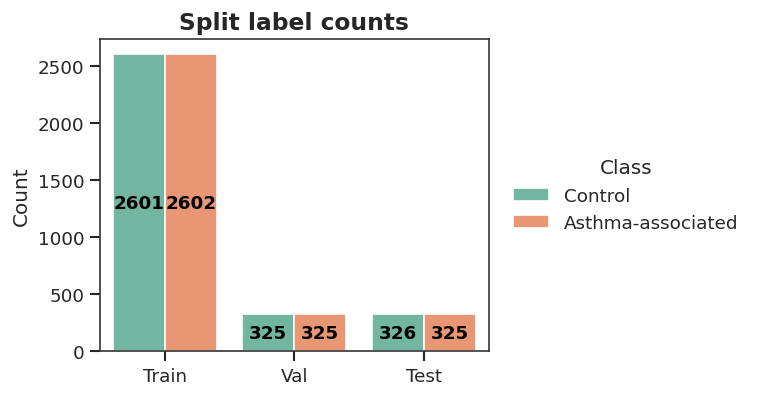

In [18]:
# Stratified train/val/test split (80/10/10) with index tracking
idx_all = np.arange(len(y))

X_train, X_temp, y_train, y_temp, idx_train, idx_temp = train_test_split(
    X,
    y,
    idx_all,
    test_size=0.2,
    random_state=RANDOM_STATE,
    stratify=y,
)

X_val, X_test, y_val, y_test, idx_val, idx_test = train_test_split(
    X_temp,
    y_temp,
    idx_temp,
    test_size=0.5,
    random_state=RANDOM_STATE,
    stratify=y_temp,
)

def _label_counts(y_arr, name):
    vc = pd.Series(y_arr).map({0: 'Control', 1: 'Asthma-associated'}).value_counts()
    print(f"{name} label counts: {vc.to_dict()}")

_label_counts(y_train, 'Train')
_label_counts(y_val, 'Val')
_label_counts(y_test, 'Test')

# Split diagnostics (visual)
rows = []
for split, y_arr in [('Train', y_train), ('Val', y_val), ('Test', y_test)]:
    vc = pd.Series(y_arr).map({0: 'Control', 1: 'Asthma-associated'}).value_counts()
    for label in ['Control', 'Asthma-associated']:
        rows.append({'split': split, 'label': label, 'count': int(vc.get(label, 0))})

split_counts = pd.DataFrame(rows)
fig, ax = plt.subplots(figsize=(6.2, 3.2), constrained_layout=True)
sns.barplot(data=split_counts, x='split', y='count', hue='label', palette='Set2', ax=ax)
ax.set_title('Split label counts')
ax.set_xlabel('')
ax.set_ylabel('Count')
legend_outside(ax, title='Class', loc='center left', bbox_to_anchor=(1.02, 0.5))
annotate_bars_center(ax)
clean_ax(ax)
save_fig('asthma_split_label_counts', fig)
plt.show()


## Deep learning model: AsthmaNet (SMILES CNN + FP/physchem)

seed 42 epoch 1/120 loss 1.1452 val_auc 0.643 val_pr 0.674 thr_score 0.277 thr 0.738
seed 42 epoch 2/120 loss 1.0979 val_auc 0.702 val_pr 0.738 thr_score 0.422 thr 0.751
seed 42 epoch 3/120 loss 1.0652 val_auc 0.731 val_pr 0.768 thr_score 0.508 thr 0.751
seed 42 epoch 4/120 loss 1.0258 val_auc 0.748 val_pr 0.783 thr_score 0.532 thr 0.759
seed 42 epoch 5/120 loss 0.9736 val_auc 0.767 val_pr 0.799 thr_score 0.572 thr 0.765
seed 42 epoch 6/120 loss 0.9128 val_auc 0.792 val_pr 0.816 thr_score 0.600 thr 0.795
seed 42 epoch 7/120 loss 0.8425 val_auc 0.825 val_pr 0.837 thr_score 0.628 thr 0.784
seed 42 epoch 8/120 loss 0.7630 val_auc 0.850 val_pr 0.850 thr_score 0.658 thr 0.805
seed 42 epoch 9/120 loss 0.6863 val_auc 0.865 val_pr 0.861 thr_score 0.665 thr 0.867
seed 42 epoch 10/120 loss 0.6134 val_auc 0.869 val_pr 0.864 thr_score 0.652 thr 0.826
seed 42 epoch 11/120 loss 0.5363 val_auc 0.870 val_pr 0.863 thr_score 0.628 thr 0.807
seed 42 epoch 12/120 loss 0.4747 val_auc 0.869 val_pr 0.863 thr

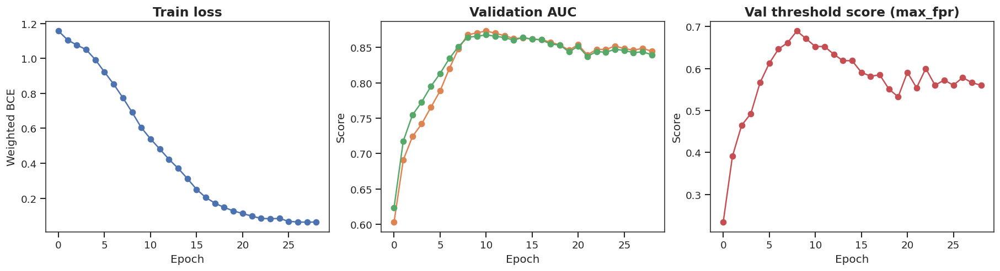

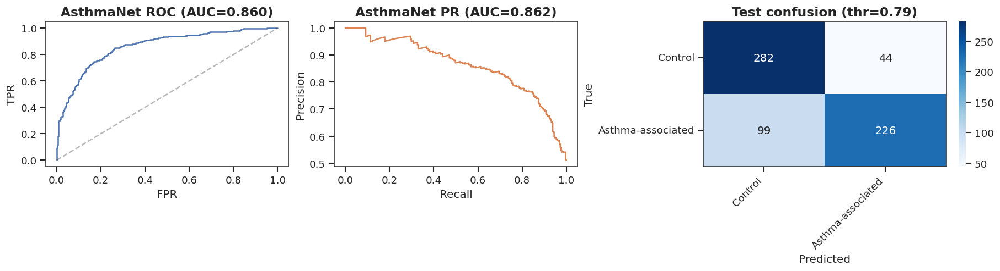

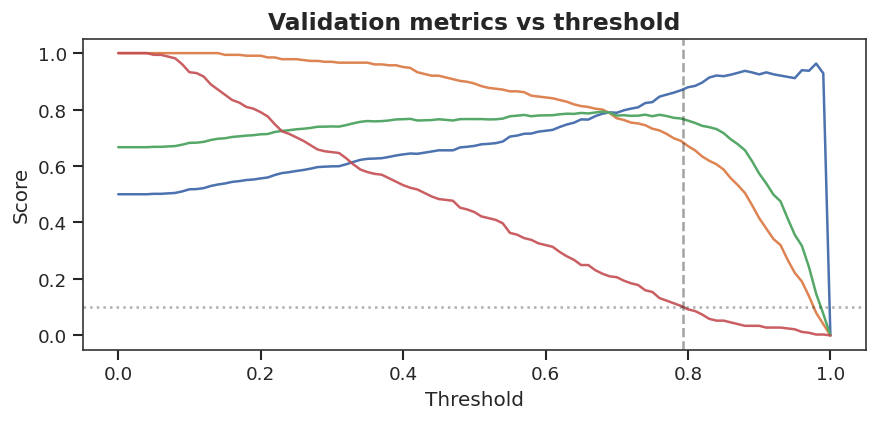

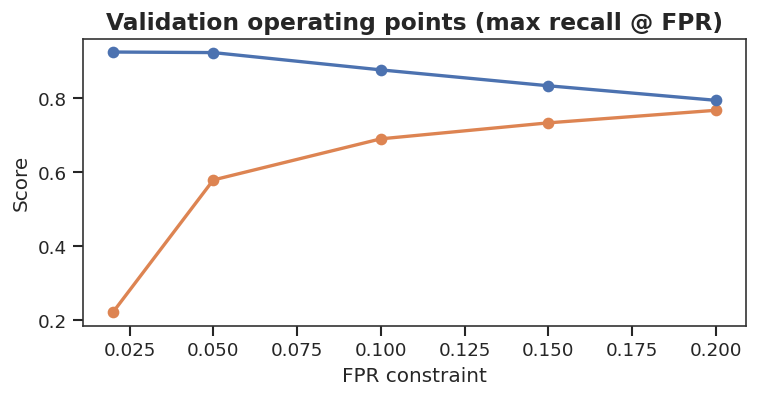

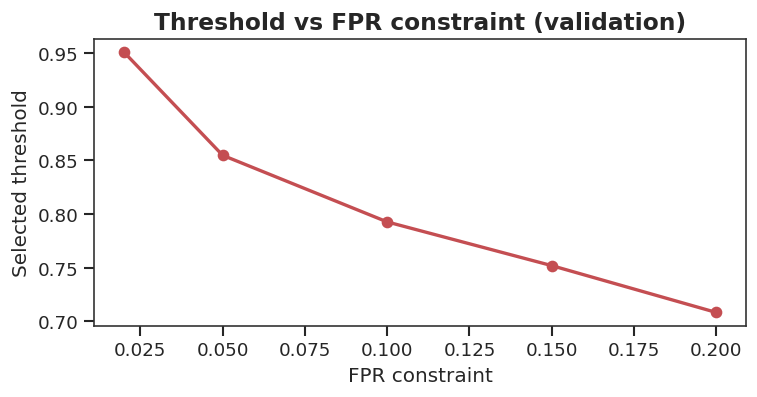

Saved AsthmaNet: models/asthma_risk_asthmanet.pt


In [19]:
# Asthma model (deep learning): AsthmaNet (SMILES CNN + FP/physchem) — recall-first (reduce false negatives)
import re
import random
from dataclasses import asdict

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    precision_recall_curve,
)

# -----------------
# Configuration
# -----------------
DEVICE_PREF = os.environ.get('AM_ASTHMA_DEVICE', 'auto').strip().lower()
DEVICE = torch.device('cuda' if (DEVICE_PREF in {'auto','cuda','gpu'} and torch.cuda.is_available()) else 'cpu')

EPOCHS = int(os.environ.get('AM_ASTHMA_EPOCHS', '120'))
BATCH_SIZE = int(os.environ.get('AM_ASTHMA_BATCH_SIZE', '128'))
LR = float(os.environ.get('AM_ASTHMA_LR', '3e-4'))
WEIGHT_DECAY = float(os.environ.get('AM_ASTHMA_WEIGHT_DECAY', '1e-4'))
PATIENCE = int(os.environ.get('AM_ASTHMA_PATIENCE', '20'))

# Threshold selection (default: recall-first)
F_BETA = float(os.environ.get('AM_ASTHMA_F_BETA', '2.0'))
THR_METRIC = os.environ.get('AM_ASTHMA_THR_METRIC', 'max_fpr').strip().lower()  # fbeta|balanced|max_fpr
MAX_FPR = os.environ.get('AM_ASTHMA_MAX_FPR', '0.10').strip()
MAX_FPR = float(MAX_FPR) if MAX_FPR not in {'', 'none', 'None'} else None

# Loss weighting (recall-first: penalize false negatives via POS_WEIGHT)
POS_WEIGHT = float(os.environ.get('AM_ASTHMA_POS_WEIGHT', '3.0'))
NEG_WEIGHT = float(os.environ.get('AM_ASTHMA_NEG_WEIGHT', '1.0'))

# SMILES encoder
MAX_SMI_LEN = int(os.environ.get('AM_ASTHMA_MAX_SMI_LEN', '140'))
SMI_EMBED = int(os.environ.get('AM_ASTHMA_SMI_EMBED', '128'))
SMI_CHANNELS = int(os.environ.get('AM_ASTHMA_SMI_CHANNELS', '256'))
SMI_DROPOUT = float(os.environ.get('AM_ASTHMA_SMI_DROPOUT', '0.2'))

# Tabular trunk
FP_HIDDEN = int(os.environ.get('AM_ASTHMA_FP_HIDDEN', '512'))
PHYS_HIDDEN = int(os.environ.get('AM_ASTHMA_PHYS_HIDDEN', '96'))
TRUNK_HIDDEN = int(os.environ.get('AM_ASTHMA_TRUNK_HIDDEN', '256'))
DROPOUT = float(os.environ.get('AM_ASTHMA_DROPOUT', '0.25'))

# Augmentation + (optional) FGSM
SMI_AUG_PROB = float(os.environ.get('AM_ASTHMA_SMILES_AUG_PROB', '0.7'))
ADV_EPS = float(os.environ.get('AM_ASTHMA_ADV_EPS', '0.0'))

# Ensembling (stability + uncertainty)
ENSEMBLE_N = int(os.environ.get('AM_ASTHMA_ENSEMBLE_N', '5'))

SEED0 = int(os.environ.get('AM_ASTHMA_SEED', str(RANDOM_STATE)))

# -----------------
# Tokenizer
# -----------------
SMILES_TOKEN_PATTERN = re.compile(
    r"(\[[^\]]+\]|Br|Cl|Si|Se|Na|Ca|Li|Mg|Al|Zn|Fe|Cu|Mn|Hg|Sn|Pb|Bi|Ag|Au|\%\d{2}|\d|\(|\)|\.|=|#|-|\+|\\|\/|:|~|@|\?|>|\*|\$|[A-Za-z])"
)


def tokenize_smiles(smi: str):
    smi = '' if smi is None else str(smi).strip()
    if not smi:
        return []
    return SMILES_TOKEN_PATTERN.findall(smi)


def build_vocab(smiles_list, min_freq=1):
    from collections import Counter

    counter = Counter()
    for s in smiles_list:
        counter.update(tokenize_smiles(s))

    itos = ['<pad>', '<unk>']
    for tok, cnt in counter.most_common():
        if cnt >= int(min_freq):
            itos.append(tok)
    stoi = {t: i for i, t in enumerate(itos)}
    return stoi, itos


def encode_smiles(smi: str, stoi: dict, max_len: int):
    toks = tokenize_smiles(smi)
    ids = [stoi.get(t, 1) for t in toks][: int(max_len)]
    pad = int(max_len) - len(ids)
    if pad > 0:
        ids = ids + [0] * pad
    return np.asarray(ids, dtype=np.int64)


def randomize_smiles(smi: str) -> str:
    smi = '' if smi is None else str(smi).strip()
    if not smi:
        return smi
    try:
        mol = Chem.MolFromSmiles(smi)
        if mol is None:
            return smi
        return Chem.MolToSmiles(mol, doRandom=True, isomericSmiles=True)
    except Exception:
        return smi


# -----------------
# Threshold selection
# -----------------
def select_threshold(y_true, proba, metric='fbeta', beta=0.5, max_fpr=None):
    y_true = np.asarray(y_true, dtype=int)
    proba = np.asarray(proba, dtype=float)

    # Candidate thresholds from PR curve + extra grid
    prec, rec, thr_pr = precision_recall_curve(y_true, proba)
    thr_grid = np.linspace(0.05, 0.95, 181)
    thr = np.unique(np.concatenate([thr_pr, thr_grid]))

    best = {'thr': 0.5, 'score': -1.0, 'metric': metric}

    for t in thr:
        pred = (proba >= t).astype(int)
        tp = int(((pred == 1) & (y_true == 1)).sum())
        fp = int(((pred == 1) & (y_true == 0)).sum())
        tn = int(((pred == 0) & (y_true == 0)).sum())
        fn = int(((pred == 0) & (y_true == 1)).sum())

        precision = tp / max(1, tp + fp)
        recall = tp / max(1, tp + fn)
        fpr = fp / max(1, fp + tn)
        tnr = tn / max(1, tn + fp)

        if (max_fpr is not None) and (fpr > float(max_fpr)):
            continue

        if metric == 'balanced':
            score = 0.5 * (recall + tnr)
        elif metric == 'max_fpr':
            # among feasible thresholds, maximize recall (precision-first is imposed by max_fpr)
            score = recall
        else:
            b2 = float(beta) ** 2
            score = (1 + b2) * precision * recall / max(1e-12, (b2 * precision + recall))

        if score > best['score'] + 1e-9:
            best = {'thr': float(t), 'score': float(score), 'metric': metric, 'precision': float(precision), 'recall': float(recall), 'fpr': float(fpr)}

    return best


# -----------------
# Dataset
# -----------------
assert 'idx_train' in globals() and 'idx_val' in globals() and 'idx_test' in globals(), 'Run the split cell first.'

# Scale physchem tail only (fit on train)
phys_dim = int(X_phys.shape[1])
fp_dim = int(X_fp.shape[1])

scaler = StandardScaler()
scaler.fit(X_phys[idx_train])
X_phys_s = scaler.transform(X_phys).astype(np.float32)

X_fp_f = X_fp.astype(np.float32)

# Vocab from training SMILES
train_smiles = np.asarray(smiles_used, dtype=object)[idx_train]
smiles_stoi, smiles_itos = build_vocab(train_smiles, min_freq=1)
VOCAB_SIZE = int(len(smiles_stoi))


class AsthmaDataset(Dataset):
    def __init__(self, indices, smiles, X_fp, X_phys_s, y, names=None, augment=False):
        self.indices = np.asarray(indices, dtype=int)
        self.smiles = np.asarray(smiles, dtype=object)
        self.X_fp = np.asarray(X_fp, dtype=np.float32)
        self.X_phys = np.asarray(X_phys_s, dtype=np.float32)
        self.y = np.asarray(y, dtype=np.int64)
        self.names = np.asarray(names, dtype=object) if names is not None else None
        self.augment = bool(augment)

    def __len__(self):
        return int(len(self.indices))

    def __getitem__(self, i):
        idx = int(self.indices[int(i)])
        smi = self.smiles[idx]
        if self.augment and (random.random() < float(SMI_AUG_PROB)):
            smi = randomize_smiles(smi)
        ids = encode_smiles(smi, smiles_stoi, MAX_SMI_LEN)
        fp = self.X_fp[idx]
        phys = self.X_phys[idx]
        yv = float(self.y[idx])
        nm = self.names[idx] if self.names is not None else None
        return (
            torch.tensor(ids, dtype=torch.long),
            torch.tensor(fp, dtype=torch.float32),
            torch.tensor(phys, dtype=torch.float32),
            torch.tensor(yv, dtype=torch.float32),
            nm,
        )


def make_loader(indices, augment=False, shuffle=False):
    ds = AsthmaDataset(indices, smiles_used, X_fp_f, X_phys_s, y, names=names_used if 'names_used' in globals() else None, augment=augment)
    return DataLoader(ds, batch_size=BATCH_SIZE, shuffle=shuffle, num_workers=0)


train_loader = make_loader(idx_train, augment=True, shuffle=True)
val_loader = make_loader(idx_val, augment=False, shuffle=False)
test_loader = make_loader(idx_test, augment=False, shuffle=False)


# -----------------
# Model
# -----------------
class SmilesCNN(nn.Module):
    def __init__(self, vocab_size, embed_dim=128, channels=256, kernels=(3, 5, 7, 9), dropout=0.2):
        super().__init__()
        self.embed = nn.Embedding(int(vocab_size), int(embed_dim), padding_idx=0)
        self.convs = nn.ModuleList([
            nn.Conv1d(int(embed_dim), int(channels), int(k), padding=int(k)//2) for k in kernels
        ])
        self.dropout = nn.Dropout(float(dropout))
        self.out_dim = int(channels) * int(len(kernels))

    def forward(self, ids):
        x = self.embed(ids)  # (B, L, E)
        x = self.dropout(x)
        x = x.transpose(1, 2)  # (B, E, L)
        outs = []
        for conv in self.convs:
            o = torch.relu(conv(x))
            o = torch.max(o, dim=2).values
            outs.append(o)
        return torch.cat(outs, dim=1)


class AsthmaNet(nn.Module):
    def __init__(self, vocab_size, fp_dim, phys_dim):
        super().__init__()
        self.smi = SmilesCNN(vocab_size, embed_dim=SMI_EMBED, channels=SMI_CHANNELS, dropout=SMI_DROPOUT)

        self.fp_mlp = nn.Sequential(
            nn.Linear(int(fp_dim), int(FP_HIDDEN)),
            nn.ReLU(),
            nn.Dropout(float(DROPOUT)),
        )
        self.phys_mlp = nn.Sequential(
            nn.Linear(int(phys_dim), int(PHYS_HIDDEN)),
            nn.ReLU(),
            nn.Dropout(float(DROPOUT)),
        )

        trunk_in = int(self.smi.out_dim) + int(FP_HIDDEN) + int(PHYS_HIDDEN)
        self.trunk = nn.Sequential(
            nn.Linear(trunk_in, int(TRUNK_HIDDEN)),
            nn.ReLU(),
            nn.Dropout(float(DROPOUT)),
            nn.Linear(int(TRUNK_HIDDEN), 1),
        )

    def forward(self, ids, fp, phys):
        s = self.smi(ids)
        f = self.fp_mlp(fp)
        p = self.phys_mlp(phys)
        x = torch.cat([s, f, p], dim=1)
        return self.trunk(x).squeeze(-1)


def weighted_bce_with_logits(logits, targets):
    w = targets * float(POS_WEIGHT) + (1.0 - targets) * float(NEG_WEIGHT)
    return F.binary_cross_entropy_with_logits(logits, targets, weight=w)


@torch.no_grad()
def predict_proba(model, loader):
    model.eval()
    out = []
    ys = []
    names = []
    for ids, fp, phys, yb, nm in loader:
        ids = ids.to(DEVICE)
        fp = fp.to(DEVICE)
        phys = phys.to(DEVICE)
        logits = model(ids, fp, phys)
        out.append(torch.sigmoid(logits).detach().cpu().numpy())
        ys.append(yb.detach().cpu().numpy())
        names.extend([None if x is None else str(x) for x in nm])
    return np.concatenate(ys).astype(int), np.concatenate(out).astype(float), np.array(names, dtype=object)


def train_one(seed: int):
    random.seed(int(seed))
    np.random.seed(int(seed))
    torch.manual_seed(int(seed))

    model = AsthmaNet(VOCAB_SIZE, fp_dim=fp_dim, phys_dim=phys_dim).to(DEVICE)
    optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)

    # OneCycle schedule
    steps_per_epoch = max(1, len(train_loader))
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optimizer,
        max_lr=LR,
        epochs=EPOCHS,
        steps_per_epoch=steps_per_epoch,
        pct_start=0.2,
        div_factor=10.0,
        final_div_factor=100.0,
    )

    history = {'train_loss': [], 'val_auc': [], 'val_pr': [], 'val_thr_score': [], 'val_thr': []}

    best = {'score': -1.0, 'state': None, 'rule': None}
    no_improve = 0

    for ep in range(EPOCHS):
        model.train()
        running = 0.0
        n_seen = 0

        for ids, fp, phys, yb, _ in train_loader:
            ids = ids.to(DEVICE)
            fp = fp.to(DEVICE)
            phys = phys.to(DEVICE)
            yb = yb.to(DEVICE)

            optimizer.zero_grad(set_to_none=True)

            fp_in = fp
            phys_in = phys
            if float(ADV_EPS) > 0:
                fp_in = fp.clone().detach().requires_grad_(True)
                phys_in = phys.clone().detach().requires_grad_(True)

            logits = model(ids, fp_in, phys_in)
            loss = weighted_bce_with_logits(logits, yb)

            if float(ADV_EPS) > 0:
                grad_fp, grad_phys = torch.autograd.grad(loss, [fp_in, phys_in], retain_graph=False, create_graph=False)
                fp_adv = (fp + float(ADV_EPS) * grad_fp.sign()).detach()
                phys_adv = (phys + float(ADV_EPS) * grad_phys.sign()).detach()
                logits_adv = model(ids, fp_adv, phys_adv)
                loss_adv = weighted_bce_with_logits(logits_adv, yb)
                loss = loss + 0.5 * loss_adv

            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)
            optimizer.step()
            scheduler.step()

            bs = int(len(yb))
            running += float(loss.item()) * bs
            n_seen += bs

        tr_loss = running / max(1, n_seen)

        # Validation
        yv_true, yv_proba, _ = predict_proba(model, val_loader)
        val_auc = float(roc_auc_score(yv_true, yv_proba)) if len(np.unique(yv_true)) == 2 else float('nan')
        val_pr = float(average_precision_score(yv_true, yv_proba)) if len(np.unique(yv_true)) == 2 else float('nan')

        metric_mode = THR_METRIC
        if metric_mode == 'max_fpr':
            rule = select_threshold(yv_true, yv_proba, metric='max_fpr', beta=F_BETA, max_fpr=MAX_FPR)
        else:
            rule = select_threshold(yv_true, yv_proba, metric=metric_mode, beta=F_BETA, max_fpr=MAX_FPR if metric_mode=='fbeta' else None)

        history['train_loss'].append(float(tr_loss))
        history['val_auc'].append(float(val_auc))
        history['val_pr'].append(float(val_pr))
        history['val_thr_score'].append(float(rule.get('score', float('nan'))))
        history['val_thr'].append(float(rule.get('thr', 0.5)))

        improved = float(rule.get('score', -1.0)) > float(best['score']) + 1e-6
        if improved:
            best['score'] = float(rule.get('score', -1.0))
            best['state'] = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
            best['rule'] = dict(rule)
            no_improve = 0
        else:
            no_improve += 1

        print(
            f"seed {seed} epoch {ep+1}/{EPOCHS} loss {tr_loss:.4f} val_auc {val_auc:.3f} val_pr {val_pr:.3f} "
            f"thr_score {rule.get('score', float('nan')):.3f} thr {rule.get('thr', 0.5):.3f}"
        )

        if no_improve >= int(PATIENCE):
            print('Early stopping')
            break

    if best['state'] is not None:
        model.load_state_dict(best['state'])

    return model, best['rule'], history


# -----------------
# Train ensemble
# -----------------
seeds = [int(SEED0 + i * 17) for i in range(max(1, ENSEMBLE_N))]

models = []
rules = []
histories = []

for s in seeds:
    m, rule, hist = train_one(s)
    models.append(m)
    rules.append(rule)
    histories.append(hist)

# Select threshold using the best single model's validation rule
best_i = int(np.argmax([float(r.get('score', -1.0)) if r else -1.0 for r in rules]))
best_rule = rules[best_i] if rules[best_i] else {'thr': 0.5, 'score': -1.0, 'metric': THR_METRIC}

asthma_threshold_auto = float(best_rule.get('thr', 0.5))

# Fixed screening threshold for downstream risk prediction
asthma_threshold = float(os.environ.get('AM_ASTHMA_RISK_THRESHOLD', '0.6'))

# Inference on test (ensemble mean + std)
probas = []
for m in models:
    yt_true, yt_proba, test_names = predict_proba(m, test_loader)
    probas.append(yt_proba)

probas = np.vstack(probas)  # (E, N)
asthma_test_proba = probas.mean(axis=0)
y_std_asthma = probas.std(axis=0) if probas.shape[0] > 1 else None

y_test_eval = yt_true

# Backward-compat alias
asthma_risk_proba = asthma_test_proba
asthma_uncertainty_std = y_std_asthma

y_proba_mlp = asthma_test_proba
if y_std_asthma is not None:
    y_std_mlp = y_std_asthma

pred = (asthma_test_proba >= float(asthma_threshold)).astype(int)

print()
print('Test metrics (AsthmaNet):')
print('ROC-AUC:', float(roc_auc_score(yt_true, asthma_test_proba)) if len(np.unique(yt_true)) == 2 else float('nan'))
print('PR-AUC :', float(average_precision_score(yt_true, asthma_test_proba)) if len(np.unique(yt_true)) == 2 else float('nan'))
print(f"Threshold (screening): thr={asthma_threshold:.3f} | auto_thr={asthma_threshold_auto:.3f} | metric={best_rule.get('metric', THR_METRIC)} beta={F_BETA:.2f} max_fpr={MAX_FPR}")
print(classification_report(yt_true, pred, target_names=['Control', 'Asthma-associated']))
print('Confusion matrix:')
print(confusion_matrix(yt_true, pred))

# -----------------
# Plots
# -----------------
# Training curves (best model)
best_hist = histories[best_i]

fig, axes = plt.subplots(1, 3, figsize=(15, 4), constrained_layout=True)

axes[0].plot(best_hist['train_loss'], marker='o', color='C0')
axes[0].set_title('Train loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Weighted BCE')
clean_ax(axes[0])

axes[1].plot(best_hist['val_auc'], marker='o', color='C1', label='ROC-AUC')
axes[1].plot(best_hist['val_pr'], marker='o', color='C2', label='PR-AUC')
axes[1].set_title('Validation AUC')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Score')
legend_outside(axes[1], loc='center left', bbox_to_anchor=(1.02, 0.5))
clean_ax(axes[1])

axes[2].plot(best_hist['val_thr_score'], marker='o', color='C3')
axes[2].set_title(f"Val threshold score ({THR_METRIC})")
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Score')
clean_ax(axes[2])

save_fig('asthma_astmanet_training_curves', fig)
plt.show()

# ROC/PR + confusion (test)
fig, axes = plt.subplots(1, 3, figsize=(15, 4), constrained_layout=True)

fpr, tpr, _ = roc_curve(yt_true, asthma_test_proba)
auc = float(roc_auc_score(yt_true, asthma_test_proba)) if len(np.unique(yt_true)) == 2 else float('nan')
axes[0].plot(fpr, tpr, color='C0')
axes[0].plot([0, 1], [0, 1], 'k--', alpha=0.3)
axes[0].set_title(f"AsthmaNet ROC (AUC={auc:.3f})")
axes[0].set_xlabel('FPR')
axes[0].set_ylabel('TPR')
clean_ax(axes[0])

prec, rec, _ = precision_recall_curve(yt_true, asthma_test_proba)
pr_auc = float(average_precision_score(yt_true, asthma_test_proba))
axes[1].plot(rec, prec, color='C1')
axes[1].set_title(f"AsthmaNet PR (AUC={pr_auc:.3f})")
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')
clean_ax(axes[1])

cm = confusion_matrix(yt_true, pred)
sns.heatmap(cm, cmap='Blues', annot=True, fmt='d', ax=axes[2])
axes[2].set_title(f'Test confusion (thr={asthma_threshold:.2f})')
axes[2].set_xlabel('Predicted')
axes[2].set_ylabel('True')
axes[2].set_xticklabels(['Control', 'Asthma-associated'], rotation=45, ha='right')
axes[2].set_yticklabels(['Control', 'Asthma-associated'], rotation=0)
for spine in axes[2].spines.values():
    spine.set_visible(True)

save_fig('asthma_astmanet_test_eval', fig)
plt.show()

# Threshold sweep (validation)
yv_true, yv_proba, _ = predict_proba(models[best_i], val_loader)
thr = np.linspace(0.0, 1.0, 101)
prec_l, rec_l, f1_l, fpr_l = [], [], [], []
for t in thr:
    pr = (yv_proba >= t).astype(int)
    tp = int(((pr == 1) & (yv_true == 1)).sum())
    fp = int(((pr == 1) & (yv_true == 0)).sum())
    tn = int(((pr == 0) & (yv_true == 0)).sum())
    fn = int(((pr == 0) & (yv_true == 1)).sum())
    precision = tp / max(1, tp + fp)
    recall = tp / max(1, tp + fn)
    f1 = 2 * precision * recall / max(1e-12, precision + recall)
    fpr = fp / max(1, fp + tn)
    prec_l.append(precision)
    rec_l.append(recall)
    f1_l.append(f1)
    fpr_l.append(fpr)

fig, ax = plt.subplots(figsize=(7.2, 3.4), constrained_layout=True)
ax.plot(thr, prec_l, label='Precision', color='C0')
ax.plot(thr, rec_l, label='Recall', color='C1')
ax.plot(thr, f1_l, label='F1', color='C2')
ax.plot(thr, fpr_l, label='FPR', color='C3', alpha=0.9)
ax.axvline(asthma_threshold, color='k', linestyle='--', alpha=0.4)
if MAX_FPR is not None:
    ax.axhline(MAX_FPR, color='k', linestyle=':', alpha=0.35)
ax.set_title('Validation metrics vs threshold')
ax.set_xlabel('Threshold')
ax.set_ylabel('Score')
legend_outside(ax, loc='center left', bbox_to_anchor=(1.02, 0.5))
clean_ax(ax)

save_fig('asthma_threshold_sweep_val', fig)
plt.show()

# Operating points: maximize recall under different FPR constraints (validation)
fpr_targets = [0.02, 0.05, 0.10, 0.15, 0.20]
ops = []
for fpr_t in fpr_targets:
    rule_t = select_threshold(yv_true, yv_proba, metric='max_fpr', beta=F_BETA, max_fpr=float(fpr_t))
    thr_t = float(rule_t.get('thr', 0.5))
    pred_t = (yv_proba >= thr_t).astype(int)
    tp = int(((pred_t == 1) & (yv_true == 1)).sum())
    fp = int(((pred_t == 1) & (yv_true == 0)).sum())
    tn = int(((pred_t == 0) & (yv_true == 0)).sum())
    fn = int(((pred_t == 0) & (yv_true == 1)).sum())
    precision = tp / max(1, tp + fp)
    recall = tp / max(1, tp + fn)
    fpr = fp / max(1, fp + tn)
    ops.append({'max_fpr': float(fpr_t), 'thr': thr_t, 'precision': float(precision), 'recall': float(recall), 'fpr': float(fpr), 'tp': tp, 'fp': fp, 'tn': tn, 'fn': fn})

op_df = pd.DataFrame(ops)
fig, ax = plt.subplots(figsize=(6.2, 3.2), constrained_layout=True)
ax.plot(op_df['max_fpr'], op_df['recall'], marker='o', linewidth=2, label='Recall', color='C1')
ax.plot(op_df['max_fpr'], op_df['precision'], marker='o', linewidth=2, label='Precision', color='C0')
ax.set_title('Validation operating points (max recall @ FPR)')
ax.set_xlabel('FPR constraint')
ax.set_ylabel('Score')
legend_outside(ax, loc='center left', bbox_to_anchor=(1.02, 0.5))
clean_ax(ax)
save_fig('asthma_operating_points_val', fig)
plt.show()

fig, ax = plt.subplots(figsize=(6.2, 3.2), constrained_layout=True)
ax.plot(op_df['max_fpr'], op_df['thr'], marker='o', linewidth=2, color='C3')
ax.set_title('Threshold vs FPR constraint (validation)')
ax.set_xlabel('FPR constraint')
ax.set_ylabel('Selected threshold')
clean_ax(ax)
save_fig('asthma_threshold_vs_fpr_val', fig)
plt.show()

# Save artifact (best single model + ensemble settings)
asthma_artifact = {
    'model': 'AsthmaNet',
    'state_dict': models[best_i].state_dict(),
    'ensemble_n': int(ENSEMBLE_N),
    'ensemble_seeds': seeds,
    'vocab': {'stoi': smiles_stoi, 'itos': smiles_itos, 'max_len': int(MAX_SMI_LEN)},
    'scaler': {'mean': scaler.mean_.astype(float), 'scale': scaler.scale_.astype(float)},
    'fp_dim': int(fp_dim),
    'phys_dim': int(phys_dim),
    'threshold': float(asthma_threshold),
    'rule': best_rule,
    'loss_weights': {'pos': float(POS_WEIGHT), 'neg': float(NEG_WEIGHT)},
    'config': {
        'SMI_EMBED': int(SMI_EMBED),
        'SMI_CHANNELS': int(SMI_CHANNELS),
        'SMI_DROPOUT': float(SMI_DROPOUT),
        'FP_HIDDEN': int(FP_HIDDEN),
        'PHYS_HIDDEN': int(PHYS_HIDDEN),
        'TRUNK_HIDDEN': int(TRUNK_HIDDEN),
        'DROPOUT': float(DROPOUT),
        'SMI_AUG_PROB': float(SMI_AUG_PROB),
        'ADV_EPS': float(ADV_EPS),
        'F_BETA': float(F_BETA),
        'THR_METRIC': str(THR_METRIC),
        'MAX_FPR': float(MAX_FPR) if MAX_FPR is not None else None,
    },
}

asthma_model = models[best_i]
model_path = cfg.models_dir / 'asthma_risk_asthmanet.pt'
torch.save(asthma_artifact, model_path)
print(f'Saved AsthmaNet: {model_path}')

# -----------------
# Merged cells: evaluation + uncertainty gating
# -----------------

# Evaluation: AsthmaNet ROC/PR + confusion (test)
if ('asthma_risk_proba' not in globals()) and ('y_proba_mlp' not in globals()):
    print('Run the AsthmaNet training cell first.')
else:
    y_true = np.asarray(globals().get('y_test_eval', y_test), dtype=int)
    proba = np.asarray(globals().get('asthma_risk_proba', globals().get('y_proba_mlp')), dtype=float)
    thr = float(globals().get('asthma_threshold', 0.6))

    y_pred = (proba >= thr).astype(int)
    cm = confusion_matrix(y_true, y_pred)

    fig, axes = plt.subplots(1, 3, figsize=(15, 4), constrained_layout=True)

    fpr, tpr, _ = roc_curve(y_true, proba)
    auc = float(roc_auc_score(y_true, proba)) if len(np.unique(y_true)) == 2 else float('nan')
    axes[0].plot(fpr, tpr, color='C0')
    axes[0].plot([0, 1], [0, 1], 'k--', alpha=0.3)
    axes[0].set_title(f'AsthmaNet ROC (AUC={auc:.3f})')
    axes[0].set_xlabel('FPR')
    axes[0].set_ylabel('TPR')
    clean_ax(axes[0])

    prec, rec, _ = precision_recall_curve(y_true, proba)
    pr_auc = float(average_precision_score(y_true, proba)) if len(np.unique(y_true)) == 2 else float('nan')
    axes[1].plot(rec, prec, color='C1')
    axes[1].set_title(f'AsthmaNet PR (AUC={pr_auc:.3f})')
    axes[1].set_xlabel('Recall')
    axes[1].set_ylabel('Precision')
    clean_ax(axes[1])

    sns.heatmap(cm, cmap='Blues', annot=True, fmt='d', ax=axes[2])
    axes[2].set_title(f'Test confusion (thr={thr:.2f})')
    axes[2].set_xlabel('Predicted')
    axes[2].set_ylabel('True')
    axes[2].set_xticklabels(['Control', 'Asthma-associated'], rotation=45, ha='right')
    axes[2].set_yticklabels(['Control', 'Asthma-associated'], rotation=0)
    for spine in axes[2].spines.values():
        spine.set_visible(True)

    save_fig('asthma_astmanet_test_panel', fig)
    plt.show()

    # Confusion matrices across thresholds (test)
    thr_list = [0.30, 0.40, 0.50, 0.60, 0.70]
    fig, axes = plt.subplots(1, len(thr_list), figsize=(3.2 * len(thr_list), 3.1), constrained_layout=True)
    for ax, t in zip(axes, thr_list):
        pr = (proba >= float(t)).astype(int)
        cm_t = confusion_matrix(y_true, pr)
        sns.heatmap(cm_t, cmap='Blues', annot=True, fmt='d', cbar=False, ax=ax)
        ax.set_title(f'thr={float(t):.2f}')
        ax.set_xlabel('Pred')
        ax.set_ylabel('True')
        ax.set_xticklabels(['Control', 'Asthma-associated'], rotation=45, ha='right')
        ax.set_yticklabels(['Control', 'Asthma-associated'], rotation=0)
        for spine in ax.spines.values():
            spine.set_visible(True)
    save_fig('asthma_confusion_grid_thresholds_test', fig)
    plt.show()

    print('Classification report (AsthmaNet):')
    print(classification_report(y_true, y_pred, target_names=['Control', 'Asthma-associated']))
    print('Confusion matrix:')
    print(cm)

# Uncertainty gating (optional; ensemble std)
if ('asthma_risk_proba' not in globals()) and ('y_proba_mlp' not in globals()):
    print('Run the AsthmaNet training cell first.')
else:
    y_true = np.asarray(globals().get('y_test_eval', y_test), dtype=int)
    proba = np.asarray(globals().get('asthma_risk_proba', globals().get('y_proba_mlp')), dtype=float)
    thr = float(globals().get('asthma_threshold', 0.6))

    std = globals().get('asthma_uncertainty_std', globals().get('y_std_mlp', None))
    if std is not None:
        std = np.asarray(std, dtype=float)

    smax_env = os.environ.get('AM_ASTHMA_UNCERT_MAX', '').strip().lower()
    smax = float(smax_env) if (smax_env not in {'', 'none'}) else float('inf')

    if std is None:
        print('No ensemble uncertainty available (AM_ASTHMA_ENSEMBLE_N=1).')
    else:
        pred = ((proba >= thr) & (std <= smax)).astype(int)
        cm = confusion_matrix(y_true, pred)

        fig, axes = plt.subplots(1, 2, figsize=(11.0, 3.6), constrained_layout=True)

        sns.heatmap(cm, cmap='Blues', annot=True, fmt='d', ax=axes[0])
        axes[0].set_title(f'Confusion with uncertainty filter (thr={thr:.2f}, std≤{smax:.3f})')
        axes[0].set_xlabel('Predicted')
        axes[0].set_ylabel('True')
        axes[0].set_xticklabels(['Control', 'Asthma-associated'], rotation=45, ha='right')
        axes[0].set_yticklabels(['Control', 'Asthma-associated'], rotation=0)
        for spine in axes[0].spines.values():
            spine.set_visible(True)

        df_u = pd.DataFrame({'prob': proba, 'std': std, 'label': y_true})
        df_u['label_name'] = df_u['label'].map({0: 'Control', 1: 'Asthma-associated'})

        sns.scatterplot(
            data=df_u,
            x='prob',
            y='std',
            hue='label_name',
            palette={'Asthma-associated': '#D55E00', 'Control': '#0072B2'},
            alpha=0.75,
            s=26,
            ax=axes[1],
        )
        axes[1].axvline(thr, color='k', linestyle='--', alpha=0.35)
        if np.isfinite(smax):
            axes[1].axhline(smax, color='k', linestyle='--', alpha=0.35)
        axes[1].set_title('Risk vs uncertainty (test)')
        axes[1].set_xlabel('Predicted asthma risk')
        axes[1].set_ylabel('Ensemble std')
        legend_outside(axes[1], title='True class', loc='center left', bbox_to_anchor=(1.02, 0.5))
        clean_ax(axes[1])

        save_fig('asthma_uncertainty_gating', fig)
        plt.show()


/tmp/ipykernel_412593/2358168510.py:42: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc=loc, bbox_to_anchor=bbox_to_anchor, frameon=False, title=title)


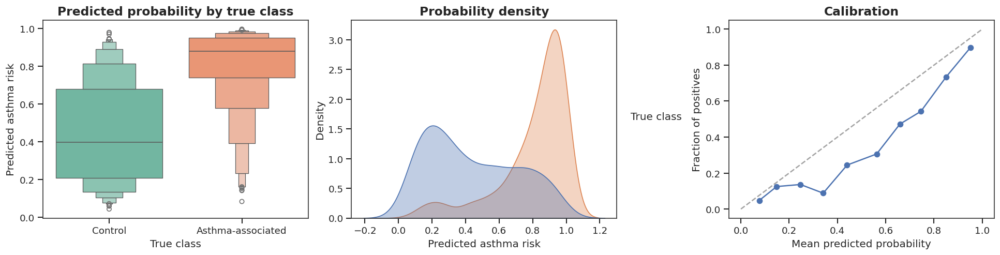

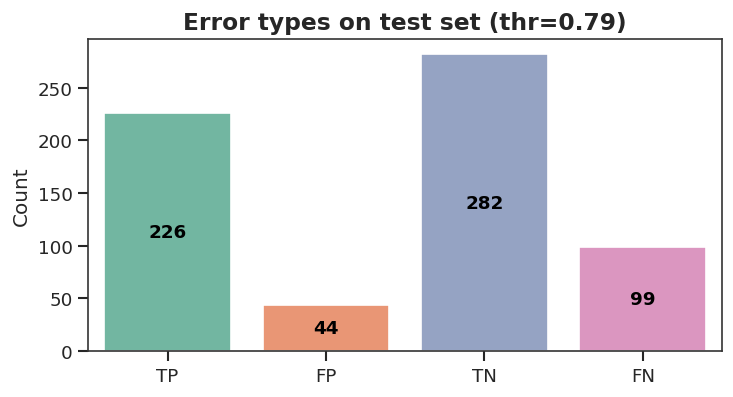

False negatives (lowest predicted risk)


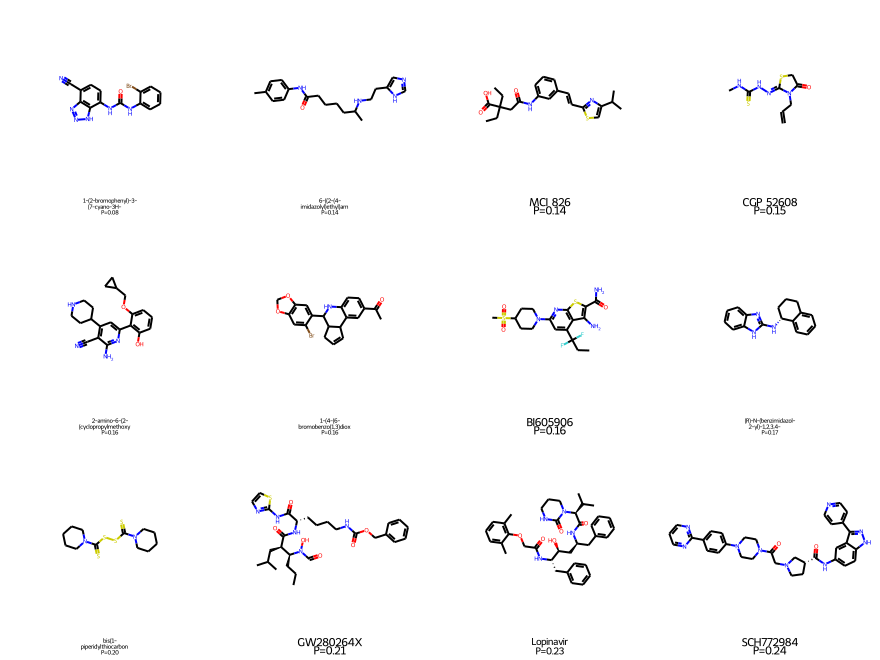

False positives (highest predicted risk)


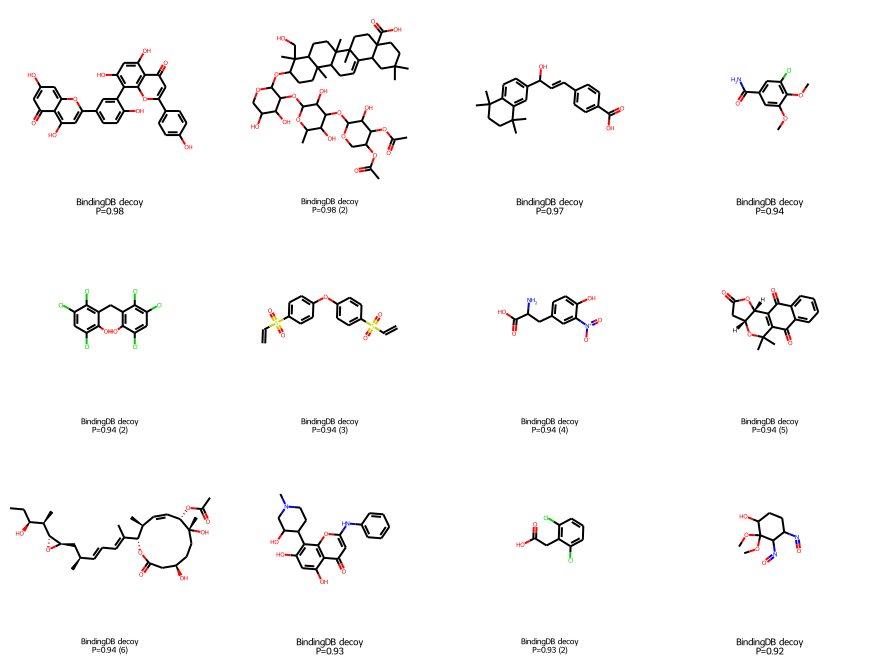

True positives (highest predicted risk)


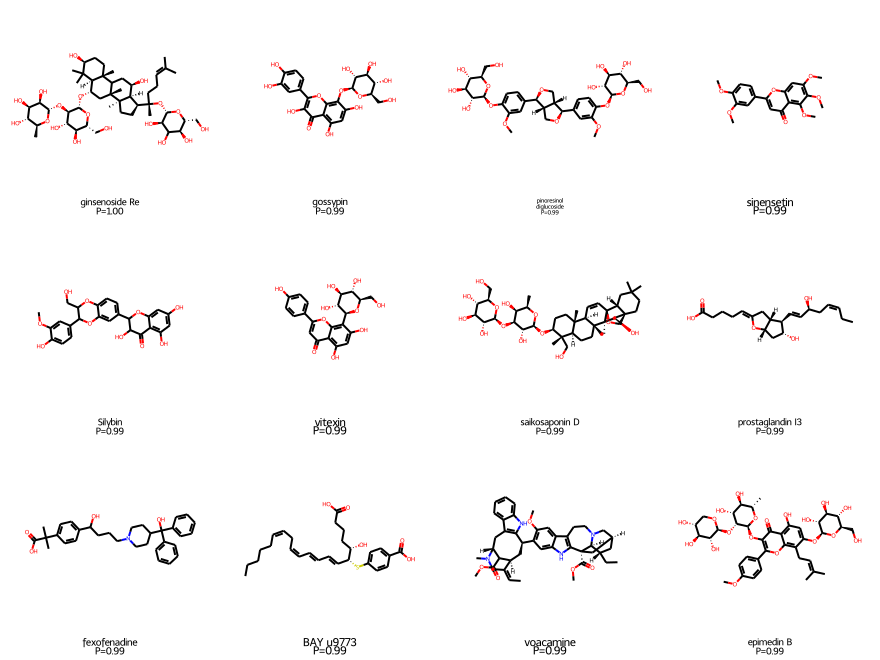

True negatives (lowest predicted risk)


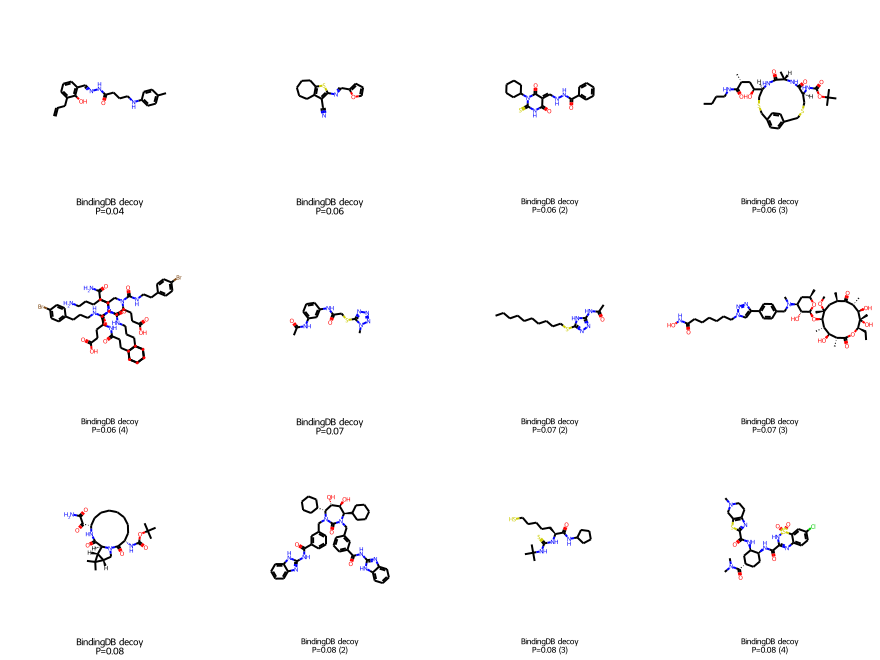

/home/xuchengjie/miniconda3/envs/AM_MOF/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


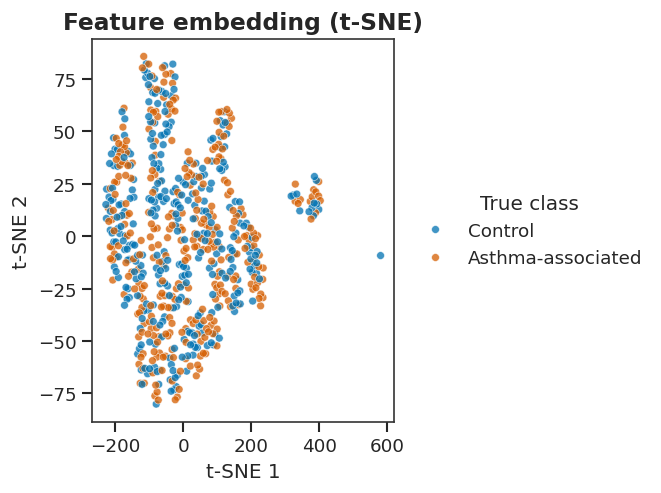

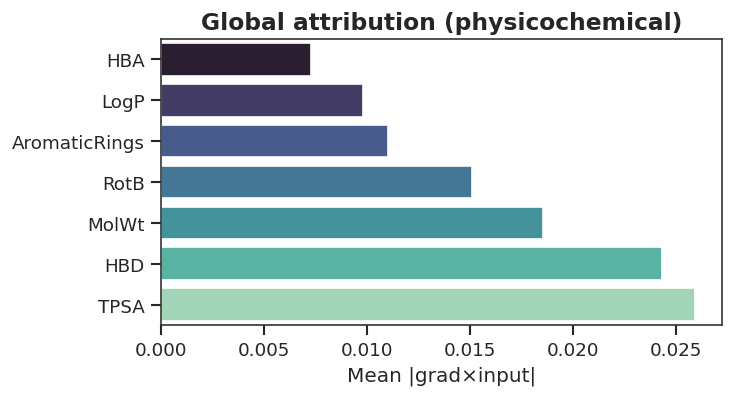

/tmp/ipykernel_412593/923057534.py:279: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


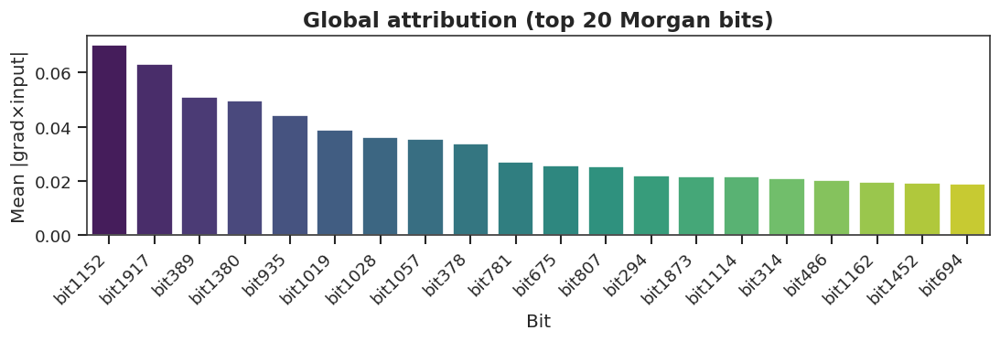

In [22]:
# Diagnostics + interpretability (AsthmaNet)
if ('asthma_risk_proba' not in globals()) and ('y_proba_mlp' not in globals()):
    print('Run the AsthmaNet training cell first.')
else:
    y_true = np.asarray(globals().get('y_test_eval', y_test), dtype=int)
    proba = np.asarray(globals().get('asthma_risk_proba', globals().get('y_proba_mlp')), dtype=float)

    std = globals().get('asthma_uncertainty_std', globals().get('y_std_mlp', None))
    if std is not None:
        std = np.asarray(std, dtype=float)

    df = pd.DataFrame({'prob': proba, 'label': y_true})
    df['label_name'] = df['label'].map({0: 'Control', 1: 'Asthma-associated'})
    if std is not None:
        df['uncertainty'] = std

    fig, axes = plt.subplots(1, 3, figsize=(16, 4), constrained_layout=True)

    sns.boxenplot(
        data=df,
        x='label_name',
        y='prob',
        hue='label_name',
        dodge=False,
        palette='Set2',
        legend=False,
        ax=axes[0],
    )
    axes[0].set_title('Predicted probability by true class')
    axes[0].set_xlabel('True class')
    axes[0].set_ylabel('Predicted asthma risk')
    clean_ax(axes[0])

    sns.kdeplot(
        data=df,
        x='prob',
        hue='label_name',
        fill=True,
        common_norm=False,
        alpha=0.35,
        ax=axes[1],
    )
    axes[1].set_title('Probability density')
    axes[1].set_xlabel('Predicted asthma risk')
    axes[1].set_ylabel('Density')
    legend_outside(axes[1], title='True class', loc='center left', bbox_to_anchor=(1.02, 0.5))
    clean_ax(axes[1])

    from sklearn.calibration import calibration_curve

    frac_pos, mean_pred = calibration_curve(df['label'].values, df['prob'].values, n_bins=10)
    axes[2].plot(mean_pred, frac_pos, marker='o', color='C0')
    axes[2].plot([0, 1], [0, 1], 'k--', alpha=0.4)
    axes[2].set_title('Calibration')
    axes[2].set_xlabel('Mean predicted probability')
    axes[2].set_ylabel('Fraction of positives')
    clean_ax(axes[2])

    save_fig('asthma_diagnostics_panel', fig)
    plt.show()

    # Error analysis + structure panels (test)
    thr = float(globals().get('asthma_threshold', 0.6))
    if 'idx_test' in globals() and 'smiles_used' in globals():
        from IPython.display import display
        from rdkit.Chem import Draw

        smiles_t = np.asarray(smiles_used, dtype=object)[idx_test]
        if 'names_used' in globals():
            names_t = np.asarray(names_used, dtype=object)[idx_test]
        else:
            names_t = np.array(['Unknown'] * len(smiles_t), dtype=object)

        err_df = pd.DataFrame({'compound_name': names_t, 'SMILES': smiles_t, 'prob': proba, 'label': y_true})
        err_df['true_class'] = err_df['label'].map({0: 'Control', 1: 'Asthma-associated'})
        err_df['pred_class'] = np.where(err_df['prob'] >= thr, 'Asthma-associated', 'Control')
        err_df['error_type'] = np.select(
            [
                (err_df['true_class'] == 'Asthma-associated') & (err_df['pred_class'] == 'Asthma-associated'),
                (err_df['true_class'] == 'Control') & (err_df['pred_class'] == 'Control'),
                (err_df['true_class'] == 'Control') & (err_df['pred_class'] == 'Asthma-associated'),
                (err_df['true_class'] == 'Asthma-associated') & (err_df['pred_class'] == 'Control'),
            ],
            ['TP', 'TN', 'FP', 'FN'],
            default='?'
        )

        # Error counts
        order = ['TP', 'FP', 'TN', 'FN']
        ec = err_df['error_type'].value_counts().reindex(order).fillna(0).astype(int)
        fig, ax = plt.subplots(figsize=(6.0, 3.2), constrained_layout=True)
        sns.barplot(x=ec.index, y=ec.values, hue=ec.index, palette='Set2', legend=False, ax=ax)
        ax.set_title(f'Error types on test set (thr={thr:.2f})')
        ax.set_xlabel('')
        ax.set_ylabel('Count')
        annotate_bars_center(ax)
        clean_ax(ax)
        save_fig('asthma_error_type_counts_test', fig)
        plt.show()

        # Structure panels
        n_panel = int(os.environ.get('AM_ASTHMA_ERROR_PANEL_N', '12'))

        def _grid(sub: pd.DataFrame, title: str, fname: str):
            if sub.empty:
                return
            mols = [Chem.MolFromSmiles(s) for s in sub['SMILES'].astype(str).tolist()]
            legends = [
                f"{wrap_legend(n, width=20, max_lines=2)}\nP={float(p):.2f}"
                for n, p in zip(sub['compound_name'].astype(str).tolist(), sub['prob'].astype(float).tolist())
            ]
            legends = make_unique_labels(legends)
            img = Draw.MolsToGridImage(mols, legends=legends, molsPerRow=4, subImgSize=(220, 220), useSVG=False)
            print(title)
            display(img)
            save_rdkit_image(img, FIG_DIR / f'{fname}.png')

        fn_df = err_df[err_df['error_type'] == 'FN'].sort_values('prob', ascending=True).head(n_panel)
        fp_df = err_df[err_df['error_type'] == 'FP'].sort_values('prob', ascending=False).head(n_panel)
        tp_df = err_df[err_df['error_type'] == 'TP'].sort_values('prob', ascending=False).head(n_panel)
        tn_df = err_df[err_df['error_type'] == 'TN'].sort_values('prob', ascending=True).head(n_panel)

        _grid(fn_df, 'False negatives (lowest predicted risk)', 'asthma_false_negatives')
        _grid(fp_df, 'False positives (highest predicted risk)', 'asthma_false_positives')
        _grid(tp_df, 'True positives (highest predicted risk)', 'asthma_true_positives')
        _grid(tn_df, 'True negatives (lowest predicted risk)', 'asthma_true_negatives')

    # t-SNE embedding of feature space (FP+phys)
    try:
        from sklearn.manifold import TSNE

        n_show = int(min(1000, len(y_true)))
        rng = np.random.default_rng(RANDOM_STATE)
        pick = rng.choice(len(idx_test), size=n_show, replace=False) if len(idx_test) > n_show else np.arange(len(idx_test))

        X_show = X[idx_test][pick]
        y_show = y_true[pick]
        df_emb = pd.DataFrame({'label': y_show})
        df_emb['label_name'] = df_emb['label'].map({0: 'Control', 1: 'Asthma-associated'})

        emb = TSNE(n_components=2, perplexity=30, learning_rate='auto', init='pca', random_state=RANDOM_STATE).fit_transform(X_show)
        df_emb['TSNE1'] = emb[:, 0]
        df_emb['TSNE2'] = emb[:, 1]

        fig, ax = plt.subplots(figsize=(5.4, 4.0), constrained_layout=True)
        sns.scatterplot(
            data=df_emb,
            x='TSNE1',
            y='TSNE2',
            hue='label_name',
            palette={'Asthma-associated': '#D55E00', 'Control': '#0072B2'},
            alpha=0.75,
            s=22,
            ax=ax,
        )
        ax.set_title('Feature embedding (t-SNE)')
        ax.set_xlabel('t-SNE 1')
        ax.set_ylabel('t-SNE 2')
        legend_outside(ax, title='True class', loc='center left', bbox_to_anchor=(1.02, 0.5))
        clean_ax(ax)
        save_fig('asthma_feature_tsne', fig)
        plt.show()
    except Exception as e:
        print(f't-SNE embedding skipped: {e}')

    # Gradient×input attribution on FP/physchem (best model)
    model_path = cfg.models_dir / 'asthma_risk_asthmanet.pt'
    if model_path.exists():
        artifact = torch.load(model_path, map_location='cpu')

        # Rebuild model (must match training architecture)
        cfg_m = artifact.get('config', {})
        stoi = artifact['vocab']['stoi']
        max_len = int(artifact['vocab']['max_len'])
        mean = np.asarray(artifact['scaler']['mean'], dtype=float)
        scale = np.asarray(artifact['scaler']['scale'], dtype=float)
        scale = np.where(scale == 0, 1.0, scale)

        fp_dim = int(artifact['fp_dim'])
        phys_dim = int(artifact['phys_dim'])

        token_pat = re.compile(
            r"(\[[^\]]+\]|Br|Cl|Si|Se|Na|Ca|Li|Mg|Al|Zn|Fe|Cu|Mn|Hg|Sn|Pb|Bi|Ag|Au|\%\d{2}|\d|\(|\)|\.|=|#|-|\+|\\|\/|:|~|@|\?|>|\*|\$|[A-Za-z])"
        )

        def _encode(smi: str):
            toks = token_pat.findall(str(smi).strip())
            ids = [stoi.get(t, 1) for t in toks][:max_len]
            if len(ids) < max_len:
                ids = ids + [0] * (max_len - len(ids))
            return np.asarray(ids, dtype=np.int64)

        class _SmilesCNN(nn.Module):
            def __init__(self, vocab_size, embed_dim=128, channels=256, kernels=(3,5,7,9), dropout=0.2):
                super().__init__()
                self.embed = nn.Embedding(int(vocab_size), int(embed_dim), padding_idx=0)
                self.convs = nn.ModuleList([nn.Conv1d(int(embed_dim), int(channels), int(k), padding=int(k)//2) for k in kernels])
                self.dropout = nn.Dropout(float(dropout))
                self.out_dim = int(channels) * int(len(kernels))

            def forward(self, ids):
                x = self.embed(ids)
                x = self.dropout(x)
                x = x.transpose(1, 2)
                outs = []
                for conv in self.convs:
                    o = torch.relu(conv(x))
                    o = torch.max(o, dim=2).values
                    outs.append(o)
                return torch.cat(outs, dim=1)

        class _AsthmaNet(nn.Module):
            def __init__(self, vocab_size, fp_dim, phys_dim):
                super().__init__()
                self.smi = _SmilesCNN(
                    vocab_size,
                    embed_dim=int(cfg_m.get('SMI_EMBED', 128)),
                    channels=int(cfg_m.get('SMI_CHANNELS', 256)),
                    dropout=float(cfg_m.get('SMI_DROPOUT', 0.2)),
                )
                fp_h = int(cfg_m.get('FP_HIDDEN', 512))
                ph_h = int(cfg_m.get('PHYS_HIDDEN', 96))
                tr_h = int(cfg_m.get('TRUNK_HIDDEN', 256))
                drop = float(cfg_m.get('DROPOUT', 0.25))

                self.fp_mlp = nn.Sequential(nn.Linear(int(fp_dim), fp_h), nn.ReLU(), nn.Dropout(drop))
                self.phys_mlp = nn.Sequential(nn.Linear(int(phys_dim), ph_h), nn.ReLU(), nn.Dropout(drop))
                self.trunk = nn.Sequential(nn.Linear(int(self.smi.out_dim) + fp_h + ph_h, tr_h), nn.ReLU(), nn.Dropout(drop), nn.Linear(tr_h, 1))

            def forward(self, ids, fp, phys):
                z = torch.cat([self.smi(ids), self.fp_mlp(fp), self.phys_mlp(phys)], dim=1)
                return self.trunk(z).squeeze(-1)

        device_attr = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        model = _AsthmaNet(len(stoi), fp_dim=fp_dim, phys_dim=phys_dim).to(device_attr)
        model.load_state_dict(artifact['state_dict'])
        model.eval()

        n_attr = int(min(512, len(idx_test)))
        pick = np.random.default_rng(RANDOM_STATE).choice(idx_test, size=n_attr, replace=False) if len(idx_test) > n_attr else idx_test

        S = np.vstack([_encode(smiles_used[i]) for i in pick]).astype(np.int64)
        Xfp = X_fp[pick].astype(np.float32)
        Xph = X_phys[pick].astype(np.float32)
        Xph = ((Xph - mean) / scale).astype(np.float32)

        s_in = torch.tensor(S, dtype=torch.long, device=device_attr)
        fp_in = torch.tensor(Xfp, dtype=torch.float32, device=device_attr, requires_grad=True)
        ph_in = torch.tensor(Xph, dtype=torch.float32, device=device_attr, requires_grad=True)

        logits = model(s_in, fp_in, ph_in)
        logits.sum().backward()

        fp_attr = np.mean(np.abs((fp_in.grad.detach().cpu().numpy()) * Xfp), axis=0)
        ph_attr = np.mean(np.abs((ph_in.grad.detach().cpu().numpy()) * Xph), axis=0)

        phys_names = ['MolWt', 'LogP', 'TPSA', 'HBD', 'HBA', 'RotB', 'AromaticRings'][:phys_dim]
        phys_df = pd.DataFrame({'feature': phys_names, 'importance': ph_attr}).sort_values('importance', ascending=True)

        fig, ax = plt.subplots(figsize=(6.0, 3.2), constrained_layout=True)
        sns.barplot(data=phys_df, x='importance', y='feature', hue='feature', palette='mako', legend=False, ax=ax)
        ax.set_title('Global attribution (physicochemical)')
        ax.set_xlabel('Mean |grad×input|')
        ax.set_ylabel('')
        clean_ax(ax)
        save_fig('asthma_attr_physchem_global', fig)
        plt.show()

        topk = int(min(20, len(fp_attr)))
        top_bits = np.argsort(fp_attr)[::-1][:topk]
        bit_df = pd.DataFrame({'bit': [f'bit{int(b)}' for b in top_bits], 'importance': fp_attr[top_bits]})

        fig_w = max(7.0, 0.35 * topk + 2.0)
        fig, ax = plt.subplots(figsize=(fig_w, 3.0), constrained_layout=True)
        sns.barplot(data=bit_df, x='bit', y='importance', hue='bit', palette='viridis', legend=False, ax=ax)
        ax.set_title(f'Global attribution (top {topk} Morgan bits)')
        ax.set_xlabel('Bit')
        ax.set_ylabel('Mean |grad×input|')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        clean_ax(ax)
        save_fig('asthma_attr_morgan_bits_top', fig)
        plt.show()


## Artifacts

Persist trained models and intermediate tables for downstream screening.


In [23]:
# Persist intermediate tables

if 'ctd_pubchem_df' in globals():
    out = cfg.interim_dir / 'ctd_pubchem_mapping.csv'
    ctd_pubchem_df.to_csv(out, index=False)
    print(f'Saved: {out}')

    slim_cols = [cfg.ctd_chem_name_col, cfg.ctd_cas_col, 'pubchem_smiles', 'Inference Score']
    slim_cols = [c for c in slim_cols if c in ctd_pubchem_df.columns]
    slim_out = cfg.results_dir / 'ctd_pubchem_smiles_inference_score.csv'
    ctd_pubchem_df[slim_cols].to_csv(slim_out, index=False)
    print(f'Saved: {slim_out}')

if 'pos_df' in globals():
    out = cfg.interim_dir / 'ctd_positives_pubchem_smiles.csv'
    pos_df.to_csv(out, index=False)
    print(f'Saved: {out}')

if 'asthma_dataset' in globals():
    out = cfg.interim_dir / 'asthma_training_dataset_ctd_bindingdb_decoys.csv'
    asthma_dataset.to_csv(out, index=False)
    print(f'Saved: {out}')

isoc_save_path = cfg.results_dir / 'isocyanates_clustered.csv'
if 'isoc_clustered' in globals():
    isoc_clustered.to_csv(isoc_save_path, index=False)
    print(f'Saved: {isoc_save_path}')


Saved: interim/ctd_pubchem_mapping.csv
Saved: results/ctd_pubchem_smiles_inference_score.csv
Saved: interim/ctd_positives_pubchem_smiles.csv
Saved: interim/asthma_training_dataset_ctd_bindingdb_decoys.csv
Saved: results/isocyanates_clustered.csv


## Scope notes

The current pipeline is designed for screening and prioritization.


## Candidate scoring: asthma risk

Score the candidate set (`Isocyanates.csv`) with the trained asthma-risk model and persist risk probabilities/labels.


Saved asthma risk predictions: results/isocyanates_asthma_risk.csv


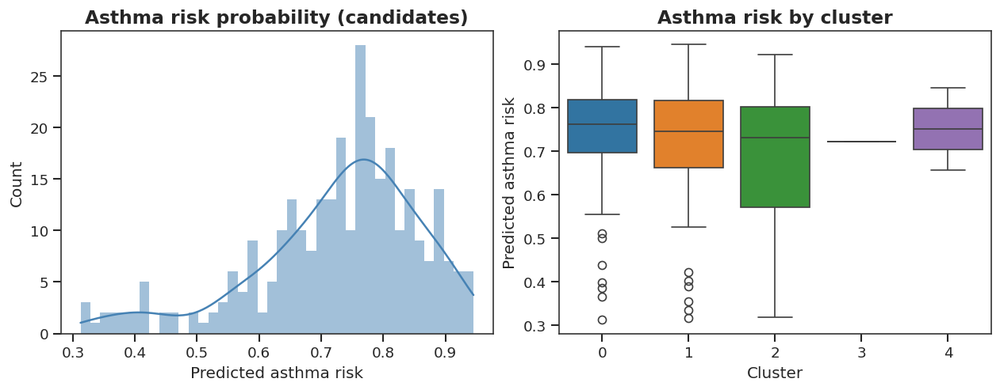

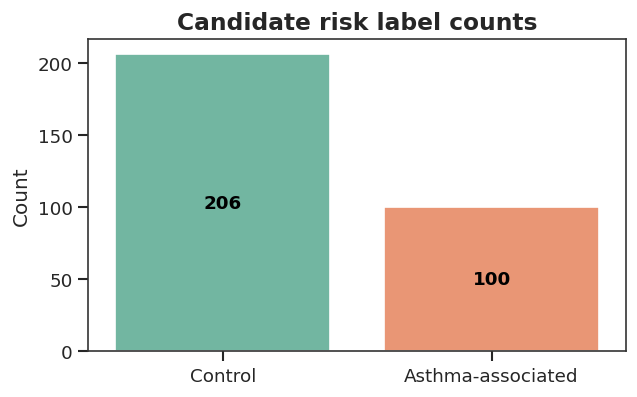

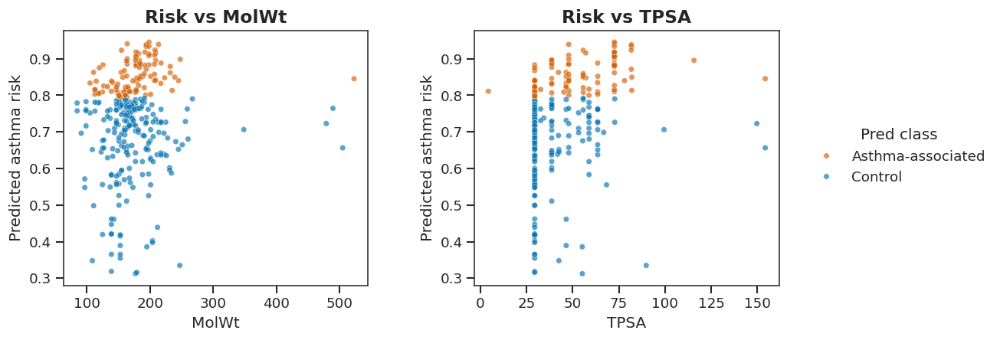

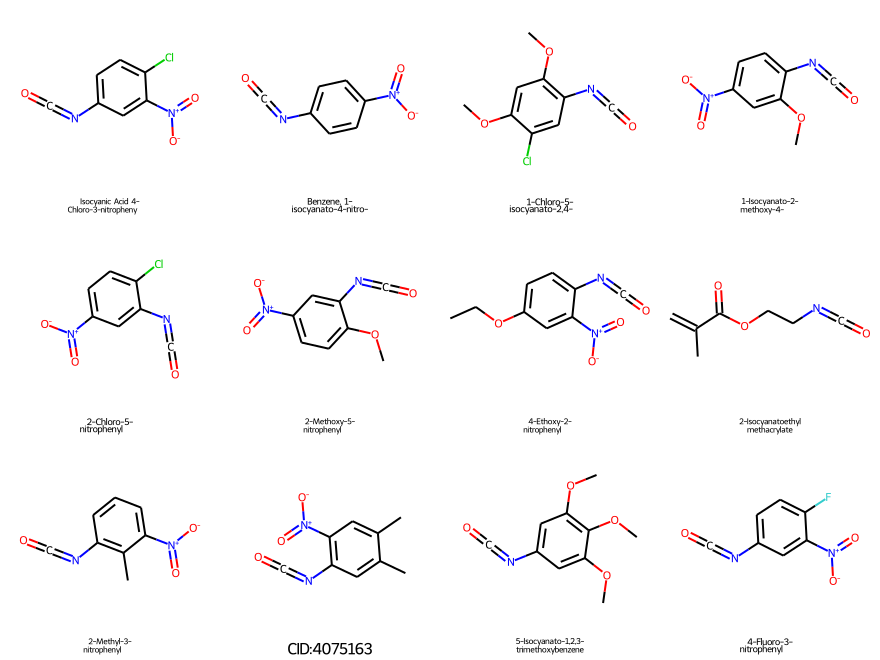

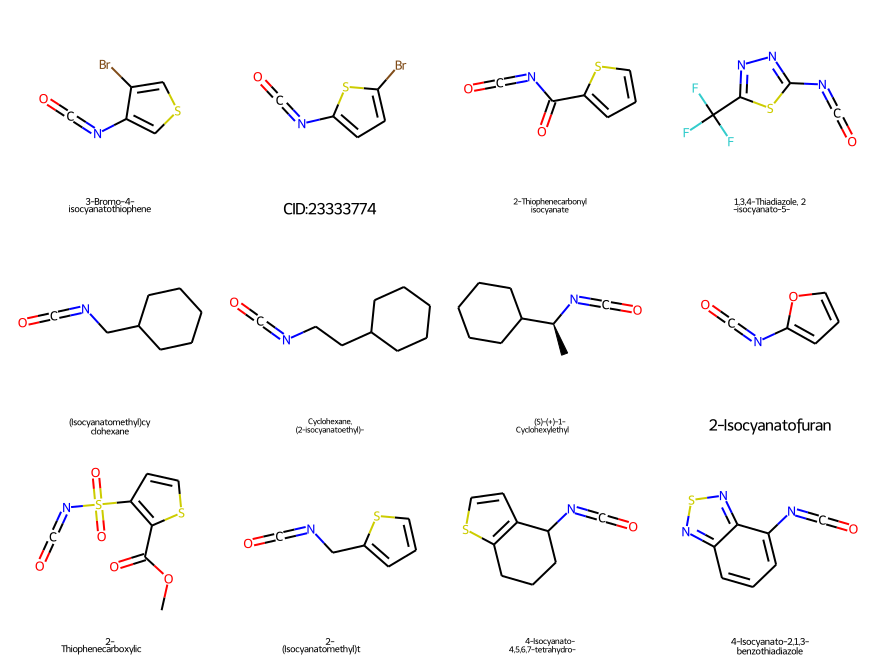

In [24]:
# Candidate scoring: AsthmaNet
if 'isoc_clustered' not in globals():
    raise RuntimeError('Run candidate descriptor + clustering cells first.')

model_path = cfg.models_dir / 'asthma_risk_asthmanet.pt'
if not model_path.exists():
    raise RuntimeError('Train AsthmaNet first (missing models/asthma_risk_asthmanet.pt).')

artifact = torch.load(model_path, map_location='cpu')

DEVICE_PREF = os.environ.get('AM_ASTHMA_DEVICE', 'auto').strip().lower()
DEVICE = torch.device('cuda' if (DEVICE_PREF in {'auto','cuda','gpu'} and torch.cuda.is_available()) else 'cpu')

stoi = artifact['vocab']['stoi']
max_len = int(artifact['vocab']['max_len'])
mean = np.asarray(artifact['scaler']['mean'], dtype=float)
scale = np.asarray(artifact['scaler']['scale'], dtype=float)
scale = np.where(scale == 0, 1.0, scale)

fp_dim = int(artifact['fp_dim'])
phys_dim = int(artifact['phys_dim'])
cfg_m = artifact.get('config', {})

thr = float(artifact.get('threshold', 0.5))

# Tokenizer
TOKEN_PAT = re.compile(
    r"(\[[^\]]+\]|Br|Cl|Si|Se|Na|Ca|Li|Mg|Al|Zn|Fe|Cu|Mn|Hg|Sn|Pb|Bi|Ag|Au|\%\d{2}|\d|\(|\)|\.|=|#|-|\+|\\|\/|:|~|@|\?|>|\*|\$|[A-Za-z])"
)

def encode_smiles(smi: str):
    toks = TOKEN_PAT.findall(str(smi).strip())
    ids = [stoi.get(t, 1) for t in toks][:max_len]
    if len(ids) < max_len:
        ids = ids + [0] * (max_len - len(ids))
    return np.asarray(ids, dtype=np.int64)

# Model (must match training)
class SmilesCNN(nn.Module):
    def __init__(self, vocab_size, embed_dim=128, channels=256, kernels=(3,5,7,9), dropout=0.2):
        super().__init__()
        self.embed = nn.Embedding(int(vocab_size), int(embed_dim), padding_idx=0)
        self.convs = nn.ModuleList([nn.Conv1d(int(embed_dim), int(channels), int(k), padding=int(k)//2) for k in kernels])
        self.dropout = nn.Dropout(float(dropout))
        self.out_dim = int(channels) * int(len(kernels))

    def forward(self, ids):
        x = self.embed(ids)
        x = self.dropout(x)
        x = x.transpose(1, 2)
        outs = []
        for conv in self.convs:
            o = torch.relu(conv(x))
            o = torch.max(o, dim=2).values
            outs.append(o)
        return torch.cat(outs, dim=1)

class AsthmaNet(nn.Module):
    def __init__(self, vocab_size, fp_dim, phys_dim):
        super().__init__()
        self.smi = SmilesCNN(
            vocab_size,
            embed_dim=int(cfg_m.get('SMI_EMBED', 128)),
            channels=int(cfg_m.get('SMI_CHANNELS', 256)),
            dropout=float(cfg_m.get('SMI_DROPOUT', 0.2)),
        )
        fp_h = int(cfg_m.get('FP_HIDDEN', 512))
        ph_h = int(cfg_m.get('PHYS_HIDDEN', 96))
        tr_h = int(cfg_m.get('TRUNK_HIDDEN', 256))
        drop = float(cfg_m.get('DROPOUT', 0.25))

        self.fp_mlp = nn.Sequential(nn.Linear(int(fp_dim), fp_h), nn.ReLU(), nn.Dropout(drop))
        self.phys_mlp = nn.Sequential(nn.Linear(int(phys_dim), ph_h), nn.ReLU(), nn.Dropout(drop))
        self.trunk = nn.Sequential(nn.Linear(int(self.smi.out_dim) + fp_h + ph_h, tr_h), nn.ReLU(), nn.Dropout(drop), nn.Linear(tr_h, 1))

    def forward(self, ids, fp, phys):
        z = torch.cat([self.smi(ids), self.fp_mlp(fp), self.phys_mlp(phys)], dim=1)
        return self.trunk(z).squeeze(-1)

model = AsthmaNet(vocab_size=len(stoi), fp_dim=fp_dim, phys_dim=phys_dim).to(DEVICE)
model.load_state_dict(artifact['state_dict'])
model.eval()

# Candidate featurization (keep 1:1 with input table; no SMILES in figures)
assert 'SMILES' in isoc_clustered.columns, 'Isocyanates table must contain SMILES'

cand_smiles = isoc_clustered['SMILES'].astype(str).tolist()
cand_names = isoc_clustered['compound_name'].astype(str).tolist() if 'compound_name' in isoc_clustered.columns else ['Unknown'] * len(cand_smiles)

fp_list, phys_list, s_list, name_list = [], [], [], []
for smi, nm in zip(cand_smiles, cand_names):
    fp, ph = smiles_to_features(smi, cfg)
    if fp is None:
        continue
    fp_list.append(fp.astype(np.float32))
    phys_list.append(ph.astype(np.float32))
    s_list.append(str(smi))
    name_list.append(str(nm))

if not fp_list:
    raise ValueError('No valid candidate SMILES for asthma scoring')

X_fp_cand = np.vstack(fp_list).astype(np.float32)
X_phys_cand = np.vstack(phys_list).astype(np.float32)
X_phys_cand = ((X_phys_cand - mean) / scale).astype(np.float32)

S_cand = np.vstack([encode_smiles(s) for s in s_list]).astype(np.int64)

# Predict in batches
bs = int(os.environ.get('AM_ASTHMA_SCORE_BATCH', '256'))
proba = []
with torch.no_grad():
    for i in range(0, len(s_list), bs):
        s = torch.tensor(S_cand[i:i+bs], dtype=torch.long, device=DEVICE)
        fp = torch.tensor(X_fp_cand[i:i+bs], dtype=torch.float32, device=DEVICE)
        ph = torch.tensor(X_phys_cand[i:i+bs], dtype=torch.float32, device=DEVICE)
        logits = model(s, fp, ph)
        proba.append(torch.sigmoid(logits).detach().cpu().numpy())
proba = np.concatenate(proba, axis=0).astype(float)

risk_df = pd.DataFrame({'SMILES': np.array(s_list, dtype=object), 'compound_name': np.array(name_list, dtype=object), 'asthma_risk_proba': proba})

# Merge back (SMILES-level mean for duplicates)
risk_sm = risk_df.groupby('SMILES', as_index=False).agg({'asthma_risk_proba': 'mean'})
risk_sm['asthma_risk_label'] = np.where(risk_sm['asthma_risk_proba'] >= thr, 'Asthma-associated', 'Control')

isoc_clustered = isoc_clustered.drop(columns=['asthma_risk_proba', 'asthma_risk_label'], errors='ignore')
isoc_clustered = isoc_clustered.merge(risk_sm, on='SMILES', how='left')

out_path = cfg.results_dir / 'isocyanates_asthma_risk.csv'
isoc_clustered.to_csv(out_path, index=False)
print(f'Saved asthma risk predictions: {out_path}')

# Plots
fig, axes = plt.subplots(1, 2, figsize=(10.4, 4.0), constrained_layout=True)

sns.histplot(risk_sm['asthma_risk_proba'].dropna(), bins=40, kde=True, color='steelblue', edgecolor='none', ax=axes[0])
axes[0].set_title('Asthma risk probability (candidates)')
axes[0].set_xlabel('Predicted asthma risk')
axes[0].set_ylabel('Count')
clean_ax(axes[0])

if 'cluster_km' in isoc_clustered.columns:
    sns.boxplot(data=isoc_clustered, x='cluster_km', y='asthma_risk_proba', hue='cluster_km', palette=globals().get('CLUSTER_PALETTE', 'mako'), legend=False, ax=axes[1])
    axes[1].set_title('Asthma risk by cluster')
    axes[1].set_xlabel('Cluster')
    axes[1].set_ylabel('Predicted asthma risk')
    clean_ax(axes[1])
else:
    axes[1].axis('off')

save_fig('isoc_asthma_risk_distribution', fig)
plt.show()

# Candidate label counts
lc = risk_sm['asthma_risk_label'].value_counts().reindex(RISK_LABEL_ORDER).fillna(0).astype(int)
fig, ax = plt.subplots(figsize=(5.2, 3.2), constrained_layout=True)
sns.barplot(x=lc.index, y=lc.values, hue=lc.index, palette=RISK_LABEL_PALETTE, legend=False, ax=ax)
ax.set_title('Candidate risk label counts')
ax.set_xlabel('')
ax.set_ylabel('Count')
annotate_bars_center(ax)
clean_ax(ax)
save_fig('isoc_asthma_risk_label_counts', fig)
plt.show()

# Risk vs key descriptors
desc_cols = [c for c in ['MolWt', 'TPSA', 'LogP'] if c in isoc_clustered.columns]
plot_df = isoc_clustered.copy()
need_cols = ['asthma_risk_proba', 'asthma_risk_label'] + desc_cols
plot_df = plot_df.dropna(subset=[c for c in need_cols if c in plot_df.columns])
if desc_cols and (not plot_df.empty):
    fig, axes = plt.subplots(1, len(desc_cols), figsize=(5.6 * len(desc_cols), 3.6))
    fig.subplots_adjust(right=0.82, wspace=0.35)
    axes = np.atleast_1d(axes)
    handles_labels = None
    palette = {'Control': '#0072B2', 'Asthma-associated': '#D55E00'}
    for ax, col in zip(axes, desc_cols):
        sns.scatterplot(
            data=plot_df,
            x=col,
            y='asthma_risk_proba',
            hue='asthma_risk_label',
            palette=palette,
            alpha=0.65,
            s=20,
            ax=ax,
        )
        ax.set_title(f'Risk vs {col}')
        ax.set_xlabel(col)
        ax.set_ylabel('Predicted asthma risk')
        leg = ax.get_legend()
        if leg is not None:
            handles_labels = ax.get_legend_handles_labels()
            ax.legend_.remove()
        clean_ax(ax)
    if handles_labels is not None:
        handles, labels = handles_labels
        fig.legend(handles=handles, labels=labels, title='Pred class', loc='center left', bbox_to_anchor=(0.84, 0.5), frameon=False)
    save_fig('isoc_asthma_risk_vs_descriptors', fig)
    plt.show()

# Structure panels (top/bottom; no overlaps; name-only legends)
from rdkit.Chem import Draw

risk_view = risk_df.drop_duplicates('SMILES').sort_values('asthma_risk_proba', ascending=False).reset_index(drop=True)

n_panel = int(os.environ.get('AM_ASTHMA_PANEL_N', '12'))

top = risk_view.head(n_panel)
bot = risk_view.tail(n_panel)

# Remove overlaps if dataset is small
bot = bot[~bot['SMILES'].isin(top['SMILES'])]

panels = [
    ('Top asthma-risk candidates', top),
    ('Lowest asthma-risk candidates', bot),
]

for title, sub in panels:
    if sub.empty:
        continue
    mols = [Chem.MolFromSmiles(s) for s in sub['SMILES']]
    legends = make_unique_labels(sub['compound_name'].fillna('Unknown').astype(str).tolist())
    legends = [wrap_legend(x, width=20, max_lines=2) for x in legends]

    img = Draw.MolsToGridImage(mols, legends=legends, molsPerRow=4, subImgSize=(220, 220), useSVG=False)
    display(img)

    safe = ''.join([c if c.isalnum() else '_' for c in title.lower()])
    save_rdkit_image(img, FIG_DIR / f'isoc_asthma_{safe}.png')


## Cell-line accessibility (ChEMBL) — BEAS-2B / EOL-1 / HASMC

Goal: after asthma-risk scoring, predict whether a compound is likely to show activity in three cell lines, then run target-affinity (DTI) only on the filtered subset.

Inputs (ChEMBL exports): `BEAS-2B.csv`, `EOL-1.csv`, `HASMC.csv`.
- These lists are positives (known active compounds).
- Negatives are generated as physicochem-matched decoy controls sampled from the available background pool.


BEAS-2B: 545 unique canonical SMILES
EOL-1: 273 unique canonical SMILES
HASMC: 61 unique canonical SMILES


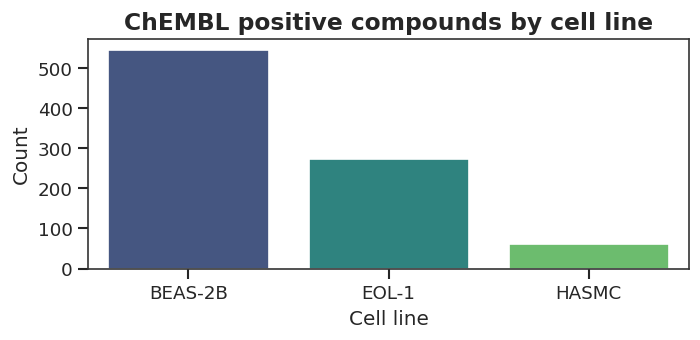

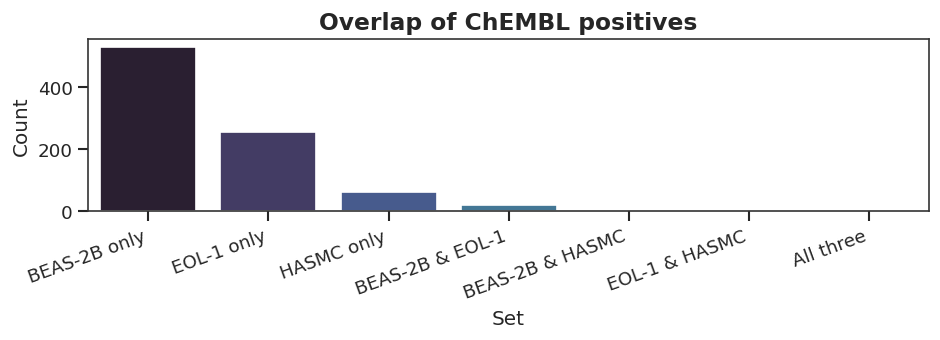

In [25]:
from pathlib import Path

cell_files = {
    'BEAS-2B': resolve_input_path('BEAS-2B.csv', env_key='AM_BEAS2B_CSV'),
    'EOL-1': resolve_input_path('EOL-1.csv', env_key='AM_EOL1_CSV'),
    'HASMC': resolve_input_path('HASMC.csv', env_key='AM_HASMC_CSV'),
}

def load_chembl_semicolon_export(path: Path) -> pd.DataFrame:
    """Robust loader for ChEMBL exports:
    "Col1";"Col2";...;"Smiles";...

    Some rows contain unescaped quotes in later columns.
    We split strictly on the token '";"' and pad/truncate to header length.
    """
    with path.open('r', encoding='utf-8', errors='replace') as f:
        header_line = f.readline().strip()
        if header_line.startswith('"') and header_line.endswith('"'):
            header_line = header_line[1:-1]
        header = header_line.split('";"')

        rows = []
        for line in f:
            s = line.strip()
            if not s:
                continue
            if s.startswith('"') and s.endswith('"'):
                s = s[1:-1]
            else:
                s = s.strip('"')
            parts = s.split('";"')
            if len(parts) < len(header):
                parts += [''] * (len(header) - len(parts))
            elif len(parts) > len(header):
                parts = parts[:len(header)]
            rows.append(parts)

    return pd.DataFrame(rows, columns=header)


def canonicalize_smiles(smi: str) -> str | None:
    smi = str(smi).strip()
    if not smi or smi.lower() == 'nan':
        return None
    mol = Chem.MolFromSmiles(smi)
    if mol is None:
        return None
    return Chem.MolToSmiles(mol, isomericSmiles=True)


cell_pos = {}
cell_pos_df = {}
for cell, path in cell_files.items():
    if not path.exists():
        print(f'Missing file: {path} (skip {cell})')
        continue

    df = load_chembl_semicolon_export(path)
    smiles_col = next((c for c in df.columns if c.lower() == 'smiles'), None)
    if smiles_col is None:
        print(f'No Smiles column found in {path} (skip)')
        continue

    df = df.rename(columns={smiles_col: 'Smiles'})
    df['smiles_canon'] = [canonicalize_smiles(s) for s in df['Smiles']]
    df = df.dropna(subset=['smiles_canon']).drop_duplicates(subset=['smiles_canon'])

    cell_pos[cell] = set(df['smiles_canon'].tolist())
    cell_pos_df[cell] = df
    print(f'{cell}: {len(df)} unique canonical SMILES')

# Summary plots
if cell_pos:
    counts = pd.Series({k: len(v) for k, v in cell_pos.items()}).sort_values(ascending=False)
    plt.figure(figsize=(6, 3))
    ax = sns.barplot(x=counts.index, y=counts.values, hue=counts.index, palette='viridis', legend=False)
    ax.set_title('ChEMBL positive compounds by cell line')
    ax.set_xlabel('Cell line')
    ax.set_ylabel('Count')
    plt.tight_layout(); plt.show()

    # Overlap (only if all three exist)
    cells = list(cell_pos.keys())
    if len(cells) == 3:
        a, b, c = cells
        sets = [cell_pos[a], cell_pos[b], cell_pos[c]]

        only_a = sets[0] - sets[1] - sets[2]
        only_b = sets[1] - sets[0] - sets[2]
        only_c = sets[2] - sets[0] - sets[1]
        ab = (sets[0] & sets[1]) - sets[2]
        ac = (sets[0] & sets[2]) - sets[1]
        bc = (sets[1] & sets[2]) - sets[0]
        abc = sets[0] & sets[1] & sets[2]

        inter = pd.Series({
            f'{a} only': len(only_a),
            f'{b} only': len(only_b),
            f'{c} only': len(only_c),
            f'{a} & {b}': len(ab),
            f'{a} & {c}': len(ac),
            f'{b} & {c}': len(bc),
            'All three': len(abc),
        }).sort_values(ascending=False)

        plt.figure(figsize=(8, 3))
        ax = sns.barplot(x=inter.index, y=inter.values, hue=inter.index, palette='mako', legend=False)
        ax.set_title('Overlap of ChEMBL positives')
        ax.set_xlabel('Set')
        ax.set_ylabel('Count')
        plt.xticks(rotation=20, ha='right')
        plt.tight_layout(); plt.show()
else:
    print('No cell-line files loaded; skip this section.')


BEAS-2B: dataset size 982 (pos=491, neg=491)
Saved decoy pairs: results/decoy_pairs_cell_beas2b.csv


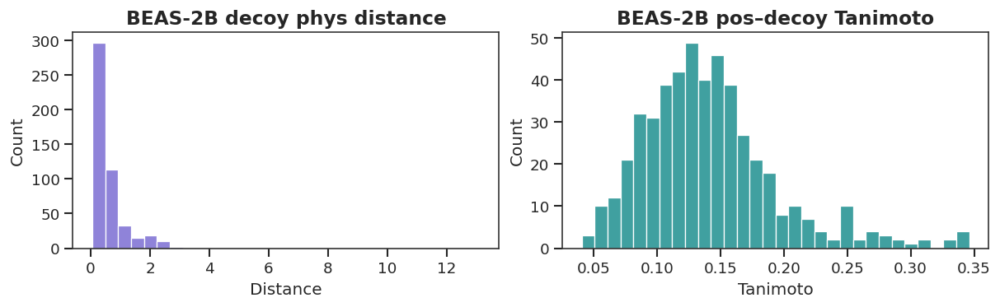

BEAS-2B epoch 1/60 loss 0.6822 val_PR 0.826 val_ROC 0.783
BEAS-2B epoch 2/60 loss 0.6357 val_PR 0.898 val_ROC 0.877
BEAS-2B epoch 3/60 loss 0.5240 val_PR 0.920 val_ROC 0.891
BEAS-2B epoch 4/60 loss 0.3487 val_PR 0.923 val_ROC 0.900
BEAS-2B epoch 5/60 loss 0.2009 val_PR 0.924 val_ROC 0.901
BEAS-2B epoch 6/60 loss 0.1430 val_PR 0.929 val_ROC 0.904
BEAS-2B epoch 7/60 loss 0.0753 val_PR 0.934 val_ROC 0.907
BEAS-2B epoch 8/60 loss 0.0653 val_PR 0.936 val_ROC 0.909
BEAS-2B epoch 9/60 loss 0.0588 val_PR 0.941 val_ROC 0.922
BEAS-2B epoch 10/60 loss 0.0309 val_PR 0.943 val_ROC 0.926
BEAS-2B epoch 11/60 loss 0.0225 val_PR 0.944 val_ROC 0.924
BEAS-2B epoch 12/60 loss 0.0180 val_PR 0.947 val_ROC 0.926
BEAS-2B epoch 13/60 loss 0.0141 val_PR 0.949 val_ROC 0.928
BEAS-2B epoch 14/60 loss 0.0120 val_PR 0.948 val_ROC 0.930
BEAS-2B epoch 15/60 loss 0.0172 val_PR 0.949 val_ROC 0.932
BEAS-2B epoch 16/60 loss 0.0075 val_PR 0.949 val_ROC 0.932
BEAS-2B epoch 17/60 loss 0.0116 val_PR 0.948 val_ROC 0.931
BEAS-2

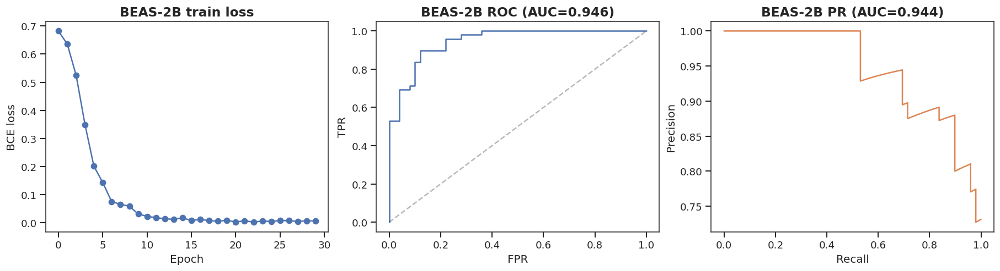

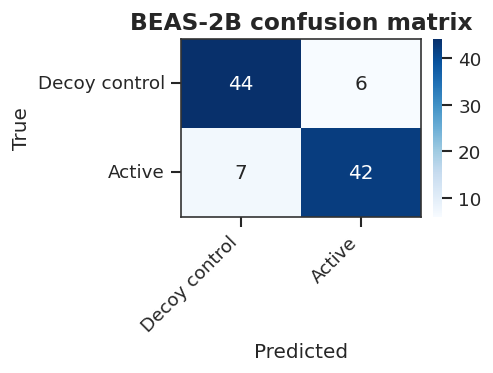

Saved model: models/cell_access_beas2b_mlp.pt
EOL-1: dataset size 540 (pos=270, neg=270)
Saved decoy pairs: results/decoy_pairs_cell_eol1.csv


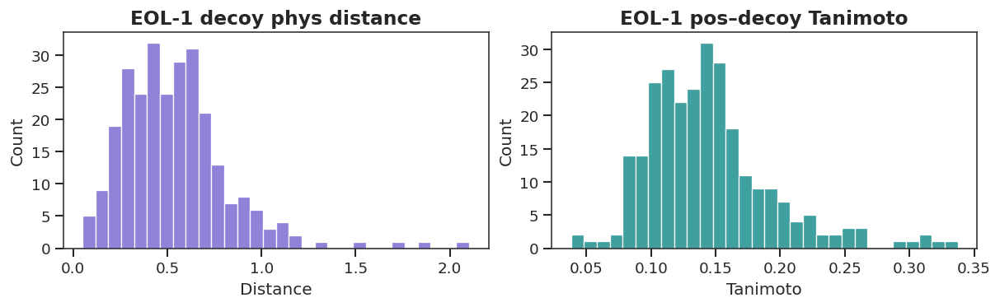

EOL-1 epoch 1/60 loss 0.6909 val_PR 0.856 val_ROC 0.815
EOL-1 epoch 2/60 loss 0.6711 val_PR 0.861 val_ROC 0.823
EOL-1 epoch 3/60 loss 0.6386 val_PR 0.857 val_ROC 0.833
EOL-1 epoch 4/60 loss 0.5851 val_PR 0.849 val_ROC 0.823
EOL-1 epoch 5/60 loss 0.5130 val_PR 0.842 val_ROC 0.815
EOL-1 epoch 6/60 loss 0.4217 val_PR 0.844 val_ROC 0.804
EOL-1 epoch 7/60 loss 0.3222 val_PR 0.843 val_ROC 0.812
EOL-1 epoch 8/60 loss 0.2676 val_PR 0.839 val_ROC 0.807
EOL-1 epoch 9/60 loss 0.2163 val_PR 0.833 val_ROC 0.796
EOL-1 epoch 10/60 loss 0.1724 val_PR 0.848 val_ROC 0.808
EOL-1 epoch 11/60 loss 0.1098 val_PR 0.855 val_ROC 0.811
EOL-1 epoch 12/60 loss 0.0884 val_PR 0.854 val_ROC 0.808
EOL-1 epoch 13/60 loss 0.0974 val_PR 0.851 val_ROC 0.804
EOL-1 epoch 14/60 loss 0.0906 val_PR 0.859 val_ROC 0.809
EOL-1 epoch 15/60 loss 0.0809 val_PR 0.858 val_ROC 0.811
EOL-1 epoch 16/60 loss 0.0537 val_PR 0.862 val_ROC 0.816
EOL-1 epoch 17/60 loss 0.0544 val_PR 0.861 val_ROC 0.815
EOL-1 epoch 18/60 loss 0.0565 val_PR 0.8

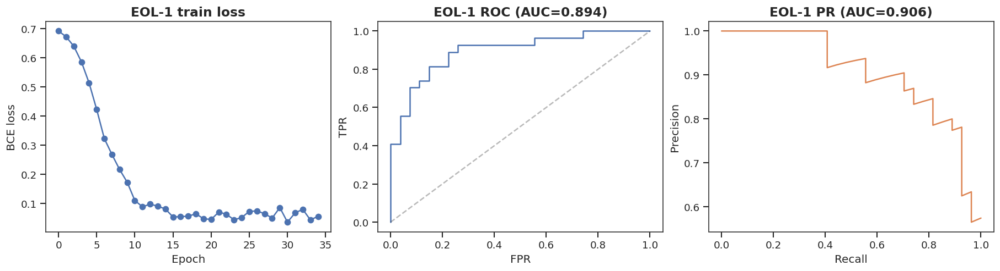

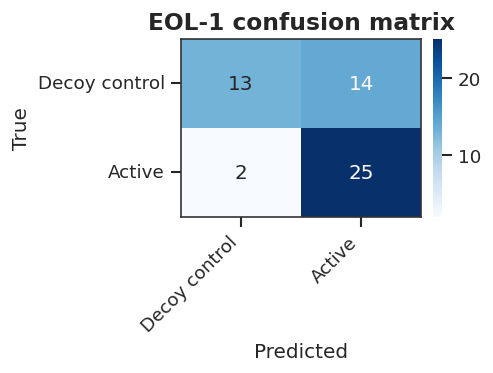

Saved model: models/cell_access_eol1_mlp.pt
HASMC: dataset size 183 (pos=61, neg=122)
Saved decoy pairs: results/decoy_pairs_cell_hasmc.csv


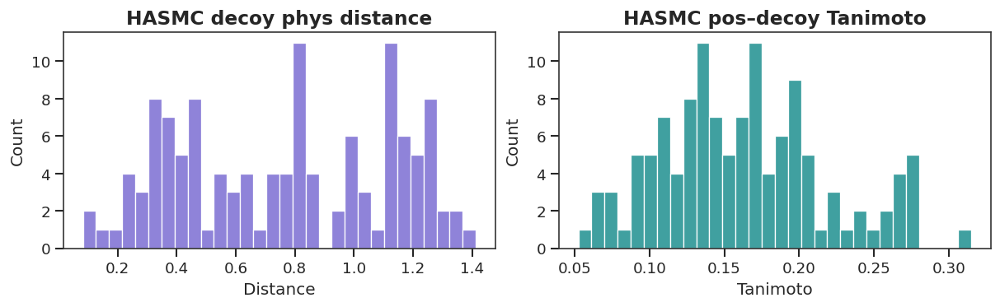

HASMC epoch 1/60 loss 0.6934 val_PR 1.000 val_ROC 1.000
HASMC epoch 2/60 loss 0.6765 val_PR 1.000 val_ROC 1.000
HASMC epoch 3/60 loss 0.6574 val_PR 1.000 val_ROC 1.000
HASMC epoch 4/60 loss 0.6303 val_PR 1.000 val_ROC 1.000
HASMC epoch 5/60 loss 0.5935 val_PR 1.000 val_ROC 1.000
HASMC epoch 6/60 loss 0.5574 val_PR 1.000 val_ROC 1.000
HASMC epoch 7/60 loss 0.5094 val_PR 1.000 val_ROC 1.000
HASMC epoch 8/60 loss 0.4408 val_PR 1.000 val_ROC 1.000
HASMC epoch 9/60 loss 0.3976 val_PR 1.000 val_ROC 1.000
HASMC epoch 10/60 loss 0.3170 val_PR 1.000 val_ROC 1.000
HASMC epoch 11/60 loss 0.2393 val_PR 1.000 val_ROC 1.000
HASMC epoch 12/60 loss 0.1795 val_PR 1.000 val_ROC 1.000
HASMC epoch 13/60 loss 0.1389 val_PR 1.000 val_ROC 1.000
HASMC epoch 14/60 loss 0.0833 val_PR 1.000 val_ROC 1.000
HASMC epoch 15/60 loss 0.0734 val_PR 1.000 val_ROC 1.000
HASMC epoch 16/60 loss 0.0749 val_PR 1.000 val_ROC 1.000


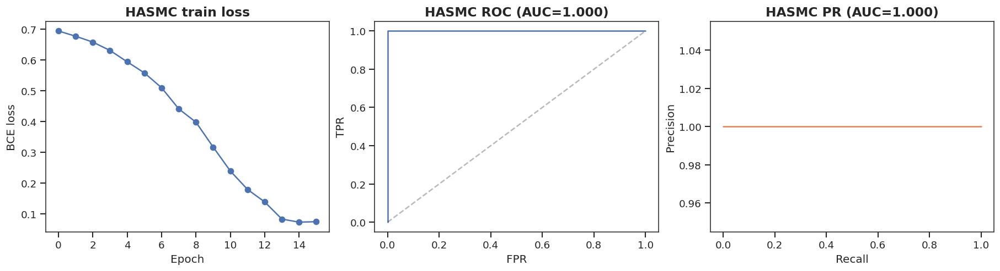

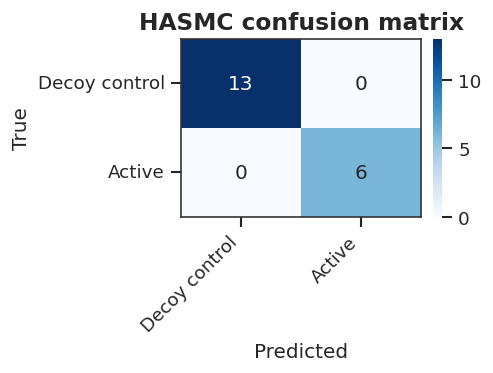

Saved model: models/cell_access_hasmc_mlp.pt
Saved cell-line accessibility predictions: results/isocyanates_cell_access.csv


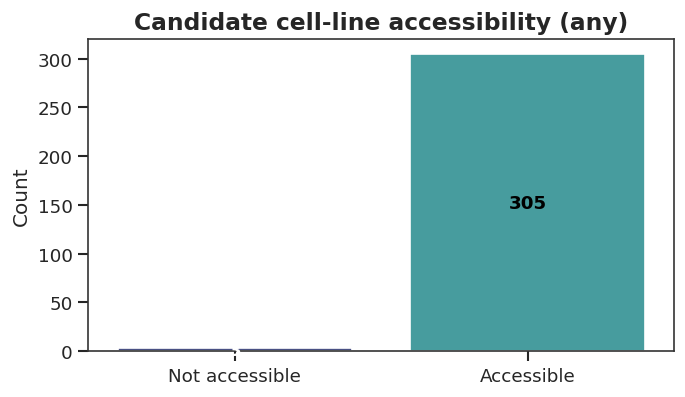

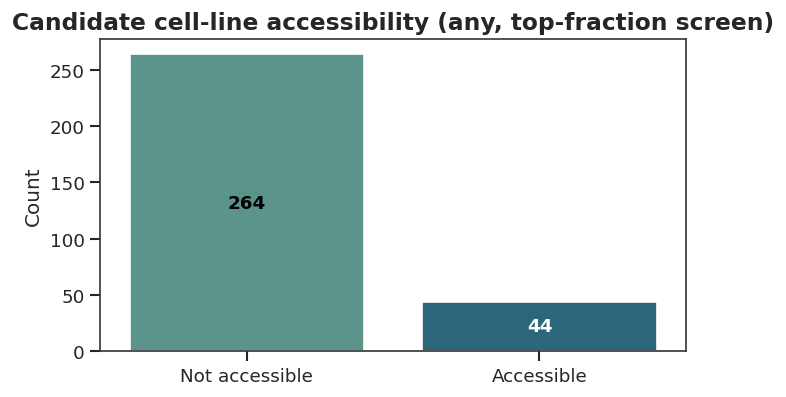

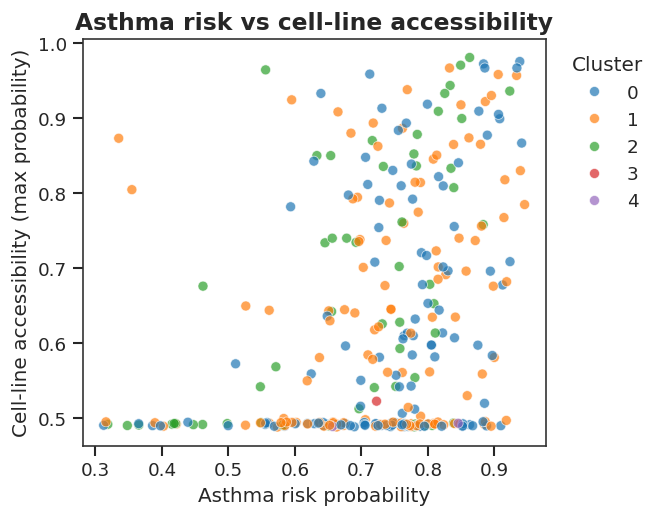

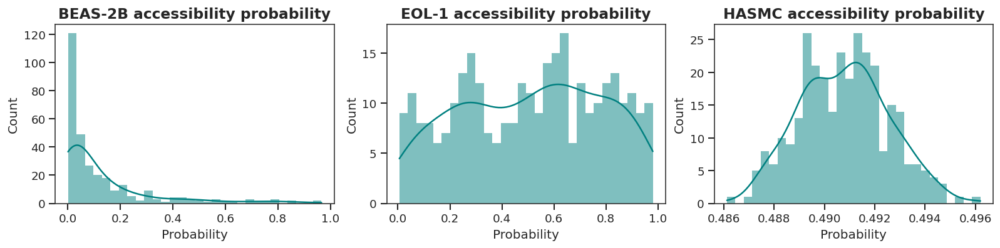

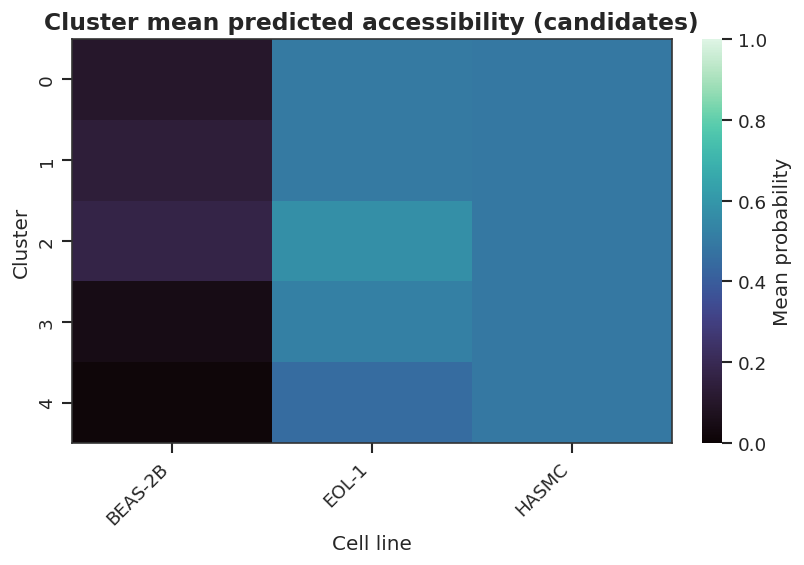

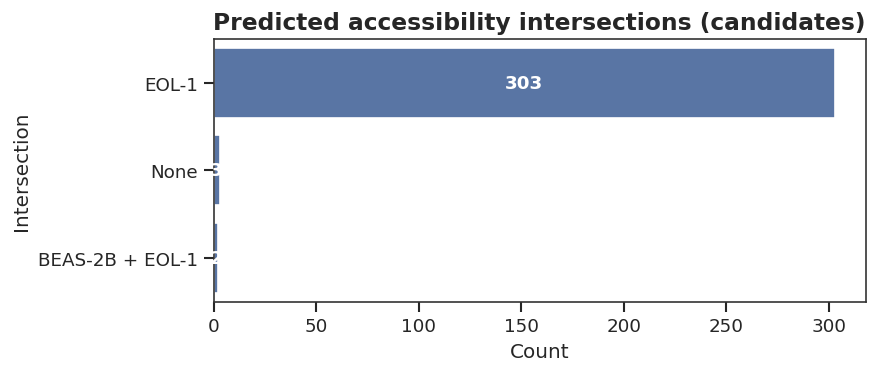

In [26]:
# Train cell-line accessibility models (MLP) with decoy negatives
cell_decoys_per_positive = int(os.environ.get('AM_CELL_DECOYS_PER_POS', '1'))
cell_neighbor_pool = int(os.environ.get('AM_CELL_NEIGHBOR_POOL', '120'))
cell_max_tanimoto = os.environ.get('AM_CELL_MAX_TANIMOTO', '0.35').strip()
cell_max_tanimoto = float(cell_max_tanimoto) if str(cell_max_tanimoto).lower() not in {'', 'none', 'nan'} else None
cell_epochs = int(os.environ.get('AM_CELL_EPOCHS', '60'))
cell_patience = int(os.environ.get('AM_CELL_PATIENCE', '15'))


def featurize_smiles_list(smiles_list):
    fps, phys, kept = [], [], []
    for smi in smiles_list:
        fp, ph = smiles_to_features(smi, cfg)
        if fp is None:
            continue
        fps.append(fp)
        phys.append(ph)
        kept.append(smi)
    if not fps:
        return None, None, None, []
    X_fp_ = np.vstack(fps)
    X_phys_ = np.vstack(phys)
    X_ = np.hstack([X_fp_, X_phys_])
    return X_, X_fp_, X_phys_, np.array(kept, dtype=object)


def prepare_decoy_pool():
    # Prefer full pool if the asthma-decoy module has been run
    pool_fp = X_fp_full if 'X_fp_full' in globals() else X_fp
    pool_phys = X_phys_full if 'X_phys_full' in globals() else X_phys

    if 'smiles_full' in globals() and smiles_full is not None:
        pool_smiles = smiles_full
    elif 'smiles_used' in globals():
        pool_smiles = smiles_used
    else:
        raise RuntimeError('No background pool available (missing smiles_used). Run the asthma dataset cell first.')

    pool_smiles = np.array(pool_smiles, dtype=object)

    canon = []
    keep = []
    for i,s in enumerate(pool_smiles):
        cs = canonicalize_smiles(s)
        if cs is None:
            continue
        canon.append(cs)
        keep.append(i)

    canon = np.array(canon, dtype=object)
    keep = np.array(keep, dtype=int)

    # Deduplicate by canonical smiles
    _, uniq = np.unique(canon, return_index=True)
    keep = keep[uniq]
    canon = canon[uniq]

    pool_fp = pool_fp[keep]
    pool_phys = pool_phys[keep]

    return canon, pool_fp, pool_phys


def select_decoys(
    pos_phys,
    pos_fp,
    pos_smiles,
    neg_phys,
    neg_fp,
    neg_smiles,
    decoys_per_positive=1,
    neighbor_pool=120,
    max_tanimoto=0.35,
    allow_reuse=False,
    random_state=42,
):
    rng = np.random.default_rng(random_state)
    if len(pos_smiles) == 0 or len(neg_smiles) == 0:
        return np.array([], dtype=int), pd.DataFrame()

    scaler = StandardScaler()
    neg_scaled = scaler.fit_transform(neg_phys)
    pos_scaled = scaler.transform(pos_phys)

    k = int(min(max(1, neighbor_pool), len(neg_smiles)))
    nbrs = NearestNeighbors(n_neighbors=k, metric='euclidean')
    nbrs.fit(neg_scaled)

    use_fp = (max_tanimoto is not None)
    fp_pop_neg = neg_fp.sum(axis=1).astype(np.float32)
    fp_pop_pos = pos_fp.sum(axis=1).astype(np.float32)

    used = set()
    pairs = []

    for pi in range(len(pos_smiles)):
        dists, neigh = nbrs.kneighbors(pos_scaled[pi:pi+1], return_distance=True)
        dists = dists.ravel().astype(float)
        neigh = neigh.ravel().astype(int)

        cand = neigh
        sims = np.full_like(dists, np.nan, dtype=float)
        if use_fp:
            inter = (neg_fp[cand] @ pos_fp[pi]).astype(np.float32)
            union = fp_pop_pos[pi] + fp_pop_neg[cand] - inter
            sims = inter / np.maximum(union, 1e-8)

        picked = 0

        # pass 1: closest physchem + tanimoto constraint
        for dist, ni, sim in zip(dists, cand, sims):
            ni = int(ni)
            if (not allow_reuse) and (ni in used):
                continue
            if use_fp and (float(sim) > float(max_tanimoto)):
                continue
            if not allow_reuse:
                used.add(ni)
            pairs.append({
                'pos_smiles': pos_smiles[pi],
                'neg_smiles': neg_smiles[ni],
                'phys_dist': float(dist),
                'tanimoto': float(sim) if use_fp else float('nan'),
            })
            picked += 1
            if picked >= int(decoys_per_positive):
                break

        # pass 2: relax by picking lowest similarity among candidate pool
        if picked < int(decoys_per_positive) and use_fp:
            order = np.lexsort((dists, sims))
            for j in order:
                ni = int(cand[j])
                if (not allow_reuse) and (ni in used):
                    continue
                if not allow_reuse:
                    used.add(ni)
                pairs.append({
                    'pos_smiles': pos_smiles[pi],
                    'neg_smiles': neg_smiles[ni],
                    'phys_dist': float(dists[j]),
                    'tanimoto': float(sims[j]),
                })
                picked += 1
                if picked >= int(decoys_per_positive):
                    break

        # fallback: random
        if picked < int(decoys_per_positive):
            pool = np.array([i for i in range(len(neg_smiles)) if allow_reuse or i not in used], dtype=int)
            if len(pool) > 0:
                need = int(decoys_per_positive) - picked
                extra = rng.choice(pool, size=need, replace=allow_reuse or len(pool) < need)
                for ni in np.atleast_1d(extra):
                    ni = int(ni)
                    if not allow_reuse:
                        used.add(ni)
                    pairs.append({
                        'pos_smiles': pos_smiles[pi],
                        'neg_smiles': neg_smiles[ni],
                        'phys_dist': float('nan'),
                        'tanimoto': float('nan'),
                    })

    pairs_df = pd.DataFrame(pairs)
    if pairs_df.empty:
        return np.array([], dtype=int), pairs_df

    # unique negatives
    neg_unique = pairs_df['neg_smiles'].dropna().unique().tolist()
    neg_to_idx = {s:i for i,s in enumerate(neg_smiles)}
    decoy_idx = np.array([neg_to_idx[s] for s in neg_unique if s in neg_to_idx], dtype=int)
    return decoy_idx, pairs_df


class CellAccessMLP(nn.Module):
    def __init__(self, input_dim, hidden=(512, 256), dropout=0.3):
        super().__init__()
        layers = []
        prev = input_dim
        for h in hidden:
            layers.append(nn.Linear(prev, h))
            layers.append(nn.ReLU())
            layers.append(nn.Dropout(dropout))
            prev = h
        self.body = nn.Sequential(*layers)
        self.out = nn.Linear(prev, 1)

    def forward(self, x):
        return self.out(self.body(x)).squeeze(-1)


def train_cell_mlp(X, y, cell_name, epochs=25, patience=6):
    # Split
    try:
        X_train, X_temp, y_train, y_temp = train_test_split(
            X, y, test_size=0.2, random_state=RANDOM_STATE, stratify=y
        )
        X_val, X_test, y_val, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=RANDOM_STATE, stratify=y_temp
        )
    except Exception:
        X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=RANDOM_STATE)
        X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=RANDOM_STATE)

    # Scale physchem tail only
    phys_dim = 7
    scaler = StandardScaler()
    X_train_phys = scaler.fit_transform(X_train[:, -phys_dim:])
    X_val_phys = scaler.transform(X_val[:, -phys_dim:])
    X_test_phys = scaler.transform(X_test[:, -phys_dim:])

    X_train_s = np.hstack([X_train[:, :-phys_dim], X_train_phys]).astype(np.float32)
    X_val_s = np.hstack([X_val[:, :-phys_dim], X_val_phys]).astype(np.float32)
    X_test_s = np.hstack([X_test[:, :-phys_dim], X_test_phys]).astype(np.float32)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    torch.manual_seed(RANDOM_STATE)

    model = CellAccessMLP(input_dim=X_train_s.shape[1]).to(device)

    # Balanced sampling (preferred for small positives)
    use_sampler = bool(int(os.environ.get('AM_CELL_WEIGHTED_SAMPLER', '1')))
    if use_sampler:
        y_np = np.asarray(y_train, dtype=int)
        class_count = np.bincount(y_np, minlength=2).astype(float)
        class_weight = np.where(class_count > 0, 1.0 / class_count, 0.0)
        sample_weight = torch.tensor(class_weight[y_np], dtype=torch.float32)
        sampler = torch.utils.data.WeightedRandomSampler(sample_weight, num_samples=len(sample_weight), replacement=True)
        train_loader = DataLoader(
            TensorDataset(
                torch.tensor(X_train_s, dtype=torch.float32),
                torch.tensor(y_train, dtype=torch.float32),
            ),
            batch_size=128,
            sampler=sampler,
        )
        criterion = nn.BCEWithLogitsLoss()
    else:
        pos = (y_train == 1).sum()
        neg = (y_train == 0).sum()
        pos_weight = torch.tensor([neg / max(pos, 1)], dtype=torch.float32, device=device)
        criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
        train_loader = DataLoader(
            TensorDataset(
                torch.tensor(X_train_s, dtype=torch.float32),
                torch.tensor(y_train, dtype=torch.float32),
            ),
            batch_size=128,
            shuffle=True,
        )

    optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4, weight_decay=1e-4)

    history = {'train_loss': [], 'val_pr': [], 'val_roc': []}
    best_state = None
    best_val_pr = -1
    no_improve = 0

    X_val_t = torch.tensor(X_val_s, dtype=torch.float32).to(device)

    for ep in range(int(epochs)):
        model.train()
        running = 0.0
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad(set_to_none=True)
            logits = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)
            optimizer.step()
            running += float(loss.item()) * int(len(yb))

        train_loss = running / float(len(train_loader.dataset))

        model.eval()
        with torch.no_grad():
            val_logits = model(X_val_t).detach().cpu().numpy().ravel()
            val_proba = 1.0 / (1.0 + np.exp(-val_logits))

        try:
            val_pr = float(average_precision_score(y_val, val_proba))
            val_roc = float(roc_auc_score(y_val, val_proba)) if len(np.unique(y_val)) == 2 else float('nan')
        except Exception:
            val_pr, val_roc = float('nan'), float('nan')

        history['train_loss'].append(float(train_loss))
        history['val_pr'].append(float(val_pr))
        history['val_roc'].append(float(val_roc))

        if np.isfinite(val_pr) and val_pr > best_val_pr:
            best_val_pr = float(val_pr)
            best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
            no_improve = 0
        else:
            no_improve += 1

        print(f'{cell_name} epoch {ep+1}/{epochs} loss {train_loss:.4f} val_PR {val_pr:.3f} val_ROC {val_roc:.3f}')
        if no_improve >= int(patience):
            break

    if best_state is not None:
        model.load_state_dict(best_state)

    # Recompute validation probabilities for the selected (best) checkpoint
    model.eval()
    with torch.no_grad():
        val_logits_best = model(X_val_t).detach().cpu().numpy().ravel()
        val_proba_best = 1.0 / (1.0 + np.exp(-val_logits_best))

    # Threshold selection on validation
    beta = float(os.environ.get('AM_CELL_THRESHOLD_BETA', '1.0'))
    if str(cell_name).upper().replace('-', '') == 'EOL1':
        beta = float(os.environ.get('AM_EOL1_THRESHOLD_BETA', str(beta)))
    if str(cell_name).upper().replace('-', '') == 'BEAS2B':
        beta = float(os.environ.get('AM_BEAS2B_THRESHOLD_BETA', str(beta)))
    if str(cell_name).upper() == 'HASMC':
        beta = float(os.environ.get('AM_HASMC_THRESHOLD_BETA', '2.0'))

    recall_target = float(os.environ.get('AM_CELL_RECALL_TARGET', '0.80'))
    if str(cell_name).upper().replace('-', '') == 'EOL1':
        recall_target = float(os.environ.get('AM_EOL1_RECALL_TARGET', str(recall_target)))
    if str(cell_name).upper().replace('-', '') == 'BEAS2B':
        recall_target = float(os.environ.get('AM_BEAS2B_RECALL_TARGET', str(recall_target)))
    if str(cell_name).upper() == 'HASMC':
        recall_target = float(os.environ.get('AM_HASMC_RECALL_TARGET', '0.85'))
    thr_mode = 'default'

    max_fpr_guard = os.environ.get('AM_CELL_MAX_FPR', '0.30').strip()
    if str(cell_name).upper() == 'HASMC':
        max_fpr_guard = os.environ.get('AM_HASMC_MAX_FPR', max_fpr_guard).strip()
    if str(cell_name).upper().replace('-', '') == 'EOL1':
        max_fpr_guard = os.environ.get('AM_EOL1_MAX_FPR', max_fpr_guard).strip()
    if str(cell_name).upper().replace('-', '') == 'BEAS2B':
        max_fpr_guard = os.environ.get('AM_BEAS2B_MAX_FPR', max_fpr_guard).strip()
    max_fpr_guard = float(max_fpr_guard) if str(max_fpr_guard).lower() not in {'', 'none', 'nan'} else None


    try:
        prec_cv, rec_cv, thr_cv = precision_recall_curve(y_val, val_proba_best)
        if len(thr_cv) > 0:
            prec_t = prec_cv[:-1]
            rec_t = rec_cv[:-1]
            mask = rec_t >= float(recall_target)
            if mask.any():
                cand = np.where(mask)[0]
                best_i = int(cand[int(np.nanargmax(prec_t[mask]))])
                cell_thr = float(thr_cv[best_i])
                thr_mode = f'recall>={recall_target:.2f}'
            else:
                beta2 = beta * beta
                fbeta = (1 + beta2) * prec_t * rec_t / (beta2 * prec_t + rec_t + 1e-12)
                best_i = int(np.nanargmax(fbeta))
                cell_thr = float(thr_cv[best_i])
                thr_mode = f'fbeta(beta={beta:.2f})'
        else:
            cell_thr = 0.5
            thr_mode = 'default'
    except Exception:
        cell_thr = 0.5
        thr_mode = 'default'

    # Optional FPR guard (validation) to reduce false positives on decoy controls
    if max_fpr_guard is not None and len(np.unique(y_val)) == 2:
        yv = np.asarray(y_val, dtype=int)
        thr_candidates = np.unique(np.asarray(val_proba_best, dtype=float))
        thr_candidates = np.sort(thr_candidates)

        def _val_stats(thr):
            yp = (val_proba_best >= float(thr)).astype(int)
            tn = int(((yv == 0) & (yp == 0)).sum())
            fp = int(((yv == 0) & (yp == 1)).sum())
            fn = int(((yv == 1) & (yp == 0)).sum())
            tp = int(((yv == 1) & (yp == 1)).sum())
            fpr = fp / max(fp + tn, 1)
            rec = tp / max(tp + fn, 1)
            prec = tp / max(tp + fp, 1)
            return fpr, rec, prec

        fpr0, rec0, prec0 = _val_stats(cell_thr)
        if fpr0 > float(max_fpr_guard):
            best_thr = float(cell_thr)
            best_meets = False
            best_prec = -1.0
            best_rec = -1.0

            for thr in thr_candidates:
                fpr, rec, prec = _val_stats(thr)
                if fpr > float(max_fpr_guard):
                    continue
                meets = rec >= float(recall_target)
                if meets:
                    if (not best_meets) or (prec > best_prec + 1e-12) or (abs(prec - best_prec) <= 1e-12 and rec > best_rec):
                        best_thr = float(thr)
                        best_meets = True
                        best_prec = float(prec)
                        best_rec = float(rec)
                else:
                    if (not best_meets) and (rec > best_rec + 1e-12):
                        best_thr = float(thr)
                        best_prec = float(prec)
                        best_rec = float(rec)

            cell_thr = float(best_thr)
            thr_mode = f'{thr_mode} + fpr<={float(max_fpr_guard):.2f}'

    # BEAS-2B: optional recall boost under FPR budget (reduces false negatives)
    if str(cell_name).upper().replace('-', '') == 'BEAS2B' and len(np.unique(y_val)) == 2:
        yv = np.asarray(y_val, dtype=int)
        thr_candidates = np.unique(np.asarray(val_proba_best, dtype=float))
        thr_candidates = np.sort(thr_candidates)

        def _val_stats2(thr):
            yp = (val_proba_best >= float(thr)).astype(int)
            tn = int(((yv == 0) & (yp == 0)).sum())
            fp = int(((yv == 0) & (yp == 1)).sum())
            fn = int(((yv == 1) & (yp == 0)).sum())
            tp = int(((yv == 1) & (yp == 1)).sum())
            fpr = fp / max(fp + tn, 1)
            rec = tp / max(tp + fn, 1)
            prec = tp / max(tp + fp, 1)
            return fpr, rec, prec

        fpr0, rec0, prec0 = _val_stats2(cell_thr)
        best_thr = float(cell_thr)
        best_rec = float(rec0)
        best_prec = float(prec0)
        for thr in thr_candidates:
            fpr, rec, prec = _val_stats2(thr)
            if max_fpr_guard is not None and fpr > float(max_fpr_guard):
                continue
            if rec > best_rec + 1e-12 or (abs(rec - best_rec) <= 1e-12 and prec > best_prec + 1e-12):
                best_thr = float(thr)
                best_rec = float(rec)
                best_prec = float(prec)
        if best_rec > rec0 + 1e-6 and best_thr != float(cell_thr):
            cell_thr = float(best_thr)
            thr_mode = f'{thr_mode} + recall_boost'


    # Test metrics
    X_test_t = torch.tensor(X_test_s, dtype=torch.float32).to(device)
    with torch.no_grad():
        test_logits = model(X_test_t).detach().cpu().numpy().ravel()
        y_proba = 1.0 / (1.0 + np.exp(-test_logits))

    y_pred = (y_proba >= cell_thr).astype(int)

    metrics = {
        'roc_auc': roc_auc_score(y_test, y_proba) if len(np.unique(y_test)) == 2 else float('nan'),
        'pr_auc': average_precision_score(y_test, y_proba) if len(np.unique(y_test)) == 2 else float('nan'),
        'n': int(len(y)),
        'pos': int((y == 1).sum()),
        'neg': int((y == 0).sum()),
        'threshold': float(cell_thr),
        'threshold_beta': float(beta),
        'threshold_mode': str(thr_mode),
        'recall_target': float(recall_target),
    }

    # Plots
    fig, axes = plt.subplots(1, 3, figsize=(15, 4), constrained_layout=True)
    axes[0].plot(history['train_loss'], marker='o')
    axes[0].set_title(f'{cell_name} train loss')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('BCE loss')
    clean_ax(axes[0])

    fpr, tpr, _ = roc_curve(y_test, y_proba)
    prec, rec, _ = precision_recall_curve(y_test, y_proba)

    axes[1].plot(fpr, tpr, color='C0')
    axes[1].plot([0, 1], [0, 1], 'k--', alpha=0.3)
    axes[1].set_title(f"{cell_name} ROC (AUC={metrics['roc_auc']:.3f})")
    axes[1].set_xlabel('FPR')
    axes[1].set_ylabel('TPR')
    clean_ax(axes[1])

    axes[2].plot(rec, prec, color='C1')
    axes[2].set_title(f"{cell_name} PR (AUC={metrics['pr_auc']:.3f})")
    axes[2].set_xlabel('Recall')
    axes[2].set_ylabel('Precision')
    clean_ax(axes[2])

    save_fig(f'cell_{cell_name.lower()}_training_panel', fig)
    plt.show()

    cm = confusion_matrix(y_test, y_pred)
    fig, ax = plt.subplots(figsize=(4, 3), constrained_layout=True)
    sns.heatmap(cm, cmap='Blues', annot=True, fmt='d', ax=ax)
    ax.set_title(f'{cell_name} confusion matrix')
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')
    ax.set_xticklabels(['Decoy control', 'Active'], rotation=45, ha='right')
    ax.set_yticklabels(['Decoy control', 'Active'], rotation=0)
    for spine in ax.spines.values():
        spine.set_visible(True)
    save_fig(f'cell_{cell_name.lower()}_confusion', fig)
    plt.show()

    artifact = {
        'state_dict': model.state_dict(),
        'input_dim': int(X_train_s.shape[1]),
        'hidden': (512, 256),
        'dropout': 0.3,
        'phys_mean': scaler.mean_.astype(float),
        'phys_scale': scaler.scale_.astype(float),
        'cell_name': cell_name,
        'threshold': float(cell_thr),
        'threshold_beta': float(beta),
        'metrics': metrics,
    }
    return artifact, history


cell_models = {}

if not cell_pos:
    print('Skip training: no cell-line positives loaded.')
else:
    pool_smiles, pool_fp, pool_phys = prepare_decoy_pool()

    for cell, pos_set in cell_pos.items():
        pos_smiles = np.array(sorted(pos_set), dtype=object)

        X_pos, X_fp_pos, X_phys_pos, pos_smiles_kept = featurize_smiles_list(pos_smiles)
        if X_pos is None:
            print(f'{cell}: no valid SMILES after featurization (skip).')
            continue

        neg_mask = ~np.isin(pool_smiles, pos_set)
        neg_smiles = pool_smiles[neg_mask]
        neg_fp = pool_fp[neg_mask]
        neg_phys = pool_phys[neg_mask]

        decoys_per_positive_local = cell_decoys_per_positive
        max_tanimoto_local = cell_max_tanimoto
        if str(cell).upper().replace('-', '') == 'EOL1':
            v = os.environ.get('AM_EOL1_MAX_TANIMOTO', '').strip()
            if v and v.lower() not in {'none', 'nan'}:
                max_tanimoto_local = float(v)
        if str(cell).upper() == 'HASMC':
            v = os.environ.get('AM_HASMC_MAX_TANIMOTO', '').strip()
            if v and v.lower() not in {'none', 'nan'}:
                max_tanimoto_local = float(v)
        if str(cell).upper().replace('-', '') in {'BEAS2B', 'BEAS2B_CELL'}:
            v = os.environ.get('AM_BEAS2B_MAX_TANIMOTO', '').strip()
            if v and v.lower() not in {'none', 'nan'}:
                max_tanimoto_local = float(v)
        hasmc_min_decoys = int(os.environ.get('AM_HASMC_MIN_DECOYS', '2'))
        if cell == 'HASMC':
            decoys_per_positive_local = max(decoys_per_positive_local, hasmc_min_decoys)
        elif len(pos_set) < 20:
            decoys_per_positive_local = max(decoys_per_positive_local, 4)

        decoy_idx, pairs_df = select_decoys(
            X_phys_pos,
            X_fp_pos,
            pos_smiles_kept,
            neg_phys,
            neg_fp,
            neg_smiles,
            decoys_per_positive=decoys_per_positive_local,
            neighbor_pool=cell_neighbor_pool,
            max_tanimoto=max_tanimoto_local,
            allow_reuse=False,
            random_state=RANDOM_STATE,
        )

        if len(decoy_idx) == 0:
            print(f'{cell}: no decoys selected (skip).')
            continue

        # Build dataset
        X_neg = np.hstack([neg_fp[decoy_idx], neg_phys[decoy_idx]])
        y_pos = np.ones(len(X_pos), dtype=int)
        y_neg = np.zeros(len(X_neg), dtype=int)

        X_all = np.vstack([X_pos, X_neg])
        y_all = np.concatenate([y_pos, y_neg])

        print(f'{cell}: dataset size {len(y_all)} (pos={len(y_pos)}, neg={len(y_neg)})')

        # Save decoy pairs
        pairs_out = cfg.results_dir / f'decoy_pairs_cell_{cell.replace("-", "").lower()}.csv'
        pairs_df.to_csv(pairs_out, index=False)
        print(f'Saved decoy pairs: {pairs_out}')

        # Diagnostics
        if 'tanimoto' in pairs_df.columns and pairs_df['tanimoto'].notna().any():
            fig, axes = plt.subplots(1, 2, figsize=(10,3), constrained_layout=True)
            sns.histplot(pairs_df['phys_dist'].dropna(), bins=30, ax=axes[0], color='slateblue')
            axes[0].set_title(f'{cell} decoy phys distance')
            axes[0].set_xlabel('Distance'); axes[0].set_ylabel('Count')

            sns.histplot(pairs_df['tanimoto'].dropna(), bins=30, ax=axes[1], color='teal')
            axes[1].set_title(f'{cell} pos–decoy Tanimoto')
            axes[1].set_xlabel('Tanimoto'); axes[1].set_ylabel('Count')
            plt.show()

        # Train
        artifact, history = train_cell_mlp(X_all, y_all, cell_name=cell, epochs=cell_epochs, patience=cell_patience)

        model_path = cfg.models_dir / f'cell_access_{cell.replace("-", "").lower()}_mlp.pt'
        torch.save(artifact, model_path)
        print(f'Saved model: {model_path}')

        cell_models[cell] = artifact


# Score candidate set and persist
if 'isoc_clustered' in globals() and cell_models:
    cand_smiles = isoc_clustered['SMILES'].astype(str).tolist()
    X_cand, X_fp_cand, X_phys_cand, cand_smiles_kept = featurize_smiles_list(cand_smiles)
    if X_cand is None:
        raise ValueError('No valid candidate SMILES for cell-line scoring')

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    pred_cols, proba_cols, screen_cols = [], [], []

    for cell, art in cell_models.items():
        model = CellAccessMLP(
            input_dim=int(art['input_dim']),
            hidden=tuple(art.get('hidden', (512, 256))),
            dropout=float(art.get('dropout', 0.3)),
        ).to(device)
        model.load_state_dict(art['state_dict'])
        model.eval()

        mean = np.asarray(art['phys_mean'], dtype=float)
        scale = np.asarray(art['phys_scale'], dtype=float)
        scale = np.where(scale == 0, 1.0, scale)

        X_phys_s = (X_phys_cand - mean) / scale
        X_in = np.hstack([X_fp_cand, X_phys_s])

        with torch.no_grad():
            logits = model(torch.tensor(X_in, dtype=torch.float32, device=device)).detach().cpu().numpy().ravel()
        proba = 1.0 / (1.0 + np.exp(-logits))

        tag = cell.replace('-', '').lower()
        col_p = f'cell_{tag}_proba'
        col_y = f'cell_{tag}_pred'

        df_pred = pd.DataFrame({'SMILES': cand_smiles_kept, col_p: proba.astype(float)})
        df_pred = df_pred.groupby('SMILES', as_index=False)[col_p].mean()

        top_frac = float(os.environ.get('AM_CELL_SCREEN_TOP_FRAC', '0.05'))
        top_frac = float(np.clip(top_frac, 0.0, 0.5))

        thr_local = float(art.get('threshold', 0.5))
        df_pred[col_y] = (df_pred[col_p] >= thr_local).astype(int)

        col_y_screen = f'cell_{tag}_screen'
        if top_frac > 0 and len(df_pred) > 0:
            thr_screen = float(np.quantile(df_pred[col_p].values, 1.0 - top_frac))
        else:
            thr_screen = float(thr_local)
        df_pred[col_y_screen] = (df_pred[col_p] >= thr_screen).astype(int)

        isoc_clustered = isoc_clustered.drop(columns=[col_p, col_y, col_y_screen], errors='ignore').merge(df_pred, on='SMILES', how='left')
        pred_cols.append(col_y)
        screen_cols.append(col_y_screen)
        proba_cols.append(col_p)

    if pred_cols:
        isoc_clustered['cell_access_any_pred'] = (
            isoc_clustered[pred_cols].fillna(0).astype(int).sum(axis=1) > 0
        ).astype(int)
        if screen_cols:
            isoc_clustered['cell_access_any_screen'] = (
                isoc_clustered[screen_cols].fillna(0).astype(int).sum(axis=1) > 0
            ).astype(int)
        isoc_clustered['cell_access_any_proba'] = isoc_clustered[proba_cols].max(axis=1)

        out_path = cfg.results_dir / 'isocyanates_cell_access.csv'
        isoc_clustered.to_csv(out_path, index=False)
        print(f'Saved cell-line accessibility predictions: {out_path}')

        # Summary plots
        counts = isoc_clustered['cell_access_any_pred'].fillna(0).astype(int).value_counts().sort_index()
        tmp = counts.reset_index()
        tmp.columns = ['label', 'count']
        tmp['label'] = tmp['label'].map({0: 'Not accessible', 1: 'Accessible'}).fillna(tmp['label'].astype(str))

        fig, ax = plt.subplots(figsize=(5.6, 3.2), constrained_layout=True)
        sns.barplot(data=tmp, x='label', y='count', hue='label', palette='mako', legend=False, ax=ax)
        ax.set_title('Candidate cell-line accessibility (any)')
        ax.set_xlabel('')
        ax.set_ylabel('Count')
        annotate_bars_center(ax)
        clean_ax(ax)
        save_fig('isoc_cell_access_any_counts', fig)
        plt.show()

        if 'cell_access_any_screen' in isoc_clustered.columns:
            counts = isoc_clustered['cell_access_any_screen'].fillna(0).astype(int).value_counts().sort_index()
            tmp = counts.reset_index()
            tmp.columns = ['label', 'count']
            tmp['label'] = tmp['label'].map({0: 'Not accessible', 1: 'Accessible'}).fillna(tmp['label'].astype(str))

            fig, ax = plt.subplots(figsize=(5.6, 3.2), constrained_layout=True)
            sns.barplot(data=tmp, x='label', y='count', hue='label', palette='crest', legend=False, ax=ax)
            ax.set_title('Candidate cell-line accessibility (any, top-fraction screen)')
            ax.set_xlabel('')
            ax.set_ylabel('Count')
            annotate_bars_center(ax)
            clean_ax(ax)
            save_fig('isoc_cell_access_any_counts_screen', fig)
            plt.show()

        if 'asthma_risk_proba' in isoc_clustered.columns:
            fig, ax = plt.subplots(figsize=(5.4, 4.2), constrained_layout=True)
            sns.scatterplot(
                data=isoc_clustered,
                x='asthma_risk_proba',
                y='cell_access_any_proba',
                hue='cluster_km' if 'cluster_km' in isoc_clustered.columns else None,
                palette=globals().get('CLUSTER_PALETTE', 'mako'),
                alpha=0.7,
                ax=ax,
            )
            ax.set_title('Asthma risk vs cell-line accessibility')
            ax.set_xlabel('Asthma risk probability')
            ax.set_ylabel('Cell-line accessibility (max probability)')
            clean_ax(ax)
            legend_outside(ax, title='Cluster')
            save_fig('isoc_asthma_risk_vs_cell_access', fig)
            plt.show()

        # Candidate probability distributions (per cell line)
        per_cell_probs = [c for c in proba_cols if c in isoc_clustered.columns]
        label_map = {
            'cell_beas2b_proba': 'BEAS-2B',
            'cell_eol1_proba': 'EOL-1',
            'cell_hasmc_proba': 'HASMC',
        }
        if per_cell_probs:
            fig, axes = plt.subplots(1, len(per_cell_probs), figsize=(4.4*len(per_cell_probs), 3.2), constrained_layout=True)
            axes = [axes] if len(per_cell_probs) == 1 else list(axes)
            for ax, col in zip(axes, per_cell_probs):
                sns.histplot(isoc_clustered[col].dropna(), bins=30, kde=True, color='teal', edgecolor='none', ax=ax)
                ax.set_title(f"{label_map.get(col, col)} accessibility probability")
                ax.set_xlabel('Probability')
                ax.set_ylabel('Count')
                clean_ax(ax)
            save_fig('isoc_cell_access_prob_distributions', fig)
            plt.show()

        # Cluster-level accessibility profile heatmap
        if per_cell_probs and 'cluster_km' in isoc_clustered.columns:
            cl = isoc_clustered.groupby('cluster_km')[per_cell_probs].mean(numeric_only=True).sort_index()
            cl = cl.rename(columns={k: v for k, v in label_map.items() if k in cl.columns})
            fig_w = max(6.5, 1.2 * cl.shape[1] + 3)
            fig_h = max(3.0, 0.6 * cl.shape[0] + 1.6)
            fig, ax = plt.subplots(figsize=(fig_w, fig_h), constrained_layout=True)
            sns.heatmap(cl, cmap='mako', vmin=0, vmax=1, cbar_kws={'label': 'Mean probability'}, ax=ax)
            ax.set_title('Cluster mean predicted accessibility (candidates)')
            ax.set_xlabel('Cell line')
            ax.set_ylabel('Cluster')
            ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
            for spine in ax.spines.values():
                spine.set_visible(True)
            save_fig('isoc_cell_access_cluster_mean_heatmap', fig)
            plt.show()

        # Intersection counts across cell lines (predicted actives)
        base_pred_cols = [c for c in pred_cols if c != 'cell_access_any_pred' and c in isoc_clustered.columns]
        cell_name_map = {
            'cell_beas2b_pred': 'BEAS-2B',
            'cell_eol1_pred': 'EOL-1',
            'cell_hasmc_pred': 'HASMC',
        }
        if base_pred_cols:
            combo = isoc_clustered[base_pred_cols].fillna(0).astype(int)
            def _combo_label(row):
                act = [cell_name_map.get(c, c) for c in base_pred_cols if int(row.get(c, 0)) == 1]
                return ' + '.join(act) if act else 'None'
            combo_label = combo.apply(_combo_label, axis=1)
            combo_counts = combo_label.value_counts().sort_values(ascending=False)
            fig_h = max(3.0, 0.32 * len(combo_counts) + 1.2)
            fig, ax = plt.subplots(figsize=(7.2, fig_h), constrained_layout=True)
            sns.barplot(x=combo_counts.values, y=combo_counts.index, color='#4C72B0', ax=ax)
            ax.set_title('Predicted accessibility intersections (candidates)')
            ax.set_xlabel('Count')
            ax.set_ylabel('Intersection')
            # Center labels inside bars
            for patch in ax.patches:
                w = float(patch.get_width())
                y = patch.get_y() + patch.get_height() / 2
                ax.text(max(0.5, w / 2), y, f"{int(w)}", ha='center', va='center', fontsize=11, fontweight='bold', color='white')
            clean_ax(ax)
            save_fig('isoc_cell_access_intersections', fig)
            plt.show()


## Target affinity (DTI): SMILES + protein sequence (BindingDB)

A lightweight DTI regressor pretrained on BindingDB to predict pAff for (compound, target sequence) pairs.


In [27]:
import math
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader


def build_vocab(strings, extra_tokens=None, min_freq=1):
    freq = {}
    for s in strings:
        for ch in str(s):
            freq[ch] = freq.get(ch, 0) + 1

    tokens = [ch for ch, c in sorted(freq.items()) if c >= int(min_freq)]
    base_extra = ["<pad>", "<unk>"]
    extra = extra_tokens or []
    vocab = list(dict.fromkeys(base_extra + list(extra) + tokens))
    stoi = {t: i for i, t in enumerate(vocab)}
    itos = {i: t for t, i in stoi.items()}
    return stoi, itos


def tokenize(seq, stoi, unk_token="<unk>", max_len=None):
    unk_idx = int(stoi.get(unk_token, 0))
    vocab_size = int(len(stoi))
    max_len = None if max_len in {None, '', 0, '0', 'none', 'None'} else int(max_len)
    out = []
    for ch in str(seq):
        idx = int(stoi.get(ch, unk_idx))
        if idx < 0 or idx >= vocab_size:
            idx = unk_idx
        out.append(idx)
        if max_len is not None and len(out) >= max_len:
            break
    return out


class PairDataset(Dataset):
    def __init__(
        self,
        df,
        smi_col,
        seq_col,
        y_col,
        smi_stoi,
        seq_stoi,
        pad_ids,
        max_smi_len=None,
        max_seq_len=None,
    ):
        self.df = df.reset_index(drop=True)
        self.smi_col = smi_col
        self.seq_col = seq_col
        self.y_col = y_col
        self.smi_stoi = smi_stoi
        self.seq_stoi = seq_stoi
        self.pad_ids = pad_ids
        self.max_smi_len = None if max_smi_len in {None, '', 0, '0', 'none', 'None'} else int(max_smi_len)
        self.max_seq_len = None if max_seq_len in {None, '', 0, '0', 'none', 'None'} else int(max_seq_len)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        smi_ids = tokenize(row[self.smi_col], self.smi_stoi, max_len=self.max_smi_len)
        seq_ids = tokenize(row[self.seq_col], self.seq_stoi, max_len=self.max_seq_len)
        y = float(row[self.y_col])
        return smi_ids, seq_ids, y



def collate_batch(batch, pad_ids):
    smi_seqs, prot_seqs, ys = zip(*batch)
    max_smi = max(1, max(len(s) for s in smi_seqs))
    max_prot = max(1, max(len(s) for s in prot_seqs))
    smi_pad, prot_pad = int(pad_ids["smi"]), int(pad_ids["prot"])

    def pad(seq, max_len, pad_val):
        return seq + [pad_val] * (max_len - len(seq))

    smi_tensor = torch.tensor([pad(s, max_smi, smi_pad) for s in smi_seqs], dtype=torch.long)
    prot_tensor = torch.tensor([pad(s, max_prot, prot_pad) for s in prot_seqs], dtype=torch.long)
    y_tensor = torch.tensor(ys, dtype=torch.float32)
    smi_mask = (smi_tensor != smi_pad).float()
    prot_mask = (prot_tensor != prot_pad).float()
    return smi_tensor, smi_mask, prot_tensor, prot_mask, y_tensor


def sinusoidal_positional_encoding(length: int, dim: int, device):
    length = int(length)
    dim = int(dim)
    position = torch.arange(length, device=device, dtype=torch.float32).unsqueeze(1)
    div_term = torch.exp(
        torch.arange(0, dim, 2, device=device, dtype=torch.float32) * (-math.log(10000.0) / dim)
    )
    pe = torch.zeros(length, dim, device=device, dtype=torch.float32)
    pe[:, 0::2] = torch.sin(position * div_term)
    pe[:, 1::2] = torch.cos(position * div_term)
    return pe.unsqueeze(0)


class SeqEncoder(nn.Module):
    def __init__(
        self,
        vocab_size,
        embed_dim=64,
        channels=128,
        kernel_sizes=(3, 5),
        model_type="cnn",
        n_heads=4,
        n_layers=2,
        dropout=0.1,
        ff_mult=2,
    ):
        super().__init__()
        self.model_type = str(model_type).lower()
        self.embed = nn.Embedding(int(vocab_size), int(embed_dim), padding_idx=0)
        self.kernel_sizes = kernel_sizes

        if self.model_type == "cnn":
            self.convs = nn.ModuleList([
                nn.Conv1d(int(embed_dim), int(channels), k, padding=k // 2)
                for k in kernel_sizes
            ])
            self.out_dim = int(len(kernel_sizes)) * int(channels)
        else:
            layer = nn.TransformerEncoderLayer(
                d_model=int(embed_dim),
                nhead=int(n_heads),
                dim_feedforward=int(embed_dim) * int(ff_mult),
                dropout=float(dropout),
                batch_first=True,
                activation='gelu',
                norm_first=True,
            )
            self.transformer = nn.TransformerEncoder(layer, num_layers=int(n_layers))
            self.out_dim = int(embed_dim)

    def forward(self, x, mask):
        emb = self.embed(x)  # (B, L, E)

        if self.model_type == "cnn":
            emb_t = emb.transpose(1, 2)  # (B, E, L)
            outs = []
            for conv in self.convs:
                o = conv(emb_t)
                o = o.masked_fill(mask.unsqueeze(1) == 0, -1e9)
                o = torch.relu(o)
                o = torch.max(o, dim=2).values
                outs.append(o)
            return torch.cat(outs, dim=1)

        # Transformer path (sinusoidal positions; supports arbitrary sequence length)
        pe = sinusoidal_positional_encoding(emb.size(1), emb.size(2), emb.device)
        emb = emb + pe
        key_padding_mask = mask == 0  # True where padding
        out = self.transformer(emb, src_key_padding_mask=key_padding_mask)
        mask_sum = mask.sum(dim=1, keepdim=True).clamp(min=1e-6)
        pooled = (out * mask.unsqueeze(-1)).sum(dim=1) / mask_sum
        return pooled


class DTIModel(nn.Module):
    def __init__(self, smi_vocab, prot_vocab, embed_dim=64, channels=128, hidden=256, model_type="cnn"):
        super().__init__()
        self.model_type = str(model_type).lower()
        self.smi_enc = SeqEncoder(int(smi_vocab), embed_dim=embed_dim, channels=channels, model_type=self.model_type)
        self.prot_enc = SeqEncoder(int(prot_vocab), embed_dim=embed_dim, channels=channels, model_type=self.model_type)
        fusion_dim = int(self.smi_enc.out_dim) + int(self.prot_enc.out_dim)
        self.head = nn.Sequential(
            nn.Linear(fusion_dim, int(hidden)),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(int(hidden), 1),
        )

    def forward(self, smi_ids, smi_mask, prot_ids, prot_mask, return_latent: bool = False):
        smi_vec = self.smi_enc(smi_ids, smi_mask)
        prot_vec = self.prot_enc(prot_ids, prot_mask)
        fused = torch.cat([smi_vec, prot_vec], dim=1)
        out = self.head(fused).squeeze(-1)
        if return_latent:
            return out, fused
        return out

    def head_forward(self, fused):
        return self.head(fused).squeeze(-1)


DTI device: cpu | model=transformer | amp=False | batch=8 | grad_accum=1
DTI truncation: max_smi_len=none max_seq_len=none
Adv eps grid: [0.1, 0.2, 0.3]
BindingDB samples: 5000 | cols: Ligand SMILES, BindingDB Target Chain Sequence 1


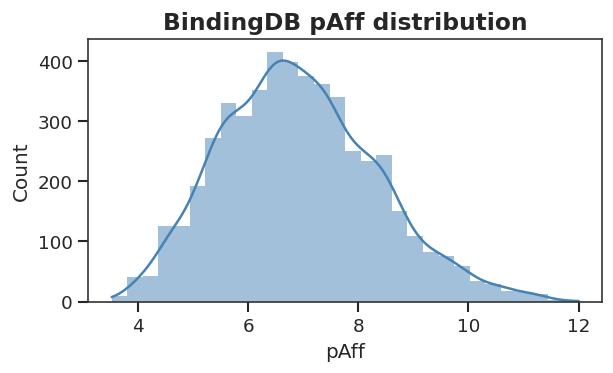

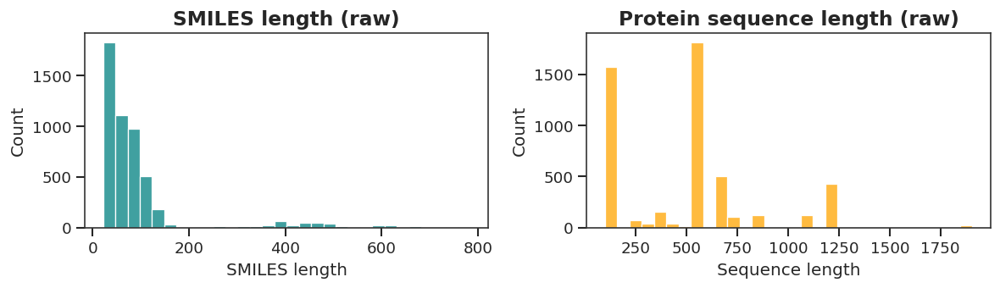

pretrain eps=0.1 epoch 1/15 train 0.9911 val 0.7005 best 0.7005
pretrain eps=0.1 epoch 2/15 train 0.8323 val 0.7649 best 0.7005
pretrain eps=0.1 epoch 3/15 train 0.7703 val 0.7193 best 0.7005
pretrain eps=0.1 epoch 4/15 train 0.7345 val 0.6616 best 0.6616
pretrain eps=0.1 epoch 5/15 train 0.7130 val 0.7103 best 0.6616
pretrain eps=0.1 epoch 6/15 train 0.7088 val 0.6421 best 0.6421
pretrain eps=0.1 epoch 7/15 train 0.6786 val 0.7110 best 0.6421
pretrain eps=0.1 epoch 8/15 train 0.6405 val 0.5643 best 0.5643
pretrain eps=0.1 epoch 9/15 train 0.6241 val 0.6131 best 0.5643
pretrain eps=0.1 epoch 10/15 train 0.6101 val 0.5646 best 0.5643
pretrain eps=0.1 epoch 11/15 train 0.6045 val 0.5304 best 0.5304
pretrain eps=0.1 epoch 12/15 train 0.5974 val 0.6612 best 0.5304
pretrain eps=0.1 epoch 13/15 train 0.5880 val 0.5326 best 0.5304
pretrain eps=0.1 epoch 14/15 train 0.5825 val 0.6536 best 0.5304
pretrain eps=0.1 epoch 15/15 train 0.5722 val 0.5184 best 0.5184
pretrain eps=0.2 epoch 1/15 train 

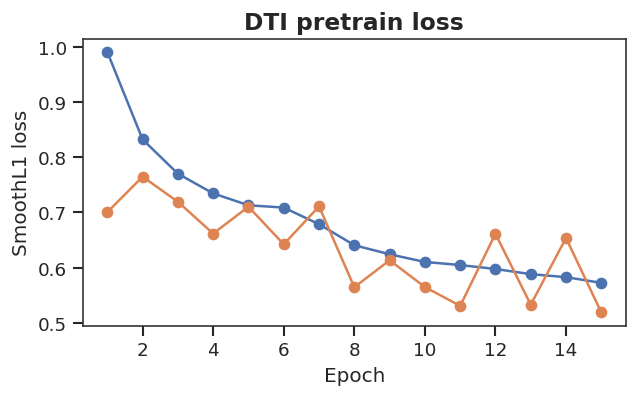

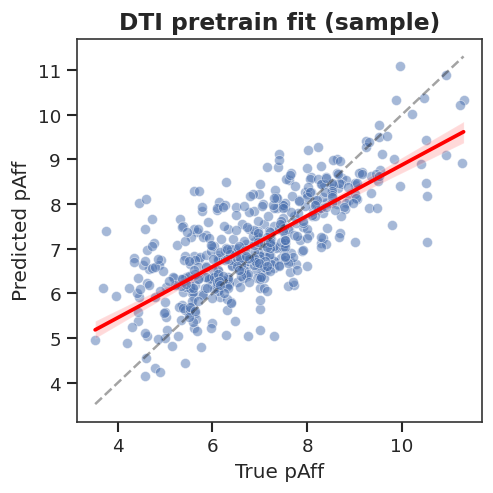

Saved DTI model: models/dti_transformer_bindingdb.pt


In [28]:
# DTI pretrain with FGSM sweep (CPU default; no truncation by default on CPU)
import gc

bindingdb_path = resolve_input_path('BindingDB_All.tsv', env_key='AM_BINDINGDB_TSV')

# Model hyperparams

dti_model_type = os.environ.get('AM_DTI_MODEL_TYPE', 'transformer').strip().lower()
if dti_model_type not in {'cnn', 'transformer'}:
    dti_model_type = 'transformer'

use_full_bindingdb = bool(int(os.environ.get('AM_DTI_USE_FULL', '0')))
max_rows = None if use_full_bindingdb else int(os.environ.get('AM_DTI_MAX_ROWS', '5000'))
chunk_size = int(os.environ.get('AM_DTI_CHUNK_SIZE', '200000'))

# Device (default: CPU)
dti_device_env = os.environ.get('AM_DTI_DEVICE', 'cpu').strip().lower()
if dti_device_env in {'cuda', 'gpu'} and torch.cuda.is_available():
    device = torch.device('cuda')
elif dti_device_env == 'auto' and torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

# Batch-size defaults (CPU transformer can be very memory-hungry without truncation)
if dti_model_type == 'transformer':
    default_batch = '8' if device.type == 'cpu' else '16'
else:
    default_batch = '32'
batch_size = int(os.environ.get('AM_DTI_BATCH_SIZE', default_batch))

embed_dim = 96 if dti_model_type == 'transformer' else 64
channels = int(os.environ.get('AM_DTI_CHANNELS', '128'))
hidden = int(os.environ.get('AM_DTI_HIDDEN', '256'))
pretrain_epochs = int(os.environ.get('AM_DTI_EPOCHS', '15'))

# Truncation
# - CPU default: no truncation (0 => disabled)
# - GPU default: truncation to avoid O(L^2) transformer memory
if device.type == 'cpu':
    default_smi_max = '0'
    default_seq_max = '0'
else:
    default_smi_max = '200'
    default_seq_max = '512' if dti_model_type == 'transformer' else '1024'

max_smi_len = int(os.environ.get('AM_DTI_MAX_SMI_LEN', default_smi_max))
max_seq_len = int(os.environ.get('AM_DTI_MAX_SEQ_LEN', default_seq_max))

use_amp = bool(int(os.environ.get('AM_DTI_AMP', '1'))) and device.type == 'cuda'
grad_accum = max(1, int(os.environ.get('AM_DTI_GRAD_ACCUM', '1')))


def _fmt_trunc(v: int) -> str:
    v = int(v)
    return 'none' if v <= 0 else str(v)


print(
    f"DTI device: {device} | model={dti_model_type} | amp={use_amp} | batch={batch_size} | grad_accum={grad_accum}"
)
print(f"DTI truncation: max_smi_len={_fmt_trunc(max_smi_len)} max_seq_len={_fmt_trunc(max_seq_len)}")

if device.type == 'cuda':
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")
    torch.backends.cudnn.benchmark = True

# Adversarial eps sweep
grid_env = os.environ.get('AM_DTI_ADV_EPS_GRID', '').strip()
if grid_env:
    adv_grid = [float(x) for x in grid_env.split(',') if x.strip()]
else:
    adv_grid = [
        float(x)
        for x in os.environ.get('AM_DTI_ADV_EPS_DEFAULT', '0.1,0.2,0.3').split(',')
        if x.strip()
    ]
adv_grid = [max(0.0, float(e)) for e in adv_grid]
print(f"Adv eps grid: {adv_grid}")

ligand_candidates = ["Ligand SMILES", "Ligand HET ID", "ligand_smiles", "smiles"]
seq_candidates = [f"BindingDB Target Chain Sequence {i}" for i in range(1, 8)] + [
    "Target Chain Sequence",
    "Target Sequence",
    "Sequence",
    "AA Sequence",
]
value_candidates = ["Ki (nM)", "Kd (nM)", "IC50 (nM)"]

dti_history = {"train_loss": [], "val_loss": []}


def _is_oom(err: Exception) -> bool:
    msg = str(err).lower()
    return ('out of memory' in msg) or ('cuda' in msg and 'oom' in msg)


if not bindingdb_path.exists():
    print(f"BindingDB file not found: {bindingdb_path}")
else:
    ligand_col = None
    target_col = None
    value_cols = None

    def choose_columns(cols, df):
        ligand = next((c for c in ligand_candidates if c in cols), None)
        targ = None
        best_nonnull = 0
        for c in seq_candidates:
            if c in cols:
                nn = int(df[c].notna().sum())
                if nn > best_nonnull:
                    best_nonnull = nn
                    targ = c
        vals = [c for c in value_candidates if c in cols]
        return ligand, targ, vals

    def compute_affinity(df, vals):
        for vc in vals:
            df[vc] = pd.to_numeric(df[vc], errors='coerce')

        def first_aff(row):
            for vc in vals:
                v = row.get(vc)
                if pd.notna(v) and v > 0:
                    return float(v)
            return None

        df['affinity_nM'] = df.apply(first_aff, axis=1)
        return df

    if use_full_bindingdb:
        bdb = pd.read_csv(bindingdb_path, sep='	', low_memory=False)
        ligand_col, target_col, value_cols = choose_columns(bdb.columns, bdb)
        if ligand_col is None or target_col is None:
            raise KeyError('Required SMILES/sequence columns not found in BindingDB')
        if not value_cols:
            raise ValueError('No Ki/Kd/IC50 columns found in BindingDB')
        bdb = compute_affinity(bdb, value_cols)
        bdb = bdb.dropna(subset=[ligand_col, target_col, 'affinity_nM'])
        bdb = bdb[bdb['affinity_nM'] > 0]
        if max_rows and len(bdb) > max_rows:
            bdb = bdb.sample(n=max_rows, random_state=RANDOM_STATE)
    else:
        collected = []
        for chunk in pd.read_csv(bindingdb_path, sep='	', low_memory=False, chunksize=chunk_size):
            if ligand_col is None:
                ligand_col, target_col, value_cols = choose_columns(chunk.columns, chunk)
                if ligand_col is None or target_col is None:
                    raise KeyError('Required SMILES/sequence columns not found in BindingDB')
                if not value_cols:
                    raise ValueError('No Ki/Kd/IC50 columns found in BindingDB')
            chunk = compute_affinity(chunk, value_cols)
            chunk = chunk.dropna(subset=[ligand_col, target_col, 'affinity_nM'])
            chunk = chunk[chunk['affinity_nM'] > 0]
            if not chunk.empty:
                collected.append(chunk[[ligand_col, target_col, 'affinity_nM']])
            total = sum(len(x) for x in collected)
            if max_rows and total >= max_rows:
                break
        if not collected:
            raise ValueError('No valid BindingDB rows collected')
        bdb = pd.concat(collected, ignore_index=True)
        if max_rows:
            bdb = bdb.head(max_rows)

    bdb['pAff'] = 9 - np.log10(bdb['affinity_nM'].astype(float))
    print(f"BindingDB samples: {len(bdb)} | cols: {ligand_col}, {target_col}")

    # pAff distribution
    fig, ax = plt.subplots(figsize=(5, 3), constrained_layout=True)
    sns.histplot(bdb['pAff'], bins=30, kde=True, color='steelblue', edgecolor='none', ax=ax)
    ax.set_title('BindingDB pAff distribution')
    ax.set_xlabel('pAff'); ax.set_ylabel('Count')
    clean_ax(ax)
    save_fig('bindingdb_paff_distribution', fig)
    plt.show()

    # SMILES / sequence length (raw)
    bdb['smi_len'] = bdb[ligand_col].astype(str).str.len()
    bdb['seq_len'] = bdb[target_col].astype(str).str.len()

    # Filter overly long SMILES for DTI pretraining
    DTI_SMI_LEN_FILTER_MAX = int(os.environ.get('AM_DTI_SMI_LEN_FILTER_MAX', '200'))
    _n_before = int(len(bdb))
    bdb = bdb[bdb['smi_len'] <= int(DTI_SMI_LEN_FILTER_MAX)].copy()
    _n_after = int(len(bdb))
    print(f'DTI filter: SMILES length ≤ {DTI_SMI_LEN_FILTER_MAX}: kept {_n_after}/{_n_before} ({(_n_after/max(1,_n_before))*100:.1f}%)')


    fig, axes = plt.subplots(1, 2, figsize=(10, 3))

    smi_len_plot = bdb['smi_len'] if max_smi_len <= 0 else bdb['smi_len'].clip(upper=int(max_smi_len) * 3)
    sns.histplot(smi_len_plot, bins=30, ax=axes[0], color='teal')
    axes[0].axvline(int(DTI_SMI_LEN_FILTER_MAX), ls='--', c='k', lw=1.0, alpha=0.35)
    if max_smi_len > 0:
        axes[0].axvline(max_smi_len, ls='--', c='k', lw=1.0, alpha=0.6)
    axes[0].set_title('SMILES length (post-filter)')
    axes[0].set_xlabel('SMILES length'); axes[0].set_ylabel('Count')

    seq_len_plot = bdb['seq_len'] if max_seq_len <= 0 else bdb['seq_len'].clip(upper=int(max_seq_len) * 3)
    sns.histplot(seq_len_plot, bins=30, ax=axes[1], color='orange')
    if max_seq_len > 0:
        axes[1].axvline(max_seq_len, ls='--', c='k', lw=1.0, alpha=0.6)
    axes[1].set_title('Protein sequence length (post-filter)')
    axes[1].set_xlabel('Sequence length'); axes[1].set_ylabel('Count')

    clean_ax(axes[0]); clean_ax(axes[1])
    plt.tight_layout(); save_fig('bindingdb_length_distributions', fig); plt.show()

    # Vocab (character-level)
    smi_stoi, _ = build_vocab(bdb[ligand_col], extra_tokens=['<pad>', '<unk>'])
    prot_stoi, _ = build_vocab(bdb[target_col], extra_tokens=['<pad>', '<unk>'])
    pad_ids = {'smi': smi_stoi['<pad>'], 'prot': prot_stoi['<pad>']}

    # Train/val split
    val_frac = float(np.clip(float(os.environ.get('AM_DTI_VAL_FRAC', '0.1')), 0.0, 0.5))
    bdb_train, bdb_val = train_test_split(bdb, test_size=val_frac, random_state=RANDOM_STATE)

    def make_loaders(df_train, df_val, bs, max_smi_len, max_seq_len):
        train_ds = PairDataset(
            df_train,
            smi_col=ligand_col,
            seq_col=target_col,
            y_col='pAff',
            smi_stoi=smi_stoi,
            seq_stoi=prot_stoi,
            pad_ids=pad_ids,
            max_smi_len=max_smi_len,
            max_seq_len=max_seq_len,
        )
        val_ds = PairDataset(
            df_val,
            smi_col=ligand_col,
            seq_col=target_col,
            y_col='pAff',
            smi_stoi=smi_stoi,
            seq_stoi=prot_stoi,
            pad_ids=pad_ids,
            max_smi_len=max_smi_len,
            max_seq_len=max_seq_len,
        )
        pin = device.type == 'cuda'
        train_loader = DataLoader(
            train_ds,
            batch_size=int(bs),
            shuffle=True,
            collate_fn=lambda x: collate_batch(x, pad_ids),
            pin_memory=pin,
        )
        val_loader = DataLoader(
            val_ds,
            batch_size=int(bs),
            shuffle=False,
            collate_fn=lambda x: collate_batch(x, pad_ids),
            pin_memory=pin,
        )
        return train_loader, val_loader

    def eval_loss(model, loader, loss_fn):
        if loader is None or len(loader.dataset) == 0:
            return float('nan')
        model.eval()
        running = 0.0
        with torch.no_grad():
            for batch in loader:
                smi_ids, smi_mask, prot_ids, prot_mask, yb = batch
                smi_ids, smi_mask = smi_ids.to(device), smi_mask.to(device)
                prot_ids, prot_mask = prot_ids.to(device), prot_mask.to(device)
                yb = yb.to(device)
                with torch.cuda.amp.autocast(enabled=use_amp):
                    preds = model(smi_ids, smi_mask, prot_ids, prot_mask)
                    loss = loss_fn(preds, yb)
                running += float(loss.item()) * len(yb)
        return running / max(1, len(loader.dataset))

    def train_epochs(model, train_loader, val_loader, epochs, adv_eps=0.0, tag='pretrain'):
        optim = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
        loss_fn = nn.SmoothL1Loss(beta=0.5)
        scaler = torch.cuda.amp.GradScaler(enabled=use_amp)

        tr_losses, va_losses = [], []
        best_val = float('inf')
        best_state = None
        patience = int(os.environ.get('AM_DTI_PATIENCE', '4'))
        min_epochs = int(os.environ.get('AM_DTI_MIN_EPOCHS', '5'))
        no_improve = 0

        for epoch in range(int(epochs)):
            model.train()
            running = 0.0
            optim.zero_grad(set_to_none=True)

            for step, batch in enumerate(train_loader, start=1):
                smi_ids, smi_mask, prot_ids, prot_mask, yb = batch
                smi_ids, smi_mask = smi_ids.to(device), smi_mask.to(device)
                prot_ids, prot_mask = prot_ids.to(device), prot_mask.to(device)
                yb = yb.to(device)

                with torch.cuda.amp.autocast(enabled=use_amp):
                    out = model(smi_ids, smi_mask, prot_ids, prot_mask, return_latent=bool(adv_eps > 0))
                    if isinstance(out, tuple) and len(out) >= 2:
                        preds, fused = out[0], out[1]
                    else:
                        preds, fused = out, None

                    loss = loss_fn(preds, yb)

                    if float(adv_eps) > 0 and fused is not None:
                        grad_fused = torch.autograd.grad(
                            loss,
                            fused,
                            retain_graph=True,
                            create_graph=False,
                            allow_unused=True,
                        )[0]
                        if grad_fused is not None:
                            fused_adv = fused + float(adv_eps) * grad_fused.sign()
                            preds_adv = model.head_forward(fused_adv)
                            loss = 0.5 * loss + 0.5 * loss_fn(preds_adv, yb)

                running += float(loss.item()) * len(yb)

                loss_step = loss / float(grad_accum)
                if use_amp:
                    scaler.scale(loss_step).backward()
                else:
                    loss_step.backward()

                if step % int(grad_accum) == 0:
                    if use_amp:
                        scaler.step(optim)
                        scaler.update()
                    else:
                        optim.step()
                    optim.zero_grad(set_to_none=True)

            # If the epoch ends with a partial accumulation window
            if (len(train_loader) % int(grad_accum)) != 0:
                if use_amp:
                    scaler.step(optim)
                    scaler.update()
                else:
                    optim.step()
                optim.zero_grad(set_to_none=True)

            tr = running / max(1, len(train_loader.dataset))
            va = eval_loss(model, val_loader, loss_fn)

            tr_losses.append(float(tr))
            va_losses.append(float(va))

            if va < best_val - 1e-4:
                best_val = float(va)
                best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
                no_improve = 0
            else:
                no_improve += 1

            print(f"{tag} eps={adv_eps} epoch {epoch+1}/{epochs} train {tr:.4f} val {va:.4f} best {best_val:.4f}")

            if (epoch + 1) >= int(min_epochs) and no_improve >= int(patience):
                print(f"{tag} early stop")
                break

        if best_state is not None:
            model.load_state_dict(best_state)

        return tr_losses, va_losses, best_val, best_state

    def train_with_oom_recovery(eps, bs, max_smi_len, max_seq_len):
        bs_eff = int(bs)
        smi_eff = int(max_smi_len)
        seq_eff = int(max_seq_len)

        while True:
            model = None
            try:
                if device.type == 'cuda':
                    torch.cuda.empty_cache()
                gc.collect()

                train_loader, val_loader = make_loaders(bdb_train, bdb_val, bs_eff, smi_eff, seq_eff)
                model = DTIModel(
                    len(smi_stoi),
                    len(prot_stoi),
                    embed_dim=embed_dim,
                    channels=channels,
                    hidden=hidden,
                    model_type=dti_model_type,
                ).to(device)

                tr_losses, va_losses, best_val, best_state = train_epochs(
                    model,
                    train_loader,
                    val_loader,
                    pretrain_epochs,
                    adv_eps=eps,
                    tag='pretrain',
                )

                del model
                if device.type == 'cuda':
                    torch.cuda.empty_cache()
                gc.collect()

                return tr_losses, va_losses, best_val, best_state, bs_eff, smi_eff, seq_eff

            except Exception as e:
                if model is not None:
                    try:
                        del model
                    except Exception:
                        pass

                if device.type == 'cuda':
                    torch.cuda.empty_cache()
                gc.collect()

                if device.type == 'cuda' and _is_oom(e):
                    print(f"OOM for eps={eps} with batch={bs_eff} max_seq_len={seq_eff}. Reducing...")
                    if bs_eff > 2:
                        bs_eff = max(2, bs_eff // 2)
                        continue
                    if seq_eff > 256:
                        seq_eff = max(256, seq_eff // 2)
                        continue

                raise

    # Sweep eps grid
    best_record = None

    bs_eff = int(batch_size)
    smi_eff = int(max_smi_len)
    seq_eff = int(max_seq_len)

    for eps in adv_grid:
        tr_losses, va_losses, best_val, best_state, bs_eff, smi_eff, seq_eff = train_with_oom_recovery(
            eps,
            bs_eff,
            smi_eff,
            seq_eff,
        )

        if best_record is None or best_val < best_record['best_val']:
            best_record = {
                'eps': float(eps),
                'best_val': float(best_val),
                'train_loss': tr_losses,
                'val_loss': va_losses,
                'state': best_state,
                'batch_size': int(bs_eff),
                'max_smi_len': int(smi_eff),
                'max_seq_len': int(seq_eff),
            }

    # Use best model
    dti_history['train_loss'] = best_record['train_loss']
    dti_history['val_loss'] = best_record['val_loss']
    best_eps = float(best_record['eps'])

    batch_size = int(best_record['batch_size'])
    max_smi_len = int(best_record['max_smi_len'])
    max_seq_len = int(best_record['max_seq_len'])

    print(f"Best eps={best_eps} val_loss={best_record['best_val']:.4f} | batch={batch_size} max_seq_len={_fmt_trunc(max_seq_len)}")

    best_model = DTIModel(
        len(smi_stoi),
        len(prot_stoi),
        embed_dim=embed_dim,
        channels=channels,
        hidden=hidden,
        model_type=dti_model_type,
    ).to(device)
    best_model.load_state_dict(best_record['state'])

    # Loss curve (best)
    fig, ax = plt.subplots(figsize=(6.4, 3.2))
    ep = np.arange(1, len(dti_history['train_loss']) + 1)
    ax.plot(ep, dti_history['train_loss'], marker='o', label=f'Train (eps={best_eps:g})')
    ax.plot(ep, dti_history['val_loss'], marker='o', label=f'Val (eps={best_eps:g})')
    ax.set_title('DTI pretrain loss')
    ax.set_xlabel('Epoch'); ax.set_ylabel('SmoothL1 loss')
    legend_outside(ax, loc='center left', bbox_to_anchor=(1.02, 0.5))
    fig.subplots_adjust(right=0.78)
    clean_ax(ax)
    save_fig('dti_pretrain_loss', fig)
    plt.show()

    # Quick fit check on a random sample
    sample_df = bdb.sample(n=min(512, len(bdb)), random_state=RANDOM_STATE)
    sample_ds = PairDataset(
        sample_df,
        smi_col=ligand_col,
        seq_col=target_col,
        y_col='pAff',
        smi_stoi=smi_stoi,
        seq_stoi=prot_stoi,
        pad_ids=pad_ids,
        max_smi_len=max_smi_len,
        max_seq_len=max_seq_len,
    )
    pin = device.type == 'cuda'
    sample_loader = DataLoader(
        sample_ds,
        batch_size=64,
        shuffle=False,
        collate_fn=lambda x: collate_batch(x, pad_ids),
        pin_memory=pin,
    )

    preds, trues = [], []
    best_model.eval()
    with torch.no_grad():
        for batch in sample_loader:
            smi_ids, smi_mask, prot_ids, prot_mask, yb = batch
            smi_ids, smi_mask = smi_ids.to(device), smi_mask.to(device)
            prot_ids, prot_mask = prot_ids.to(device), prot_mask.to(device)
            yb = yb.to(device)
            with torch.cuda.amp.autocast(enabled=use_amp):
                out = best_model(smi_ids, smi_mask, prot_ids, prot_mask)
            preds.extend(out.detach().cpu().numpy().tolist())
            trues.extend(yb.detach().cpu().numpy().tolist())

    preds = np.array(preds); trues = np.array(trues)
    from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
    r2 = float(r2_score(trues, preds)) if (len(trues) > 1 and float(np.std(trues)) > 0) else float('nan')
    mae = float(mean_absolute_error(trues, preds)) if len(trues) > 0 else float('nan')
    mse = float(mean_squared_error(trues, preds)) if len(trues) > 0 else float('nan')
    print(f"DTI pretrain fit (sample): R2={r2:.3f} MAE={mae:.3f} MSE={mse:.3f}")
    fig, ax = plt.subplots(figsize=(4, 4), constrained_layout=True)
    sns.scatterplot(x=trues, y=preds, alpha=0.5, ax=ax)
    sns.regplot(x=trues, y=preds, scatter=False, color='red', ax=ax)
    lims = [min(trues.min(), preds.min()), max(trues.max(), preds.max())]
    ax.plot(lims, lims, 'k--', alpha=0.4)
    ax.set_xlabel('True pAff'); ax.set_ylabel('Predicted pAff')
    ax.set_title('DTI pretrain fit (sample)')
    metrics_txt = f"R2={r2:.3f}\nMAE={mae:.3f}\nMSE={mse:.3f}"
    ax.text(0.05, 0.95, metrics_txt, transform=ax.transAxes, va='top', ha='left', fontsize=10, bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='0.8', alpha=0.9))
    clean_ax(ax)
    save_fig('dti_pretrain_fit_sample', fig)
    plt.show()

    # Save artifact (canonical filename for downstream cells)
    pretrain_path = cfg.models_dir / f"dti_{dti_model_type}_bindingdb.pt"
    torch.save({
        'state_dict': best_record['state'],
        'smi_stoi': smi_stoi,
        'prot_stoi': prot_stoi,
        'pad_ids': pad_ids,
        'model_type': dti_model_type,
        'embed_dim': embed_dim,
        'channels': channels,
        'hidden': hidden,
        'ligand_col': ligand_col,
        'target_col': target_col,
        'adv_eps': best_eps,
        'batch_size': batch_size,
        'max_smi_len': max_smi_len,
        'max_seq_len': max_seq_len,
        'use_amp': bool(use_amp),
        'grad_accum': int(grad_accum),
    }, pretrain_path)
    print(f"Saved DTI model: {pretrain_path}")


### Affinity fingerprinting

Compute predicted affinity fingerprints against a panel of user-provided target sequences.


In [29]:
def load_fasta(path, max_targets=None):
    ids, seqs = [], []
    if not path.exists():
        return ids, seqs
    try:
        max_targets_i = int(max_targets) if max_targets is not None else None
    except Exception:
        max_targets_i = None
    if max_targets_i is not None and max_targets_i <= 0:
        max_targets_i = None
    with path.open() as f:
        current_id, current_seq = None, []
        for line in f:
            line = line.strip()
            if not line:
                continue
            if line.startswith(">"):
                if current_id and current_seq:
                    ids.append(current_id)
                    seqs.append("".join(current_seq))
                    if max_targets_i is not None and len(ids) >= max_targets_i:
                        break
                current_id = line[1:].split()[0]
                current_seq = []
            else:
                current_seq.append(line)
        if current_id and current_seq and (max_targets_i is None or len(ids) < max_targets_i):
            ids.append(current_id)
            seqs.append("".join(current_seq))
    return ids, seqs


def predict_pair_affinity(model, smi, seq, smi_stoi, prot_stoi, pad_ids, device):
    model.eval()
    with torch.no_grad():
        smi_ids = torch.tensor([tokenize(smi, smi_stoi)], dtype=torch.long, device=device)
        prot_ids = torch.tensor([tokenize(seq, prot_stoi)], dtype=torch.long, device=device)
        smi_mask = (smi_ids != pad_ids["smi"]).float()
        prot_mask = (prot_ids != pad_ids["prot"]).float()
        pred = model(smi_ids, smi_mask, prot_ids, prot_mask)
    return float(pred.item())


def build_model_from_artifact(artifact, device):
    model = DTIModel(
        len(artifact["smi_stoi"]),
        len(artifact["prot_stoi"]),
        embed_dim=artifact.get("embed_dim", 64),
        channels=artifact.get("channels", 128),
        hidden=artifact.get("hidden", 256),
        model_type=artifact.get("model_type", "cnn"),
    )
    model.load_state_dict(artifact["state_dict"])
    return model.to(device)


def load_dti_artifact():
    candidates = sorted(cfg.models_dir.glob('dti_*_bindingdb.pt'))
    if not candidates:
        return None, None
    pretrain_path = candidates[-1]
    artifact = torch.load(pretrain_path, map_location='cpu')
    return artifact, pretrain_path


artifact, dti_path = load_dti_artifact()
if artifact is None:
    print("DTI model artifact not found under models/ (dti_*_bindingdb.pt).")
elif "isoc_clustered" not in globals():
    print("Missing isocyanates descriptors/clusters (isoc_clustered).")
else:
    dti_device = os.environ.get('AM_DTI_DEVICE', 'cpu').strip().lower()
    device = torch.device('cuda' if (dti_device in {'cuda', 'gpu', 'auto'} and torch.cuda.is_available()) else 'cpu')
    dti_model = build_model_from_artifact(artifact, device)
    smi_stoi = artifact["smi_stoi"]
    prot_stoi = artifact["prot_stoi"]
    pad_ids = artifact["pad_ids"]

    try:
        fasta_path = resolve_input_path('asthma_human.fasta', env_key='AM_ASTHMA_FASTA')
    except Exception:
        fasta_path = resolve_input_path('target_protein_sequences.fasta', env_key='AM_TARGET_FASTA')
    max_targets = int(os.environ.get('AM_DTI_MAX_TARGETS', '0'))  # 0 => all
    tgt_ids, tgt_seqs = load_fasta(fasta_path, max_targets=max_targets)
    if not tgt_ids:
        print(f"No target sequences found at {fasta_path}; skipping affinity prediction.")
    else:
        print(f"Loaded target sequences: {len(tgt_ids)} from {fasta_path}")
        iso_candidates = isoc_clustered.copy()
        mode = os.environ.get('AM_DTI_FILTER', 'all').strip().lower()
        risk_thr = float(os.environ.get('AM_ASTHMA_RISK_THRESHOLD', '0.6'))

        access_col = None
        if 'cell_access_any_pred' in iso_candidates.columns:
            access_col = 'cell_access_any_pred'
        if 'cell_access_any_screen' in iso_candidates.columns:
            # Prefer strict access when it selects at least one compound; otherwise fall back to screen.
            strict_n = int(iso_candidates.get('cell_access_any_pred', pd.Series(dtype=float)).fillna(0).astype(int).sum())
            access_col = 'cell_access_any_pred' if strict_n > 0 else 'cell_access_any_screen'

        if mode in {'filtered', 'risk_and_access'}:
            if 'asthma_risk_proba' in iso_candidates.columns:
                iso_candidates = iso_candidates[iso_candidates['asthma_risk_proba'] >= risk_thr]
            if access_col is not None:
                iso_candidates = iso_candidates[iso_candidates[access_col] == 1]
        elif mode == 'risk':
            if 'asthma_risk_proba' in iso_candidates.columns:
                iso_candidates = iso_candidates[iso_candidates['asthma_risk_proba'] >= risk_thr]
        elif mode == 'access':
            if access_col is not None:
                iso_candidates = iso_candidates[iso_candidates[access_col] == 1]
        elif mode == 'all':
            pass
        else:
            raise ValueError(f"Unknown AM_DTI_FILTER={mode!r} (use: all|risk|access|filtered)")

        if iso_candidates.empty:
            iso_candidates = isoc_clustered.copy()

        max_compounds = int(os.environ.get('AM_DTI_MAX_COMPOUNDS', '0'))
        if max_compounds > 0:
            if 'asthma_risk_proba' in iso_candidates.columns:
                iso_candidates = iso_candidates.sort_values('asthma_risk_proba', ascending=False)
            iso_candidates = iso_candidates.head(max_compounds)

        iso_candidates = iso_candidates.dropna(subset=['SMILES']).reset_index(drop=True)

        records = []
        for _, row in tqdm(iso_candidates.iterrows(), total=len(iso_candidates), desc="Affinity prediction", leave=False):
            smi = row["SMILES"]
            for tid, tseq in zip(tgt_ids, tgt_seqs):
                score = predict_pair_affinity(dti_model, smi, tseq, smi_stoi, prot_stoi, pad_ids, device)
                name = row.get('compound_name', None)
                if not isinstance(name, str) or not name.strip():
                    name = row.get('pubchem_name', None)
                if not isinstance(name, str) or not name.strip():
                    name = 'Unknown'
                records.append({
                    "SMILES": smi,
                    "compound_name": name,
                    "target_id": tid,
                    "pred_pAff": score,
                })

        aff_df = pd.DataFrame(records)
        print(aff_df.head())
        aff_path = cfg.results_dir / "isocyanates_affinity_fingerprint.csv"
        aff_df.to_csv(aff_path, index=False)
        print(f"Saved affinity fingerprint: {aff_path}")


Loaded target sequences: 419 from asthma_human.fasta


Affinity prediction:   0%|          | 0/308 [00:00<?, ?it/s]

            SMILES              compound_name              target_id  \
0  O=C=NS(=O)(=O)F  Fluorosulfonyl isocyanate  sp|A5D8V7|ODAD3_HUMAN   
1  O=C=NS(=O)(=O)F  Fluorosulfonyl isocyanate  sp|O00175|CCL24_HUMAN   
2  O=C=NS(=O)(=O)F  Fluorosulfonyl isocyanate  sp|O00626|CCL22_HUMAN   
3  O=C=NS(=O)(=O)F  Fluorosulfonyl isocyanate    sp|P00813|ADA_HUMAN   
4  O=C=NS(=O)(=O)F  Fluorosulfonyl isocyanate   sp|P01042|KNG1_HUMAN   

   pred_pAff  
0   6.095578  
1   7.593153  
2   7.830321  
3   6.017704  
4   6.469165  
Saved affinity fingerprint: results/isocyanates_affinity_fingerprint.csv


Affinity records: 129052


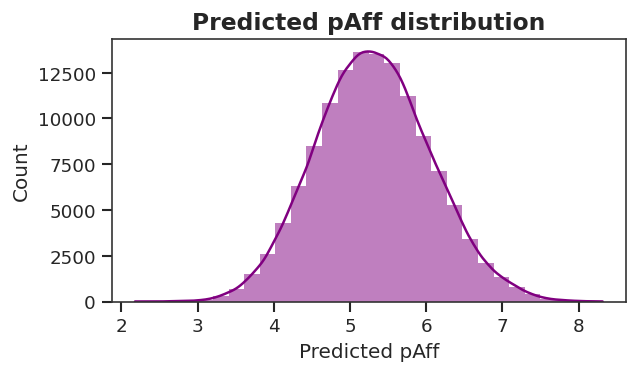

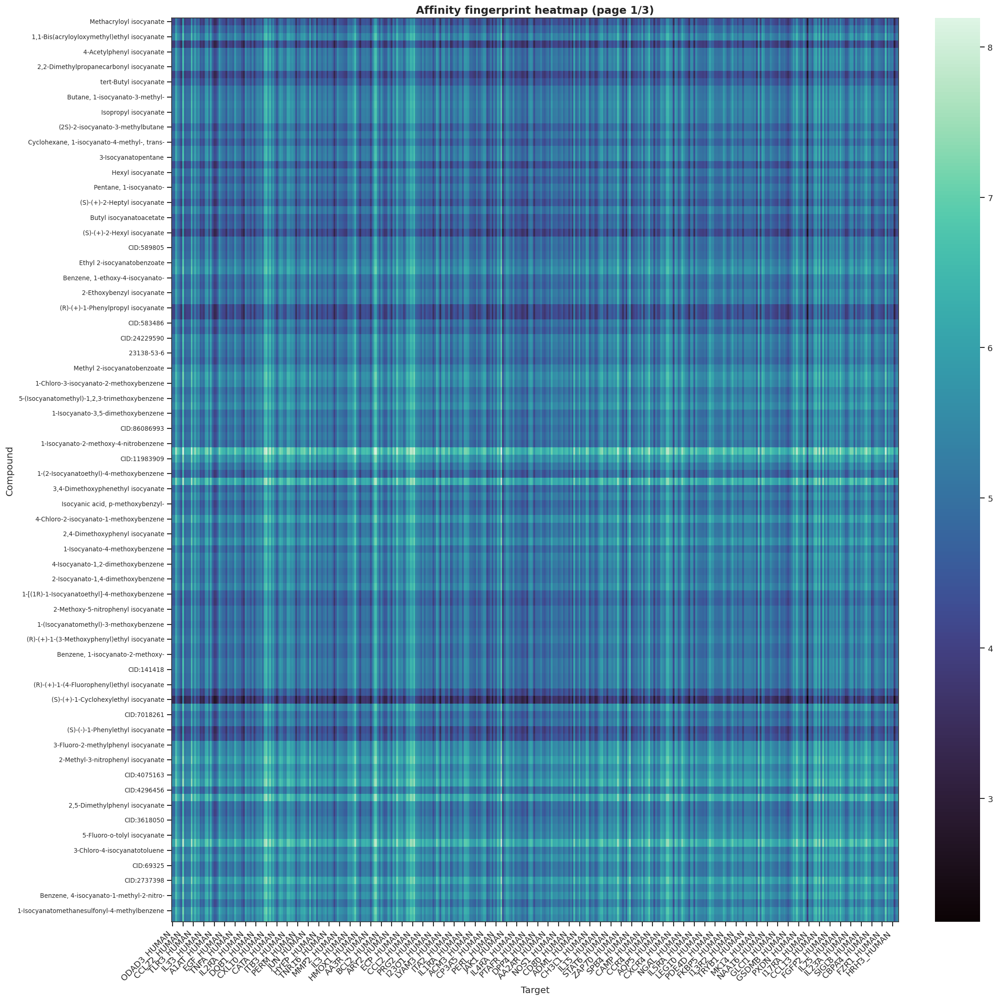

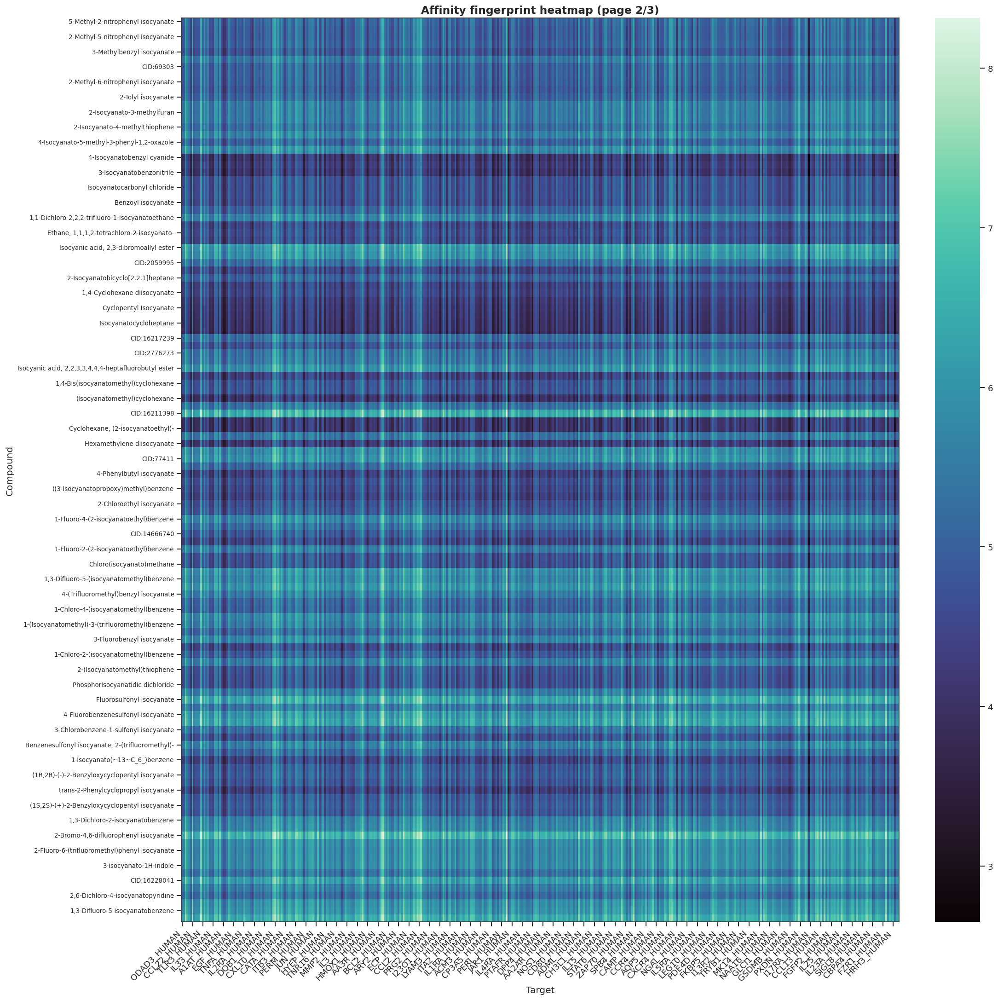

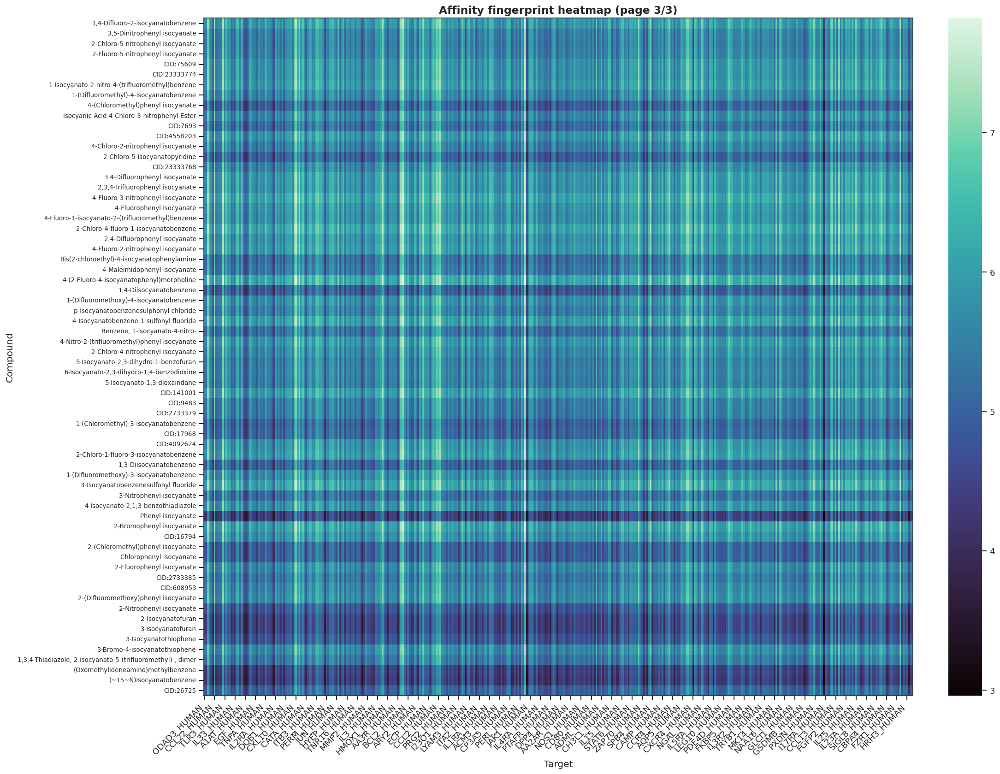

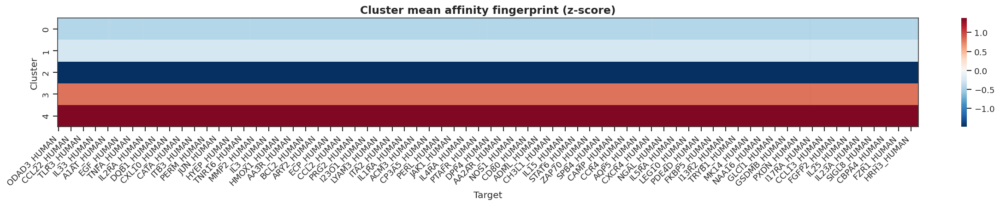

In [30]:
# Affinity fingerprint plots
if 'aff_df' in globals() and isinstance(aff_df, pd.DataFrame) and (not aff_df.empty):
    print(f"Affinity records: {len(aff_df)}")

    # Distribution of predicted affinities
    fig, ax = plt.subplots(figsize=(5.2, 3.0), constrained_layout=True)
    sns.histplot(aff_df['pred_pAff'], bins=30, kde=True, color='purple', edgecolor='none', ax=ax)
    ax.set_title('Predicted pAff distribution')
    ax.set_xlabel('Predicted pAff')
    ax.set_ylabel('Count')
    clean_ax(ax)
    save_fig('affinity_pred_paff_distribution', fig)
    plt.show()

    # Heatmap for all compounds vs targets
    pivot_raw = aff_df.pivot_table(index='SMILES', columns='target_id', values='pred_pAff', aggfunc='mean')

    # Target labels
    target_label_map = {c: str(c).split('|')[-1] for c in pivot_raw.columns}
    pivot = pivot_raw.rename(columns=target_label_map)

    # SMILES -> unique compound-name labels
    name_by_smi = aff_df.groupby('SMILES', as_index=True)['compound_name'].first().fillna('Unknown')
    uniq_labels = make_unique_labels(name_by_smi.astype(str).tolist())
    smi_to_label = dict(zip(name_by_smi.index.tolist(), uniq_labels))
    pivot = pivot.rename(index=smi_to_label)

    # Page heatmap when too many rows
    rows_per_page = int(os.environ.get('AM_AFF_HEATMAP_ROWS_PER_PAGE', '120'))
    rows_per_page = max(30, rows_per_page)

    def _plot_heatmap(df_page, title, fname):
        fig_w = max(8.0, min(18.0, 0.9 * df_page.shape[1] + 5.0))
        fig_h = max(5.0, 0.18 * len(df_page) + 2.0)
        fig_h = min(fig_h, 18.0)
        fig, ax = plt.subplots(figsize=(fig_w, fig_h), constrained_layout=True)
        sns.heatmap(df_page, cmap='mako', annot=False, ax=ax)
        ax.set_title(title)
        ax.set_xlabel('Target')
        ax.set_ylabel('Compound')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        ax.tick_params(axis='y', labelsize=8)
        for spine in ax.spines.values():
            spine.set_visible(True)
        save_fig(fname, fig)
        plt.show()

    if len(pivot) > rows_per_page:
        n_pages = int((len(pivot) + rows_per_page - 1) // rows_per_page)
        for p in range(n_pages):
            a = p * rows_per_page
            b = min(len(pivot), (p + 1) * rows_per_page)
            df_page = pivot.iloc[a:b]
            _plot_heatmap(df_page, f'Affinity fingerprint heatmap (page {p+1}/{n_pages})', f'affinity_fingerprint_heatmap_all_page{p+1:02d}')
    else:
        _plot_heatmap(pivot, 'Affinity fingerprint heatmap (all compounds)', 'affinity_fingerprint_heatmap_all')

    # Cluster-level mean affinity heatmap (if cluster labels exist)
    if 'isoc_clustered' in globals() and 'cluster_km' in isoc_clustered.columns:
        smi_to_cluster = dict(isoc_clustered.drop_duplicates('SMILES').set_index('SMILES')['cluster_km'])
        tmp = pivot_raw.copy()
        tmp['cluster'] = [smi_to_cluster.get(smi, np.nan) for smi in tmp.index]
        tmp = tmp.dropna(subset=['cluster'])
        if not tmp.empty:
            cl = tmp.groupby('cluster').mean(numeric_only=True)
            cl = cl.rename(columns=target_label_map)
            # z-score by target for pattern visibility
            cl_z = (cl - cl.mean()) / cl.std(ddof=0).replace(0, np.nan)
            fig_w = max(7.0, min(18.0, 0.9 * cl_z.shape[1] + 4.0))
            fig, ax = plt.subplots(figsize=(fig_w, 3.6), constrained_layout=True)
            sns.heatmap(cl_z, cmap='RdBu_r', center=0.0, annot=False, ax=ax)
            ax.set_title('Cluster mean affinity fingerprint (z-score)')
            ax.set_xlabel('Target')
            ax.set_ylabel('Cluster')
            ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
            for spine in ax.spines.values():
                spine.set_visible(True)
            save_fig('affinity_cluster_mean_heatmap', fig)
            plt.show()
else:
    print('Run affinity prediction cell first.')


Affinity matrix: 306 compounds × 418 targets


/tmp/ipykernel_412593/78745305.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


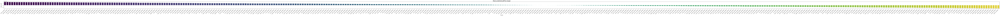

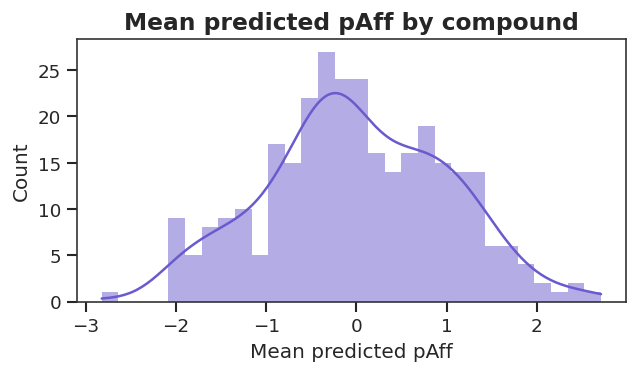

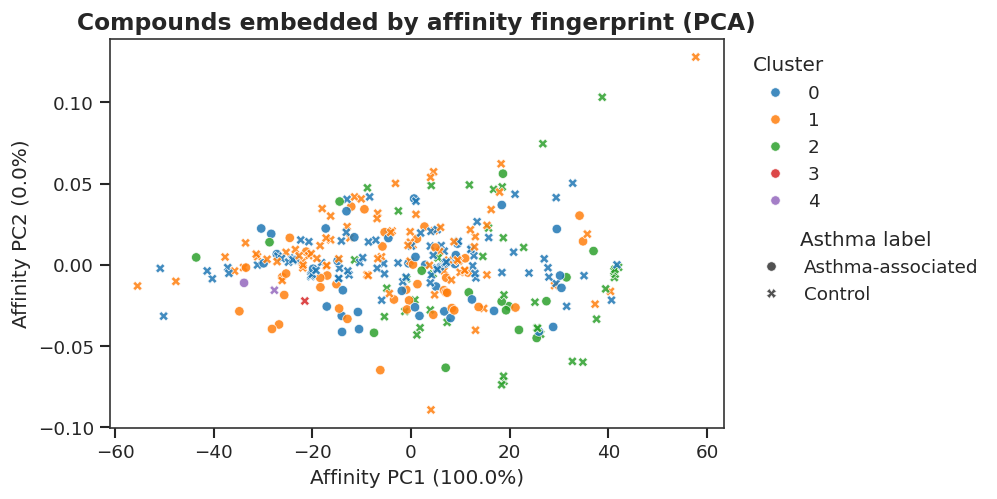

/home/xuchengjie/miniconda3/envs/AM_MOF/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


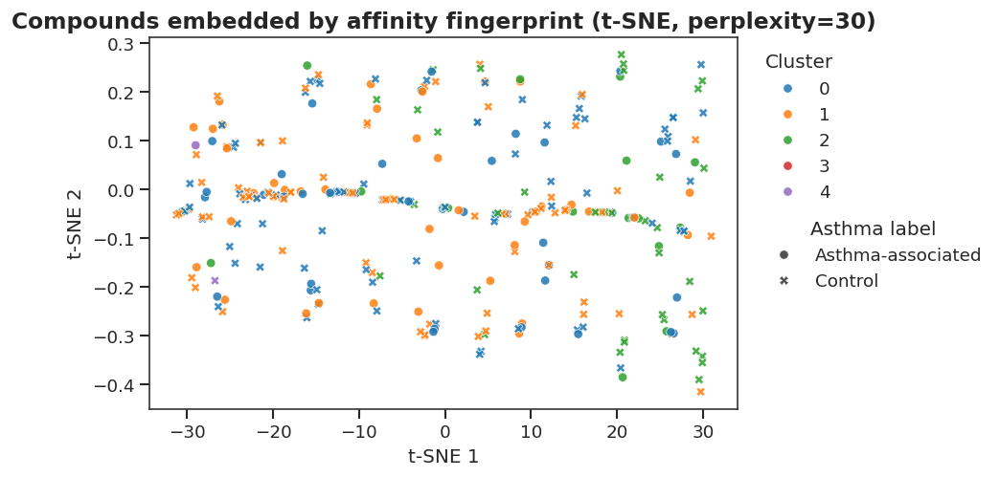

In [31]:
# More affinity fingerprint visualizations
if 'aff_df' not in globals() or (not isinstance(aff_df, pd.DataFrame)) or aff_df.empty:
    print('Run affinity prediction cell first.')
else:
    pivot_raw = aff_df.pivot_table(index='SMILES', columns='target_id', values='pred_pAff', aggfunc='mean')

    # Fill missing (target-wise mean), drop near-constant targets
    pivot = pivot_raw.apply(lambda c: c.fillna(c.mean()), axis=0)
    col_std = pivot.std(ddof=0)
    pivot = pivot.loc[:, col_std > 1e-8]

    if pivot.shape[1] >= 2:
        pivot = (pivot - pivot.mean()) / pivot.std(ddof=0)
    pivot = pivot.apply(lambda c: c.fillna(c.mean()), axis=0)

    X_aff = pivot.values
    n_samples, n_features = X_aff.shape
    print(f'Affinity matrix: {n_samples} compounds × {n_features} targets')

    # Mean affinity by target
    tgt_mean = pivot.mean().sort_values(ascending=False)
    tgt_mean_short = tgt_mean.copy()
    tgt_mean_short.index = [str(x).split('|')[-1] for x in tgt_mean_short.index]

    fig_w = max(6.0, 0.45 * len(tgt_mean_short) + 2.0)
    fig, ax = plt.subplots(figsize=(fig_w, 3.0), constrained_layout=True)
    sns.barplot(x=tgt_mean_short.index, y=tgt_mean_short.values, hue=tgt_mean_short.index, palette='viridis', legend=False, ax=ax)
    ax.set_title('Mean predicted pAff by target')
    ax.set_xlabel('Target')
    ax.set_ylabel('Mean pAff')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    clean_ax(ax)
    save_fig('affinity_mean_by_target', fig)
    plt.show()

    # Mean affinity by compound
    comp_mean = pivot.mean(axis=1).sort_values(ascending=False)
    fig, ax = plt.subplots(figsize=(5.2, 3.0), constrained_layout=True)
    sns.histplot(comp_mean.values, bins=30, kde=True, color='slateblue', edgecolor='none', ax=ax)
    ax.set_title('Mean predicted pAff by compound')
    ax.set_xlabel('Mean predicted pAff')
    ax.set_ylabel('Count')
    clean_ax(ax)
    save_fig('affinity_mean_by_compound_distribution', fig)
    plt.show()

    # Embedding of compounds in affinity space
    if n_samples < 2:
        print(f'Affinity embedding skipped: need >=2 compounds (got {n_samples}).')
    elif n_features < 2:
        fig, ax = plt.subplots(figsize=(6.2, 3.2), constrained_layout=True)
        sns.histplot(X_aff[:, 0].astype(float), bins=30, color='teal', edgecolor='none', ax=ax)
        ax.set_title('Affinity fingerprint (single target)')
        ax.set_xlabel('Predicted pAff')
        ax.set_ylabel('Count')
        clean_ax(ax)
        save_fig('affinity_single_target_distribution', fig)
        plt.show()
    else:
        from sklearn.decomposition import PCA
        from sklearn.manifold import TSNE

        # Meta join
        meta = None
        if 'isoc_clustered' in globals():
            meta = isoc_clustered.drop_duplicates('SMILES').copy()
            if 'asthma_risk_label' not in meta.columns and 'asthma_risk_proba' in meta.columns:
                thr = float(globals().get('asthma_threshold', 0.6))
                meta['asthma_risk_label'] = np.where(meta['asthma_risk_proba'] >= thr, 'Asthma-associated', 'Control')

        # 2D PCA (absolute)
        pca_aff = PCA(n_components=2, random_state=RANDOM_STATE)
        emb = pca_aff.fit_transform(X_aff)
        emb_df = pd.DataFrame({'PC1': emb[:, 0], 'PC2': emb[:, 1], 'SMILES': pivot.index})
        if meta is not None:
            cols = [c for c in ['SMILES', 'compound_name', 'cluster_km', 'asthma_risk_label'] if c in meta.columns]
            if len(cols) > 1:
                emb_df = emb_df.merge(meta[cols], on='SMILES', how='left')

        fig, ax = plt.subplots(figsize=(8.6, 4.2))
        fig.subplots_adjust(right=0.72)
        sns.scatterplot(
            data=emb_df,
            x='PC1',
            y='PC2',
            hue='cluster_km' if 'cluster_km' in emb_df.columns else None,
            style='asthma_risk_label' if 'asthma_risk_label' in emb_df.columns else None,
            palette=globals().get('CLUSTER_PALETTE', 'mako'),
            alpha=0.85,
            s=32,
            ax=ax,
        )
        ax.set_title('Compounds embedded by affinity fingerprint (PCA)')
        ax.set_xlabel(f"Affinity PC1 ({pca_aff.explained_variance_ratio_[0]*100:.1f}%)")
        ax.set_ylabel(f"Affinity PC2 ({pca_aff.explained_variance_ratio_[1]*100:.1f}%)")

        # Legend outside
        leg = ax.get_legend()
        if leg is not None:
            handles, labels = ax.get_legend_handles_labels()
            ax.legend_.remove()
            if 'cluster_km' in labels and 'asthma_risk_label' in labels:
                i0 = labels.index('cluster_km')
                i1 = labels.index('asthma_risk_label')
                cl_h = handles[i0 + 1:i1]
                cl_l = labels[i0 + 1:i1]
                lb_h = handles[i1 + 1:]
                lb_l = labels[i1 + 1:]
                leg1 = ax.legend(cl_h, cl_l, title='Cluster', loc='upper left', bbox_to_anchor=(1.02, 1.0), frameon=False)
                ax.add_artist(leg1)
                ax.legend(lb_h, lb_l, title='Asthma label', loc='upper left', bbox_to_anchor=(1.02, 0.55), frameon=False)
            else:
                ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1.0), frameon=False)

        clean_ax(ax)
        save_fig('affinity_embedding_pca', fig)
        plt.show()

        # Optional: t-SNE (pattern focus)
        try:
            perplexity = int(min(30, max(5, (n_samples - 1) // 3)))
            tsne = TSNE(n_components=2, perplexity=perplexity, init='pca', learning_rate='auto', random_state=RANDOM_STATE)
            emb_tsne = tsne.fit_transform(X_aff)
            tsne_df = emb_df.copy()
            tsne_df['T1'] = emb_tsne[:, 0]
            tsne_df['T2'] = emb_tsne[:, 1]

            fig, ax = plt.subplots(figsize=(8.6, 4.2))
            fig.subplots_adjust(right=0.72)
            sns.scatterplot(
                data=tsne_df,
                x='T1',
                y='T2',
                hue='cluster_km' if 'cluster_km' in tsne_df.columns else None,
                style='asthma_risk_label' if 'asthma_risk_label' in tsne_df.columns else None,
                palette=globals().get('CLUSTER_PALETTE', 'mako'),
                alpha=0.85,
                s=32,
                ax=ax,
            )

            leg = ax.get_legend()
            if leg is not None:
                handles, labels = ax.get_legend_handles_labels()
                ax.legend_.remove()
                if 'cluster_km' in labels and 'asthma_risk_label' in labels:
                    i0 = labels.index('cluster_km')
                    i1 = labels.index('asthma_risk_label')
                    cl_h = handles[i0 + 1:i1]
                    cl_l = labels[i0 + 1:i1]
                    lb_h = handles[i1 + 1:]
                    lb_l = labels[i1 + 1:]
                    leg1 = ax.legend(cl_h, cl_l, title='Cluster', loc='upper left', bbox_to_anchor=(1.02, 1.0), frameon=False)
                    ax.add_artist(leg1)
                    ax.legend(lb_h, lb_l, title='Asthma label', loc='upper left', bbox_to_anchor=(1.02, 0.55), frameon=False)
                else:
                    ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1.0), frameon=False)

            ax.set_title(f'Compounds embedded by affinity fingerprint (t-SNE, perplexity={perplexity})')
            ax.set_xlabel('t-SNE 1')
            ax.set_ylabel('t-SNE 2')
            clean_ax(ax)
            save_fig('affinity_embedding_tsne', fig)
            plt.show()
        except Exception as e:
            print(f't-SNE embedding skipped: {e}')


### PubChem GHS query (optional): H334 / H335

Query PubChem PUG-View for GHS Classification and extract H334/H335 flags.


Saved PubChem GHS annotations: results/isocyanates_ghs_pubchem.csv


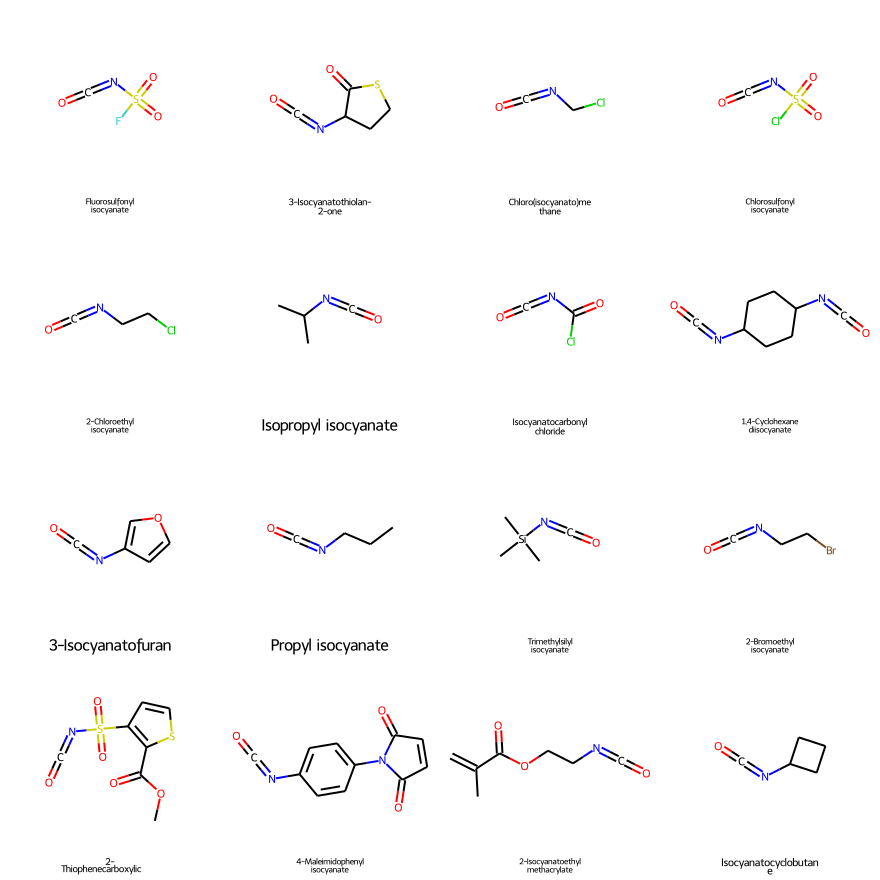

In [32]:
from IPython.display import display, HTML
from rdkit.Chem import Draw


def get_molecule_info(smiles: str):
    # Fetch basic compound metadata from PubChem (name/formula/mass/depiction)
    if not smiles:
        return None
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None
    info = {
        'pubchem_name': 'Unknown',
        'formula': rdMolDescriptors.CalcMolFormula(mol),
        'mol_weight': Descriptors.ExactMolWt(mol),
        'image': Draw.MolToImage(mol, size=(250, 250)),
    }
    try:
        url = 'https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/smiles/property/Title/JSON'
        resp = requests.post(url, data={'smiles': smiles}, timeout=10)
        if resp.status_code == 200:
            data = resp.json()
            props = data.get('PropertyTable', {}).get('Properties', [])
            if props:
                info['pubchem_name'] = props[0].get('Title', info['pubchem_name'])
    except Exception as e:
        if bool(int(os.environ.get('AM_PUBCHEM_VERBOSE', '0'))):
            print(f'PubChem Title request warning: {e}')
    return info


def pubchem_cid_from_smiles(smiles: str):
    # Prefer PubChemPy; fallback to PUG REST on failure
    try:
        comps = pcp.get_compounds(smiles, 'smiles')
        if comps:
            return comps[0].cid
    except Exception:
        pass

    try:
        url = 'https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/smiles/cids/JSON'
        r = requests.post(url, data={'smiles': smiles}, timeout=10)
        if r.status_code == 200:
            return r.json().get('IdentifierList', {}).get('CID', [None])[0]
    except Exception as e:
        if bool(int(os.environ.get('AM_PUBCHEM_VERBOSE', '0'))):
            print(f'PubChem CID fallback failed: {e}')
    return None


PUBCHEM_VERBOSE = bool(int(os.environ.get('AM_PUBCHEM_VERBOSE', '0')))
PUBCHEM_CACHE: dict[tuple[int, str], dict | None] = {}


def _fetch_pubchem_section(cid: int, heading: str, timeout: float = 30.0):
    # Fetch a specific section from PubChem PUG-View.
    # Many compounds legitimately do not have a requested heading; 404/400 is treated as missing.
    from urllib.parse import quote

    key = (int(cid), str(heading))
    if key in PUBCHEM_CACHE:
        return PUBCHEM_CACHE[key]

    heading_q = quote(str(heading), safe='%')
    url = f'https://pubchem.ncbi.nlm.nih.gov/rest/pug_view/data/compound/{int(cid)}/JSON?heading={heading_q}'

    data = None
    try:
        resp = requests.get(url, timeout=timeout)
        if resp.status_code == 200:
            data = resp.json()
        elif resp.status_code in (400, 404):
            data = None
        elif resp.status_code == 429:
            # simple backoff retry
            retry_after = float(resp.headers.get('Retry-After', '1'))
            time.sleep(min(10.0, max(1.0, retry_after)))
            resp2 = requests.get(url, timeout=timeout)
            if resp2.status_code == 200:
                data = resp2.json()
            else:
                if PUBCHEM_VERBOSE:
                    print(f'PubChem PUG-View HTTP {resp2.status_code} (CID={cid}, heading={heading})')
                data = None
        else:
            if PUBCHEM_VERBOSE:
                print(f'PubChem PUG-View HTTP {resp.status_code} (CID={cid}, heading={heading})')
            data = None
    except Exception as e:
        if PUBCHEM_VERBOSE:
            print(f'PubChem request failed (CID={cid}, heading={heading}): {e}')
        data = None

    PUBCHEM_CACHE[key] = data
    return data

def _find_section_recursive(sections, target_name: str):
    # Recursively find a section by TOCHeading
    for sec in sections:
        if sec.get('TOCHeading') == target_name:
            return sec
        if 'Section' in sec:
            found = _find_section_recursive(sec['Section'], target_name)
            if found:
                return found
    return None


def _parse_ghs_data(data):
    # Parse GHS Classification from JSON to HTML and Text
    if not data:
        return 'GHS data not found (empty response)', ''

    html_parts = []
    text_parts = []

    try:
        root_sections = data.get('Record', {}).get('Section', [])
        ghs_sec = _find_section_recursive(root_sections, 'GHS Classification')

        if not ghs_sec:
            return 'GHS Classification section not found', ''

        info_list = ghs_sec.get('Information', [])
        for info in info_list:
            name = info.get('Name')
            val = info.get('Value', {}).get('StringWithMarkup', [])

            if name == 'Pictogram(s)':
                img_html = ''
                for item in val:
                    for m in item.get('Markup', []):
                        if m.get('Type') == 'Icon' and 'URL' in m:
                            img_html += f'<img src="{m["URL"]}" style="width:50px;margin:5px;">'
                if img_html:
                    html_parts.append(f'<div><b>Pictograms:</b><br>{img_html}</div>')

            if name == 'Signal':
                if val and 'String' in val[0]:
                    sig = val[0]['String']
                    html_parts.append(f'<div><b>Signal word:</b> {sig}</div>')
                    text_parts.append(f'Signal word: {sig}')

            if name == 'GHS Hazard Statements':
                stmts = [s.get('String', '') for s in val]
                stmts = [s for s in stmts if s]
                if stmts:
                    html_parts.append('<div><b>Hazard statements:</b><ul>' + ''.join([f'<li>{s}</li>' for s in stmts[:10]]) + '</ul></div>')
                    text_parts.append('Hazard statements: ' + '; '.join(stmts))

        if not html_parts:
            return 'GHS section found but no detailed items', ''

        return ''.join(html_parts), '\n'.join(text_parts)
    except Exception as e:
        return f'Failed to parse GHS: {str(e)}', ''


def _parse_toxicity_data(data):
    # Parse Toxicological Information
    if not data:
        return 'Toxicological data not found (empty response)', ''
    try:
        root_sections = data.get('Record', {}).get('Section', [])
        tox_sec = _find_section_recursive(root_sections, 'Toxicological Information')

        if not tox_sec:
            return 'No Toxicological Information section', ''

        headings = [s.get('TOCHeading') for s in tox_sec.get('Section', [])]
        if headings:
            html = f"<div style='font-size:0.85em; color:#777;'><b>Index:</b> {', '.join(headings[:20])}...</div>"
        else:
            html = "<span style='color:#999'>No subsection headings available</span>"

        text_summary = f"Available subsections: {', '.join(headings)}" if headings else ''
        return html, text_summary
    except Exception as e:
        return f'Failed to parse toxicity data: {str(e)}', ''


def annotate_ghs_pubchem(df, smiles_col='SMILES', max_records=200, sleep=0.2, try_alt_heading=True, fetch_toxicology=False):
    # Batch PubChem GHS query and extract H334/H335 flags
    records = []
    for i, row in enumerate(df.itertuples(index=False)):
        if max_records is not None and i >= max_records:
            break
        smi = getattr(row, smiles_col)
        if not isinstance(smi, str) or not smi.strip():
            continue

        info = get_molecule_info(smi)
        cid = pubchem_cid_from_smiles(smi)
        if cid is None:
            records.append({
                'SMILES': smi,
                'pubchem_name': info.get('pubchem_name') if info else None,
                'H334_pubchem': None,
                'H335_pubchem': None,
                'ghs_text': None,
                'ghs_html': None,
                'tox_html': None,
            })
            continue

        ghs_data = _fetch_pubchem_section(cid, 'GHS%20Classification')
        ghs_html, ghs_text = _parse_ghs_data(ghs_data)

        if try_alt_heading and ((('GHS data not found' in ghs_html) or ('section not found' in ghs_html))):
            alt = _fetch_pubchem_section(cid, 'Safety%20and%20Hazards')
            ghs_html, ghs_text = _parse_ghs_data(alt)

        tox_html = None
        if bool(fetch_toxicology):
            tox_data = _fetch_pubchem_section(cid, 'Toxicological%20Information')
            tox_html, _ = _parse_toxicity_data(tox_data)

        text_all = (ghs_text or '') + ' ' + (ghs_html or '')
        records.append({
            'SMILES': smi,
            'pubchem_name': info.get('pubchem_name') if info else None,
            'H334_pubchem': int('H334' in text_all) if text_all else None,
            'H335_pubchem': int('H335' in text_all) if text_all else None,
            'ghs_text': ghs_text,
            'ghs_html': ghs_html,
            'tox_html': tox_html,
        })
        time.sleep(sleep)

    return pd.DataFrame(records)


if 'isoc_clustered' not in globals():
    print('Missing isocyanates descriptors. Run upstream cells first.')
else:
    max_env = os.environ.get('AM_PUBCHEM_MAX', '0').strip()
    max_records = None if max_env in {'0', ''} else int(max_env)
    sleep = float(os.environ.get('AM_PUBCHEM_SLEEP', '0.2'))
    fetch_tox = bool(int(os.environ.get('AM_PUBCHEM_TOX', '0')))
    ghs_df = annotate_ghs_pubchem(isoc_clustered, smiles_col='SMILES', max_records=max_records, sleep=sleep, fetch_toxicology=fetch_tox)

    expected_cols = ['pubchem_name', 'H334_pubchem', 'H335_pubchem', 'ghs_text', 'ghs_html', 'tox_html']

    # Merge strategy:
    # - If we collected PubChem records, drop any existing annotation columns to avoid _x/_y suffixes.
    # - If we did not collect any records, create empty columns so downstream code is stable.
    if not ghs_df.empty and 'SMILES' in ghs_df.columns:
        keep_cols = ['SMILES'] + [c for c in expected_cols if c in ghs_df.columns]
        ghs_df = ghs_df[keep_cols].drop_duplicates('SMILES')

        isoc_clustered = isoc_clustered.drop(columns=[c for c in expected_cols if c in isoc_clustered.columns], errors='ignore')
        isoc_clustered = isoc_clustered.merge(ghs_df, on='SMILES', how='left')
    else:
        for col in expected_cols:
            if col not in isoc_clustered.columns:
                isoc_clustered[col] = np.nan
        print('No PubChem GHS records collected; skipping merge.')

    # Final guard: ensure expected columns exist
    for col in expected_cols:
        if col not in isoc_clustered.columns:
            isoc_clustered[col] = np.nan

    ghs_save = cfg.results_dir / 'isocyanates_ghs_pubchem.csv'
    isoc_clustered.to_csv(ghs_save, index=False)
    print(f'Saved PubChem GHS annotations: {ghs_save}')

    # Flagged compounds (H334/H335): paginated structure panels + per-compound HTML
    flagged = isoc_clustered[(isoc_clustered['H334_pubchem'] == 1) | (isoc_clustered['H335_pubchem'] == 1)].copy()
    if not flagged.empty:
        flagged = flagged.reset_index(drop=True)
        mols = [Chem.MolFromSmiles(s) for s in flagged['SMILES']]
        legends = make_unique_labels(flagged['pubchem_name'].fillna('Unknown').tolist())
        legends = [wrap_legend(x, width=20, max_lines=2) for x in legends]

        mols_per_row = int(os.environ.get('AM_GRID_MOLS_PER_ROW', '4'))
        rows_per_page = int(os.environ.get('AM_GRID_ROWS_PER_PAGE', '4'))
        per_page = max(1, mols_per_row * rows_per_page)

        for page_i in range((len(mols) + per_page - 1) // per_page):
            a = page_i * per_page
            b = min(len(mols), (page_i + 1) * per_page)
            img = Draw.MolsToGridImage(
                mols[a:b],
                legends=legends[a:b],
                molsPerRow=mols_per_row,
                subImgSize=(220, 220),
                useSVG=False,
            )
            if page_i == 0:
                display(img)
            save_rdkit_image(img, FIG_DIR / f'pubchem_ghs_flagged_all_page{page_i+1:02d}.png')

        for _, r in flagged.iterrows():
            if isinstance(r.get('ghs_html'), str):
                display(HTML(f"<h4>{r.get('pubchem_name', 'Unknown')}</h4>" + r['ghs_html']))


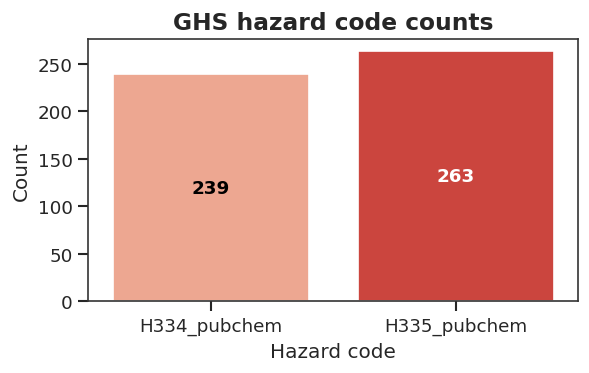

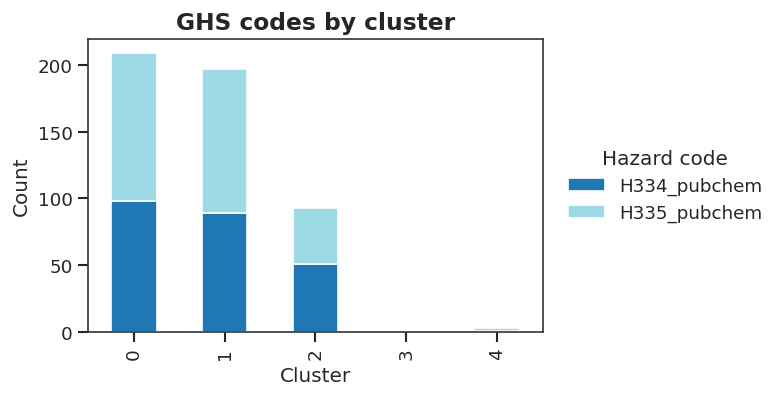

In [33]:
# GHS H334/H335 summary plots
if 'isoc_clustered' in globals() and 'H334_pubchem' in isoc_clustered.columns:
    counts = isoc_clustered[['H334_pubchem', 'H335_pubchem']].fillna(0).astype(int).sum()
    fig, ax = plt.subplots(figsize=(4.8, 3.0), constrained_layout=True)
    sns.barplot(x=counts.index, y=counts.values, hue=counts.index, palette='Reds', legend=False, ax=ax)
    ax.set_title('GHS hazard code counts')
    ax.set_xlabel('Hazard code')
    ax.set_ylabel('Count')
    annotate_bars_center(ax)
    clean_ax(ax)
    save_fig('ghs_hazard_code_counts', fig)
    plt.show()

    # Stacked bar by cluster if available
    if 'cluster_km' in isoc_clustered.columns:
        tab = isoc_clustered.groupby('cluster_km')[['H334_pubchem', 'H335_pubchem']].sum()
        fig, ax = plt.subplots(figsize=(6.4, 3.2), constrained_layout=True)
        tab.plot(kind='bar', stacked=True, colormap='tab20', ax=ax)
        ax.set_title('GHS codes by cluster')
        ax.set_xlabel('Cluster')
        ax.set_ylabel('Count')
        legend_outside(ax, title='Hazard code', loc='center left', bbox_to_anchor=(1.02, 0.5))
        clean_ax(ax)
        save_fig('ghs_codes_by_cluster', fig)
        plt.show()
else:
    print('Run PubChem GHS cell first.')


/tmp/ipykernel_412593/228389109.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=15, ha='right')


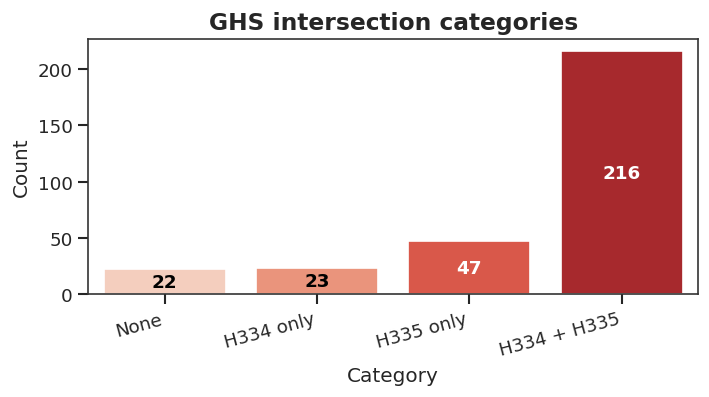

/tmp/ipykernel_412593/228389109.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=15, ha='right')


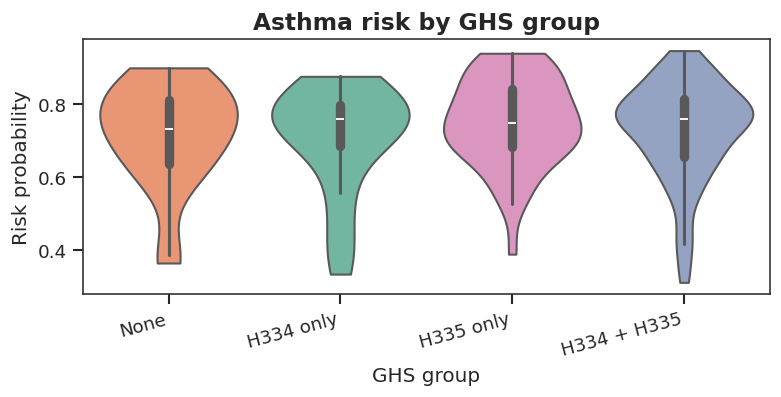

/tmp/ipykernel_412593/2358168510.py:42: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc=loc, bbox_to_anchor=bbox_to_anchor, frameon=False, title=title)


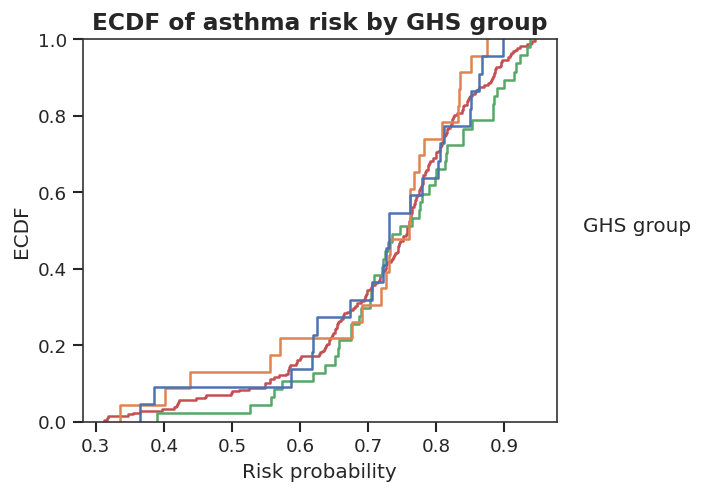

In [34]:
# Additional GHS intersection and risk plots
if 'isoc_clustered' in globals() and 'H334_pubchem' in isoc_clustered.columns:
    ghs_tmp = isoc_clustered[['H334_pubchem','H335_pubchem']].fillna(0).astype(int)
    def ghs_group(row):
        h334, h335 = int(row['H334_pubchem']), int(row['H335_pubchem'])
        if h334 and h335: return 'H334 + H335'
        if h334: return 'H334 only'
        if h335: return 'H335 only'
        return 'None'
    groups = ghs_tmp.apply(ghs_group, axis=1)
    order = ['None','H334 only','H335 only','H334 + H335']
    counts = groups.value_counts().reindex(order, fill_value=0)

    fig, ax = plt.subplots(figsize=(5.8, 3.2), constrained_layout=True)
    sns.barplot(x=counts.index, y=counts.values, hue=counts.index, palette='Reds', legend=False, ax=ax)
    ax.set_title('GHS intersection categories')
    ax.set_xlabel('Category')
    ax.set_ylabel('Count')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=15, ha='right')
    annotate_bars_center(ax)
    clean_ax(ax)
    save_fig('ghs_intersection_categories', fig)
    plt.show()

    if 'asthma_risk_proba' in isoc_clustered.columns:
        df_plot = isoc_clustered.copy()
        df_plot['GHS_group'] = groups.values
        fig, ax = plt.subplots(figsize=(6.4, 3.2), constrained_layout=True)
        sns.violinplot(
            data=df_plot,
            x='GHS_group',
            y='asthma_risk_proba',
            order=order,
            hue='GHS_group',
            dodge=False,
            cut=0,
            inner='box',
            palette='Set2',
            ax=ax,
        )
        if ax.get_legend() is not None:
            ax.get_legend().remove()
        ax.set_title('Asthma risk by GHS group')
        ax.set_xlabel('GHS group')
        ax.set_ylabel('Risk probability')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=15, ha='right')
        clean_ax(ax)
        save_fig('ghs_group_vs_asthma_risk', fig)
        plt.show()

        fig, ax = plt.subplots(figsize=(5.8, 4.0), constrained_layout=True)
        sns.ecdfplot(data=df_plot, x='asthma_risk_proba', hue='GHS_group', hue_order=order, ax=ax)
        ax.set_title('ECDF of asthma risk by GHS group')
        ax.set_xlabel('Risk probability')
        ax.set_ylabel('ECDF')
        legend_outside(ax, title='GHS group', loc='center left', bbox_to_anchor=(1.02, 0.5))
        clean_ax(ax)
        save_fig('ghs_group_asthma_risk_ecdf', fig)
        plt.show()
else:
    print('Run PubChem GHS cell first.')


### Combined export

Merge candidate clustering, risk scores, GHS flags, cell-line accessibility, and affinity fingerprints.


In [35]:
if "aff_df" in globals():
    pivot_aff = aff_df.pivot_table(index="SMILES", columns="target_id", values="pred_pAff", aggfunc="mean")
    pivot_aff.columns = [f"pAff_{c}" for c in pivot_aff.columns]
    combined = isoc_clustered.merge(pivot_aff, on="SMILES", how="left")
else:
    combined = isoc_clustered.copy()

combined_path = cfg.results_dir / "isocyanates_combined_risk_affinity.csv"
combined.to_csv(combined_path, index=False)
print(f"Saved combined table: {combined_path}")


Saved combined table: results/isocyanates_combined_risk_affinity.csv


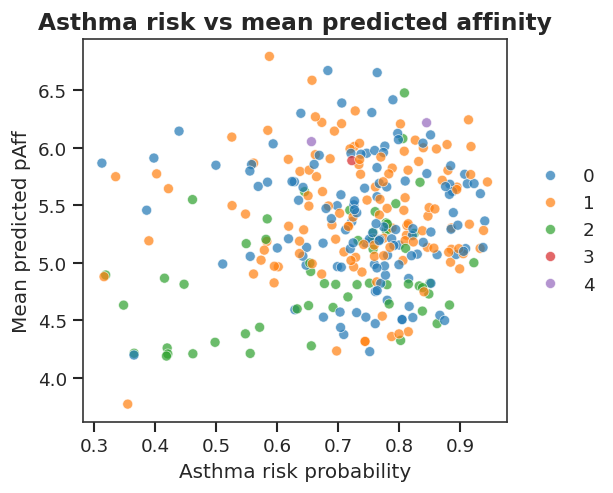

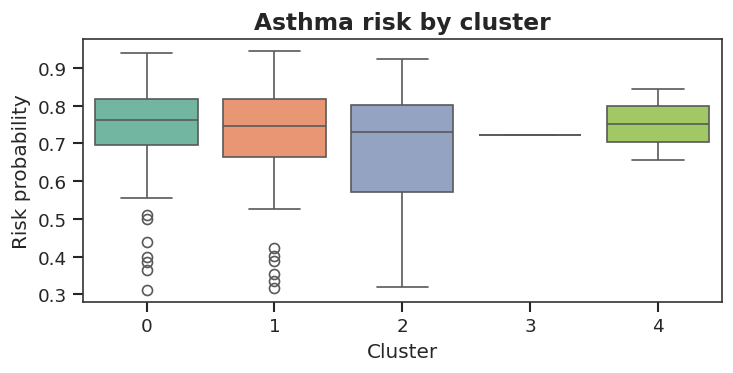

In [36]:
# Combined risk vs affinity plots
if 'combined' in globals() and 'asthma_risk_proba' in combined.columns:
    # Average affinity per compound if affinity columns exist
    aff_cols = [c for c in combined.columns if c.startswith('pAff_')]
    if aff_cols:
        combined['mean_pAff'] = combined[aff_cols].mean(axis=1)
        fig, ax = plt.subplots(figsize=(5, 4), constrained_layout=True)
        sns.scatterplot(
            data=combined,
            x='asthma_risk_proba',
            y='mean_pAff',
            hue='cluster_km' if 'cluster_km' in combined.columns else None,
            palette=globals().get('CLUSTER_PALETTE', 'mako'),
            alpha=0.7,
            ax=ax,
        )
        if ax.get_legend() is not None:
            ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), frameon=False, title=None)
        ax.set_title('Asthma risk vs mean predicted affinity')
        ax.set_xlabel('Asthma risk probability')
        ax.set_ylabel('Mean predicted pAff')
        save_fig('risk_vs_mean_affinity', fig)
        plt.show()

    # Risk distribution by cluster
    if 'cluster_km' in combined.columns:
        fig, ax = plt.subplots(figsize=(6, 3), constrained_layout=True)
        ax = sns.boxplot(data=combined, x='cluster_km', y='asthma_risk_proba', hue='cluster_km', dodge=False, palette=globals().get('CLUSTER_PALETTE', 'mako'), ax=ax)
        if ax.get_legend() is not None:
            ax.get_legend().remove()
        ax.set_title('Asthma risk by cluster')
        ax.set_xlabel('Cluster')
        ax.set_ylabel('Risk probability')
        save_fig('asthma_risk_by_cluster_combined', fig)
        plt.show()
else:
    print('Run combined export cell first.')


## MOF design: risk compounds → metals & organic linkers

本节逻辑：
1) 从最终汇总表中筛选“高风险化合物”（使用 label 或者 proba 阈值）
2) 判断高风险化合物是否“回归”到早期聚类的某一个主导簇（高占比簇）
3) 抽取目标集（主导簇或风险集）的公共理化/配位特征
4) 用 QMOF 元数据（`Data/QMOF/qmof.csv`）筛选满足孔径约束的 MOF，统计排名推荐的金属离子与有机配体（linker SMILES）。

可用环境变量（可选）：
- `AM_MOF_RISK_MODE` = `label` 或 `threshold`
- `AM_MOF_RISK_THRESHOLD`
- `AM_MOF_CLUSTER_MIN_FRAC`, `AM_MOF_CLUSTER_MIN_N`, `AM_MOF_FOCUS_CLUSTER`
- `AM_MOF_MIN_PLD`, `AM_MOF_MIN_LCD` （默认 `auto`）
- `AM_MOF_DATA_DIR`, `AM_QMOF_CSV`


In [ ]:
# Cell - MOF screening (1): select focus set + physchem/coordination profile
import os
from pathlib import Path
from collections import Counter
import ast

import numpy as np
import pandas as pd
from IPython.display import display

from rdkit import Chem, RDLogger
from rdkit.Chem import Descriptors, rdMolDescriptors

# Silence RDKit valence warnings (QMOF linkers can be charge-heavy)
RDLogger.DisableLog('rdApp.error')
RDLogger.DisableLog('rdApp.warning')

# Load the merged candidate table (preferred: in-memory `combined` from previous cells)
combined_path = cfg.results_dir / "isocyanates_combined_risk_affinity.csv"
if 'combined' not in globals():
    if combined_path.exists():
        combined = pd.read_csv(combined_path)
    else:
        raise RuntimeError(
            "Run the combined export cell first (or provide results/isocyanates_combined_risk_affinity.csv)."
        )

# 1) Select high-risk compounds
RISK_MODE = os.environ.get('AM_MOF_RISK_MODE', 'label').strip().lower()
RISK_THRESHOLD = float(os.environ.get('AM_MOF_RISK_THRESHOLD', str(globals().get('thr', 0.5))))

if RISK_MODE == 'label' and 'asthma_risk_label' in combined.columns:
    risk_mask = combined['asthma_risk_label'].astype(str).eq('Asthma-associated')
else:
    risk_mask = combined['asthma_risk_proba'].astype(float).ge(RISK_THRESHOLD)

risk_df = combined[risk_mask].copy()
if risk_df.empty:
    raise ValueError(
        f"No risk compounds selected (mode={RISK_MODE}, threshold={RISK_THRESHOLD}). "
        "Try lowering AM_MOF_RISK_THRESHOLD or use AM_MOF_RISK_MODE=label."
    )

# Persist the selected risk subset (useful for downstream MOF workflows)
risk_out = cfg.results_dir / 'risk_compounds_for_mof.csv'
risk_df.to_csv(risk_out, index=False)
print(f"Risk compounds: {len(risk_df)} / {len(combined)} | saved: {risk_out}")

# 2) Decide whether risk compounds map back to a dominant original cluster
DOM_MIN_FRAC = float(os.environ.get('AM_MOF_CLUSTER_MIN_FRAC', '0.70'))
DOM_MIN_N = int(os.environ.get('AM_MOF_CLUSTER_MIN_N', '20'))
FORCE_CLUSTER = os.environ.get('AM_MOF_FOCUS_CLUSTER', '').strip()

dominant_cluster = None
dominant_info = {}

if FORCE_CLUSTER:
    try:
        dominant_cluster = int(FORCE_CLUSTER)
        dominant_info = {'mode': 'forced', 'cluster': dominant_cluster}
    except Exception:
        dominant_cluster = None
        dominant_info = {'mode': 'forced', 'cluster': FORCE_CLUSTER, 'error': 'not an int'}
elif 'cluster_km' in risk_df.columns:
    vc = risk_df['cluster_km'].value_counts(dropna=True)
    if not vc.empty:
        top_cluster = int(vc.index[0])
        top_n = int(vc.iloc[0])
        frac = top_n / len(risk_df)
        dominant_info = {'mode': 'auto', 'cluster': top_cluster, 'n': top_n, 'frac': frac}
        if top_n >= DOM_MIN_N and frac >= DOM_MIN_FRAC:
            dominant_cluster = top_cluster

if dominant_cluster is not None and 'cluster_km' in combined.columns:
    # Follow the user's logic: if risk compounds map back to one cluster, use that cluster's common profile
    focus_df = combined[combined['cluster_km'].astype(int).eq(int(dominant_cluster))].copy()
    focus_mode = f"cluster_{dominant_cluster}"
else:
    # Otherwise, analyze only the selected risk compounds
    focus_df = risk_df.copy()
    focus_mode = 'risk_set'

print('Dominant-cluster check:', dominant_info)
print(f"Focus mode: {focus_mode} | focus_n={len(focus_df)}")

if 'cluster_km' in risk_df.columns:
    display(risk_df['cluster_km'].value_counts().rename('risk_count_by_cluster').to_frame())

# 3) Common physchem / coordination profile
PHYS_COLS = [
    'MolWt', 'MolLogP', 'TPSA', 'HBD', 'HBA', 'RotatableBonds', 'AromaticRings',
    'MolMR_volume_proxy', 'LabuteASA',
    'PBF', 'PMI1', 'PMI2', 'PMI3', 'InertialShapeFactor', 'Asphericity', 'Eccentricity',
    'NPR1', 'NPR2', 'RadiusOfGyration',
]
PHYS_COLS = [c for c in PHYS_COLS if c in focus_df.columns]
COORD_COLS = [c for c in focus_df.columns if str(c).startswith('coord_')]

profile_cols = PHYS_COLS + COORD_COLS
profile = focus_df[profile_cols].describe(percentiles=[0.10, 0.25, 0.50, 0.75, 0.90]).T
profile = profile.rename(columns={'10%': 'p10', '50%': 'p50', '90%': 'p90'})
profile = profile[['count', 'mean', 'std', 'min', 'p10', 'p50', 'p90', 'max']]

profile_path = cfg.results_dir / f"mof_focus_profile_{focus_mode}.csv"
profile.to_csv(profile_path)
print(f"Saved focus profile: {profile_path}")
display(profile)

coord_presence = None
if COORD_COLS:
    coord_presence = (focus_df[COORD_COLS].fillna(0).astype(float) > 0).mean().sort_values(ascending=False)
    display(coord_presence.rename('presence_frac').to_frame())

# Auto pore heuristic from compound size (override with AM_MOF_MIN_PLD / AM_MOF_MIN_LCD)
MIN_PLD_ENV = os.environ.get('AM_MOF_MIN_PLD', 'auto').strip().lower()
MIN_LCD_ENV = os.environ.get('AM_MOF_MIN_LCD', 'auto').strip().lower()

MOF_MIN_PLD_AUTO = 3.5
if 'RadiusOfGyration' in focus_df.columns and focus_df['RadiusOfGyration'].notna().any():
    rg90 = float(focus_df['RadiusOfGyration'].dropna().quantile(0.90))
    # heuristic: pld >= 1.5*Rg(p90) + margin
    MOF_MIN_PLD_AUTO = max(3.5, 1.5 * rg90 + 0.5)

MOF_MIN_PLD = float(MIN_PLD_ENV) if MIN_PLD_ENV not in {'', 'auto'} else float(MOF_MIN_PLD_AUTO)
MOF_MIN_LCD = float(MIN_LCD_ENV) if MIN_LCD_ENV not in {'', 'auto'} else float(MOF_MIN_PLD + 0.5)

print(f"MOF pore filters: min_PLD={MOF_MIN_PLD:.2f} Å | min_LCD={MOF_MIN_LCD:.2f} Å")


In [ ]:
# Cell - MOF screening (2): QMOF filter → rank metals & linkers
MOF_DATA_DIR = Path(os.environ.get('AM_MOF_DATA_DIR', 'Data'))
QMOF_CSV = Path(os.environ.get('AM_QMOF_CSV', str(MOF_DATA_DIR / 'QMOF' / 'qmof.csv')))
focus_mode = globals().get('focus_mode', 'risk_set')

if not QMOF_CSV.exists():
    raise FileNotFoundError(f"Missing QMOF metadata CSV: {QMOF_CSV}")

qmof_usecols = [
    'qmof_id',
    'name',
    'info.pld',
    'info.lcd',
    'info.density',
    'info.synthesized',
    'info.source',
    'info.doi',
    'info.mofid.smiles_nodes',
    'info.mofid.smiles_linkers',
    'info.mofid.smiles',
]

available_cols = set(pd.read_csv(QMOF_CSV, nrows=0).columns)
qmof = pd.read_csv(QMOF_CSV, usecols=[c for c in qmof_usecols if c in available_cols])
for c in ['info.pld', 'info.lcd', 'info.density']:
    if c in qmof.columns:
        qmof[c] = pd.to_numeric(qmof[c], errors='coerce')

mask = pd.Series(True, index=qmof.index)
if 'info.pld' in qmof.columns:
    mask &= qmof['info.pld'].ge(MOF_MIN_PLD)
if 'info.lcd' in qmof.columns:
    mask &= qmof['info.lcd'].ge(MOF_MIN_LCD)

mof_candidates = qmof[mask].copy()
print(f"QMOF rows: {len(qmof)} | candidates after pore filter: {len(mof_candidates)}")

# Helpers
NON_METAL_Z = {1, 5, 6, 7, 8, 9, 14, 15, 16, 17, 34, 35, 53}  # H,B,C,N,O,F,Si,P,S,Cl,Se,Br,I

def _parse_pylist_cell(x):
    if x is None or (isinstance(x, float) and np.isnan(x)):
        return []
    if isinstance(x, list):
        return [str(v) for v in x]
    s = str(x).strip()
    if not s or s.lower() in {'nan', 'none'}:
        return []
    try:
        v = ast.literal_eval(s)
        if isinstance(v, list):
            return [str(i) for i in v]
    except Exception:
        pass
    return [s]

def _extract_metals_from_nodes(node_smiles_list):
    metals = set()
    for smi in node_smiles_list:
        smi = str(smi).strip()
        if not smi:
            continue
        mol = Chem.MolFromSmiles(smi)
        if mol is None:
            continue
        for atom in mol.GetAtoms():
            z = atom.GetAtomicNum()
            if z and z not in NON_METAL_Z:
                metals.add(atom.GetSymbol())
    return sorted(metals)

def _canon_smiles(smi: str):
    smi = str(smi).strip()
    if not smi:
        return None
    mol = Chem.MolFromSmiles(smi)
    if mol is None:
        return None
    return Chem.MolToSmiles(mol)

metal_counts = Counter()
linker_counts = Counter()

metals_col = []
linkers_col = []

for _, row in mof_candidates.iterrows():
    nodes = _parse_pylist_cell(row.get('info.mofid.smiles_nodes'))
    linkers = _parse_pylist_cell(row.get('info.mofid.smiles_linkers'))

    metals = _extract_metals_from_nodes(nodes)
    metals_col.append(metals)
    for m in metals:
        metal_counts[m] += 1

    seen_linkers = set()
    for l in linkers:
        c = _canon_smiles(l)
        seen_linkers.add(c if c is not None else str(l))
    linkers_sorted = sorted([x for x in seen_linkers if x and str(x).lower() not in {'nan', 'none'}])
    linkers_col.append(linkers_sorted)
    for l in linkers_sorted:
        linker_counts[l] += 1

mof_candidates = mof_candidates.reset_index(drop=True)
mof_candidates['metals'] = metals_col
mof_candidates['linkers'] = linkers_col

mof_candidates_path = cfg.results_dir / f"qmof_candidates_{focus_mode}.csv"
mof_candidates.to_csv(mof_candidates_path, index=False)
print(f"Saved QMOF candidates: {mof_candidates_path}")

metal_rank = pd.DataFrame(metal_counts.most_common(), columns=['metal', 'mof_count'])
if not metal_rank.empty:
    metal_rank['mof_frac'] = metal_rank['mof_count'] / max(1, len(mof_candidates))
metal_rank_path = cfg.results_dir / f"qmof_metal_rank_{focus_mode}.csv"
metal_rank.to_csv(metal_rank_path, index=False)
print(f"Saved metal rank: {metal_rank_path}")
display(metal_rank.head(30))

linker_rank = pd.DataFrame(linker_counts.most_common(), columns=['linker_smiles', 'mof_count'])
if not linker_rank.empty:
    linker_rank['mof_frac'] = linker_rank['mof_count'] / max(1, len(mof_candidates))
linker_rank_path = cfg.results_dir / f"qmof_linker_rank_{focus_mode}.csv"
linker_rank.to_csv(linker_rank_path, index=False)
print(f"Saved linker rank: {linker_rank_path}")
display(linker_rank.head(30))

# Optional: rank linkers by simple physchem similarity to the focus profile
TARGET_KEYS = [k for k in ['MolWt', 'TPSA', 'MolLogP', 'HBD', 'HBA'] if k in focus_df.columns]
target = {}
for k in TARGET_KEYS:
    try:
        target[k] = float(pd.to_numeric(focus_df[k], errors='coerce').dropna().median())
    except Exception:
        pass

unique_linkers = linker_rank['linker_smiles'].astype(str).tolist() if not linker_rank.empty else []
rows = []
for smi in unique_linkers:
    mol = Chem.MolFromSmiles(smi)
    if mol is None:
        continue
    rows.append({
        'linker_smiles': smi,
        'MolWt': float(Descriptors.MolWt(mol)),
        'TPSA': float(Descriptors.TPSA(mol)),
        'MolLogP': float(Descriptors.MolLogP(mol)),
        'HBD': float(Descriptors.NumHDonors(mol)),
        'HBA': float(Descriptors.NumHAcceptors(mol)),
        'AromaticRings': float(rdMolDescriptors.CalcNumAromaticRings(mol)),
    })

linker_desc = pd.DataFrame(rows)
if (not linker_desc.empty) and target:
    vec_keys = [k for k in ['MolWt', 'TPSA', 'MolLogP', 'HBD', 'HBA'] if k in target]
    tgt = np.array([target[k] for k in vec_keys], dtype=float)
    scale = np.maximum(np.abs(tgt), 1.0)
    diffs = np.abs((linker_desc[vec_keys].to_numpy(dtype=float) - tgt) / scale)
    linker_desc['match_L1'] = diffs.sum(axis=1)
    linker_desc = linker_desc.sort_values('match_L1', ascending=True)

    linker_match_path = cfg.results_dir / f"qmof_linker_similarity_{focus_mode}.csv"
    linker_desc.to_csv(linker_match_path, index=False)
    print(f"Saved linker similarity rank: {linker_match_path}")
    display(linker_desc.head(30))
else:
    print('Skipping linker similarity ranking (no RDKit-parsable linkers or missing focus descriptors).')


### Outputs

Primary CSV artifacts are written under `results/` (including `risk_compounds_for_mof.csv`, `qmof_candidates_*.csv`, `qmof_metal_rank_*.csv`, and `qmof_linker_rank_*.csv`).
